# Innlesing av pakker

In [399]:
import torch
import torchvision.transforms as transforms
import torchvision.models
from PIL import Image
import numpy as np
import os
from tqdm import tqdm
from torchvision import models
import random, shutil
from pathlib import Path
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from matplotlib.lines import Line2D
from sklearn.neighbors import NearestNeighbors
import igraph as ig
import leidenalg as la
from sklearn.neighbors import kneighbors_graph
from get_feature import trnsfrms_val, get_feature
from sklearn.cluster import SpectralClustering


# Data preprocessing

Creat text file with all image paths

In [330]:
# List of folders containing data
files = [r"../data/masked_patches",
         r"../data/masked_patches_center",
         r"../data/tubule_patches"]

# Creating text file
for file in files:
    FOLDER = Path(file)
    names = sorted(os.listdir(FOLDER))
    paths = [str((FOLDER / name).resolve()) for name in names]
    pd.DataFrame({"filename": paths}).to_csv(file + ".csv", index=False)

Extract lables

In [454]:
# Since all CSV files have the labels in the same order, we only need to
# create the label list once and reuse it for the others.
labels = []
csv_path  = r"../data/masked_patches_center.csv"

df = pd.read_csv(csv_path)

for path in df["filename"]:
    stem = Path(path).stem     
    parts = stem.split("_")
    label = parts[0]            
    labels.append(label) 

# Extract features

In [332]:
t_val = trnsfrms_val()
csv_paths  = [r"../data/masked_patches_center.csv",
              r"../data/masked_patches.csv",
              r"../data/tubule_patches.csv"]
t_val = trnsfrms_val()

features = []
for idx, path in enumerate(csv_paths):
    print(f"Dataset: {idx + 1}")
    features.append(get_feature(path, t_val))

Dataset: 1


c:\Users\olset\Medtek\5. semester\Praksis\Redigert code\extract\get_feature.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretext_model = torch.load(r'./best_ckpt.pth

Dataset: 2


c:\Users\olset\Medtek\5. semester\Praksis\Redigert code\extract\get_feature.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretext_model = torch.load(r'./best_ckpt.pth

Dataset: 3


c:\Users\olset\Medtek\5. semester\Praksis\Redigert code\extract\get_feature.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretext_model = torch.load(r'./best_ckpt.pth

# Dimensjons reduksjon

### Scaling

In [455]:
# Defines X and y
Xs = [X_mpc, X_mp, X_t]
y = np.array(labels)

# Scales the features
scaler = StandardScaler()
for i in range(len(Xs)):
    Xs[i] = scaler.fit_transform(Xs[i])

X_mpc, X_mp, X_t  = Xs

Map each label to a marker

In [456]:
marker_map = {
    'acute':   'o',
    'atrophy': 's',
    'chronic': '^',
    'normal':  'D',
}

### PCA

#### Functions 

In [457]:
def get_n_pc(X, n):
    """Return the PCA projection of X onto n principal components."""
   
    pca = PCA(n_components=n)
    X_pca = pca.fit_transform(X)
    
    return X_pca

In [458]:
def plot_pc(X_pc, y, pc_x=1, pc_y=2, dataset_name="", cluster_labels=None):
    """
    Create and show a scatter plot for two PCA components (pc_x, pc_y)
    for a single dataset (X_pca).
    """
    ix = pc_x - 1
    iy = pc_y - 1

    fig, ax = plt.subplots(figsize=(17, 8))

    if cluster_labels is None:
        for label, marker in marker_map.items():
            idx = (y == label)

            ax.scatter(
                X_pc[idx, ix],
                X_pc[idx, iy],
                marker=marker,
                label=label,
                alpha=0.8,
            )

        ax.legend(title="Label")

    else:
        clusters = np.unique(cluster_labels)
        cmap = plt.cm.get_cmap("tab10", len(clusters))

        for label, marker in marker_map.items():
            idx_label = (y == label)
            if not np.any(idx_label):
                continue

            colors_for_points = cmap(cluster_labels[idx_label])

            ax.scatter(
                X_pc[idx_label, ix],
                X_pc[idx_label, iy],
                marker=marker,
                c=colors_for_points,
                alpha=0.8,
                edgecolors="none",
                label=label,
            )

        label_legend = ax.legend(title="True label (marker)", loc="upper left")

        cluster_handles = [
            Line2D([0], [0], marker="o", linestyle="none",
                   color=cmap(c), label=f"cluster {c}")
            for c in clusters
        ]
        ax.add_artist(label_legend)
        ax.legend(handles=cluster_handles, title="Cluster (color)", loc="upper right")

    ax.set_xlabel(f"PC{pc_x}")
    ax.set_ylabel(f"PC{pc_y}")

    ax.set_title(f"{dataset_name}: PC{pc_x} vs PC{pc_y}")

    plt.tight_layout()
    plt.show()


#### PCA: masked patches center

In [459]:
X_pc_mpc = get_n_pc(X_mpc,3)

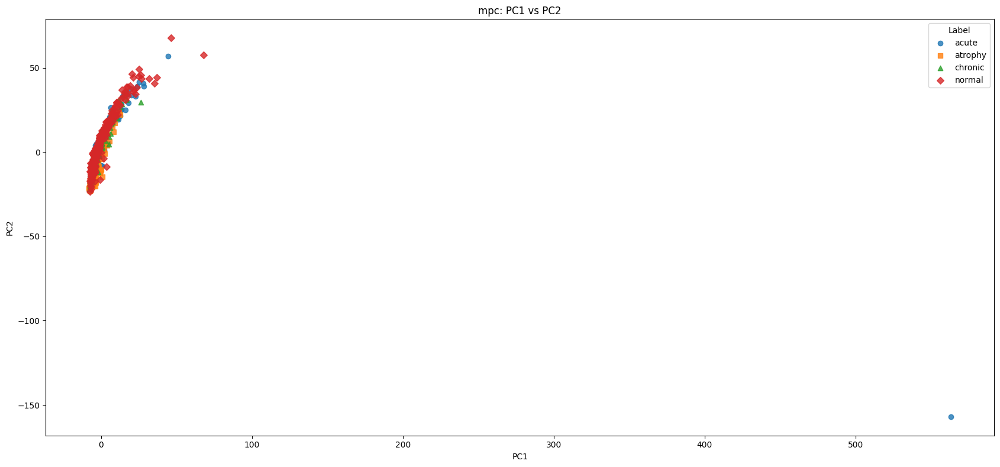

In [460]:
plot_pc(X_pc_mpc, y, pc_x=1, pc_y=2, dataset_name="mpc")

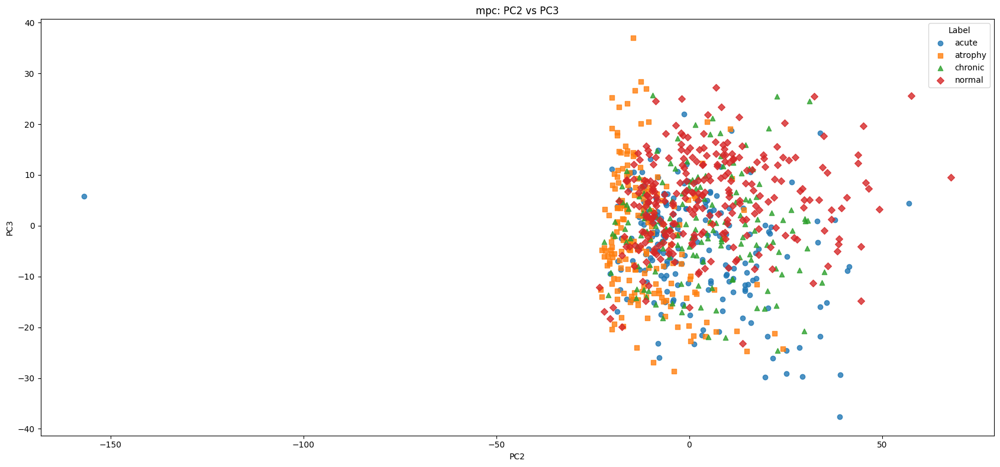

In [461]:
plot_pc(X_pc_mpc, y, pc_x=2, pc_y=3, dataset_name="mpc")

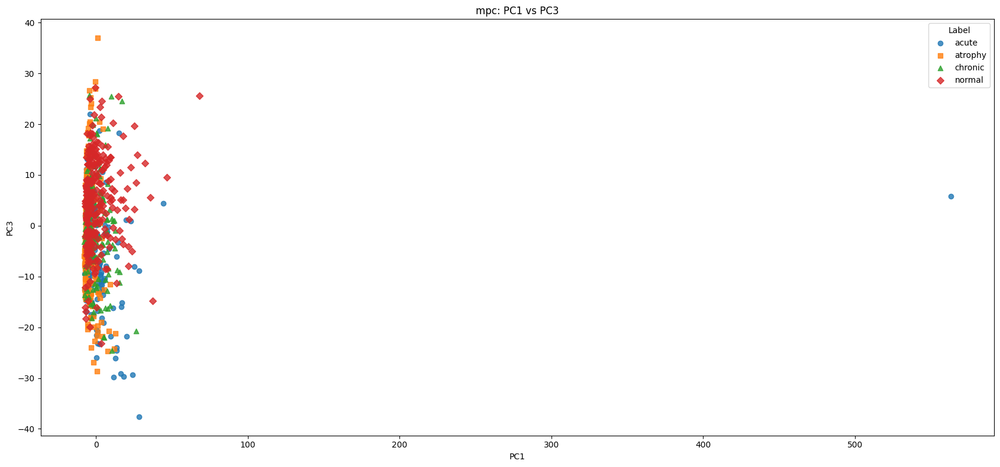

In [462]:
plot_pc(X_pc_mpc, y, pc_x=1, pc_y=3, dataset_name="mpc")

#### Without the outlayer

In [463]:
pc1 = X_pc_mpc[:, 0]   # PC1
pc2 = X_pc_mpc[:, 1]   # PC2

out_idx = np.argmax(pc1)   # index til punktet med høyest PC1
print("Outlier index:", out_idx) # 465
print("PC1, PC2:", pc1[out_idx], pc2[out_idx])
print("Label:", y[out_idx])

Outlier index: 26
PC1, PC2: 563.2374 -156.90825
Label: acute


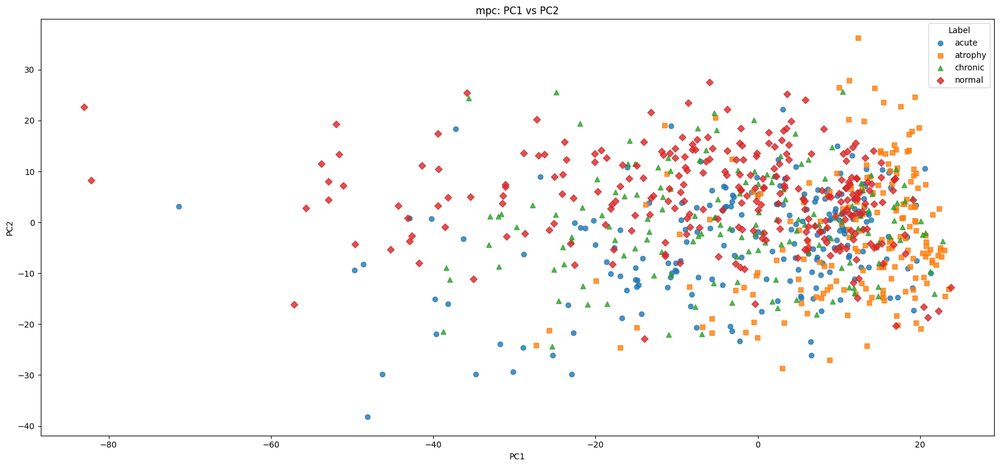

In [464]:
out_idx = 26 

X_mpc_clean = np.delete(X_mpc_scaled, out_idx, axis=0)
y_clean = np.delete(y, out_idx, axis=0)

X_pc_mpc_clean = get_n_pc(X_mpc_clean,3)
plot_pc(X_pc_mpc_clean, y_clean, pc_x=1, pc_y=2, dataset_name="mpc")

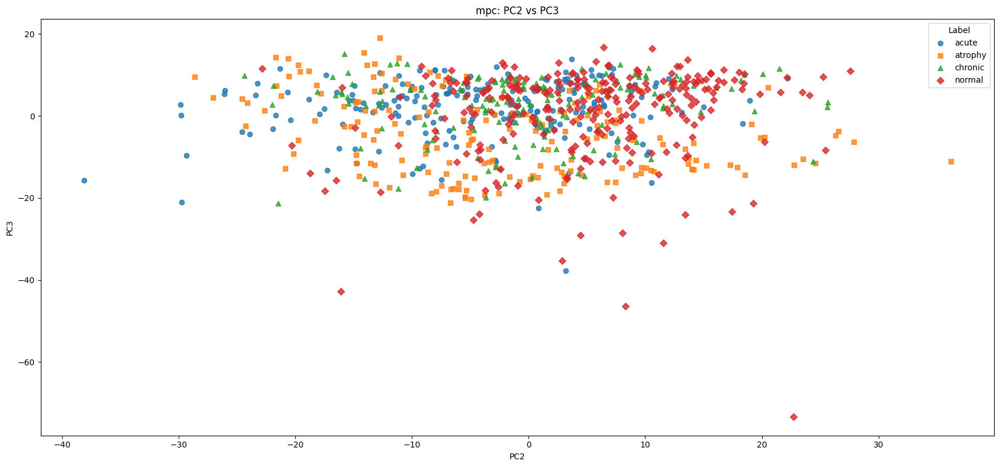

In [465]:
plot_pc(X_pc_mpc_clean, y_clean, pc_x=2, pc_y=3, dataset_name="mpc")

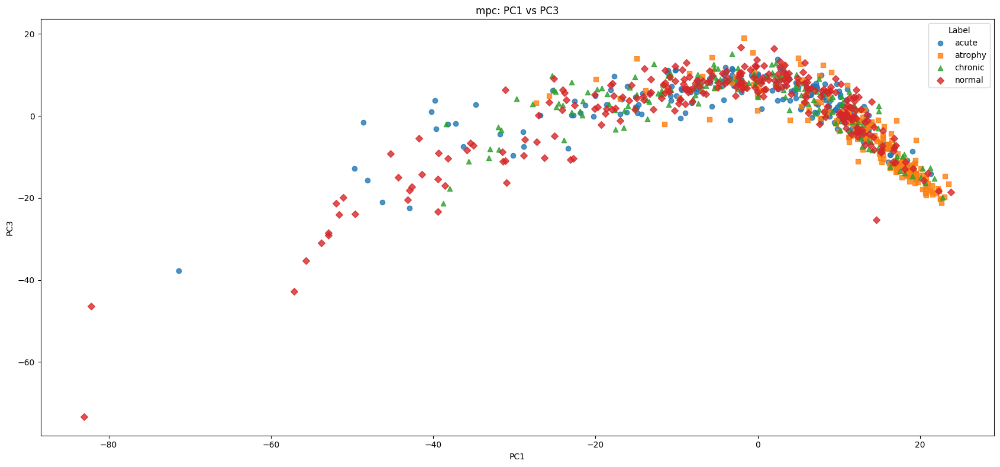

In [466]:
plot_pc(X_pc_mpc_clean, y_clean, pc_x=1, pc_y=3, dataset_name="mpc")

#### PCA: masked patches

In [467]:
X_pc_mp = get_n_pc(X_mp,3)

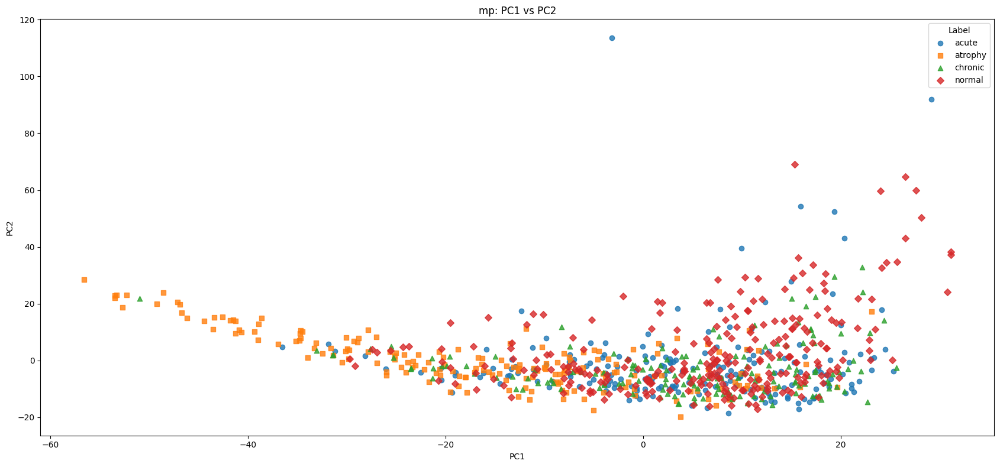

In [468]:
plot_pc(X_pc_mp, y, pc_x=1, pc_y=2, dataset_name="mp")

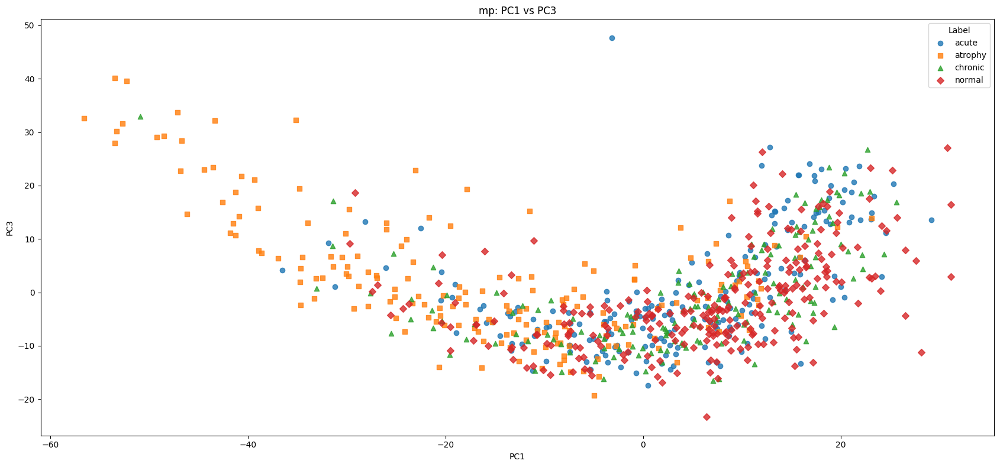

In [469]:
plot_pc(X_pc_mp, y, pc_x=1, pc_y=3, dataset_name="mp")

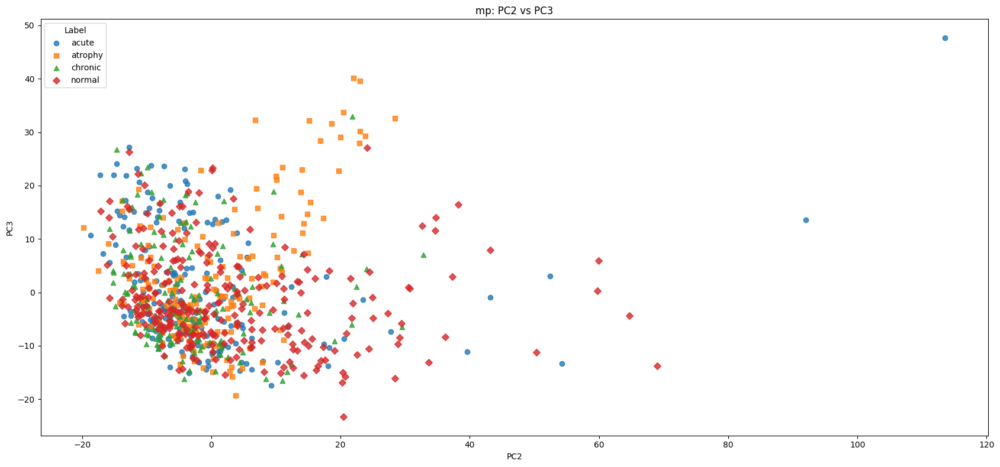

In [470]:
plot_pc(X_pc_mp, y, pc_x=2, pc_y=3, dataset_name="mp")

#### PCA: tubule patches

In [471]:
X_pc_t = get_n_pc(X_t,3)

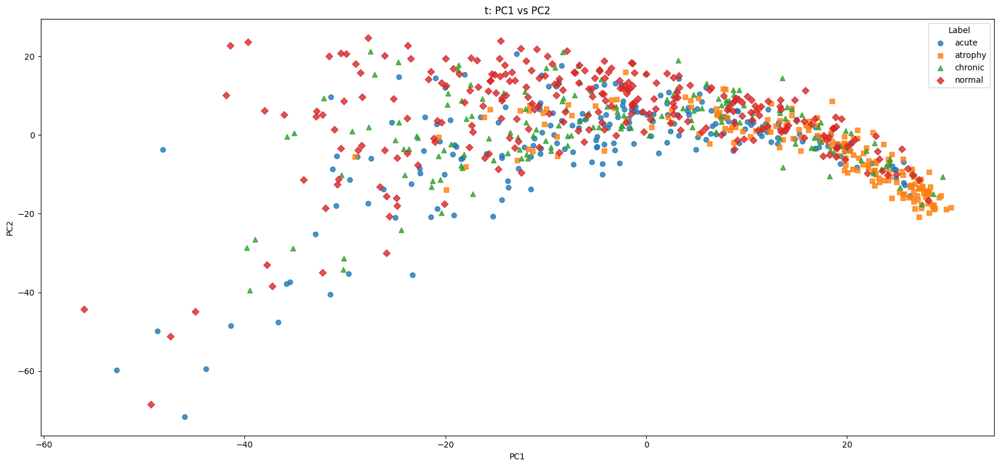

In [472]:
plot_pc(X_pc_t, y, pc_x=1, pc_y=2, dataset_name="t")

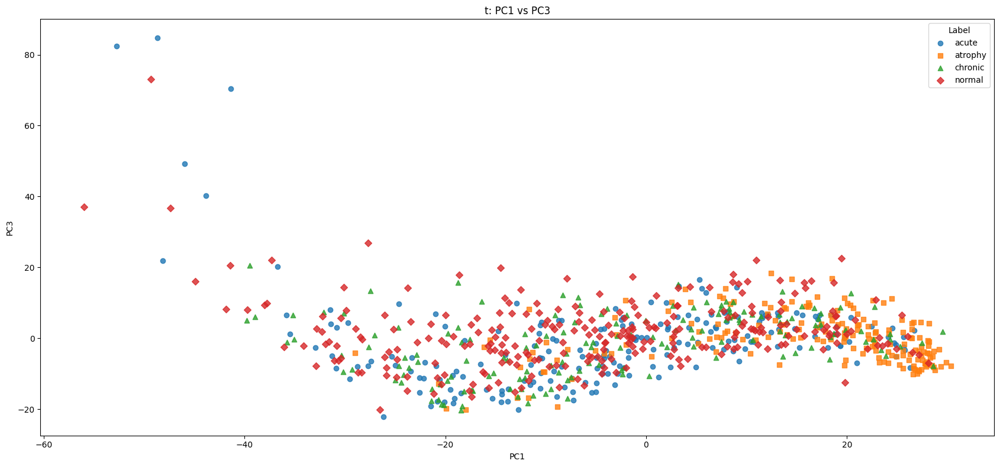

In [473]:
plot_pc(X_pc_t, y, pc_x=1, pc_y=3, dataset_name="t")

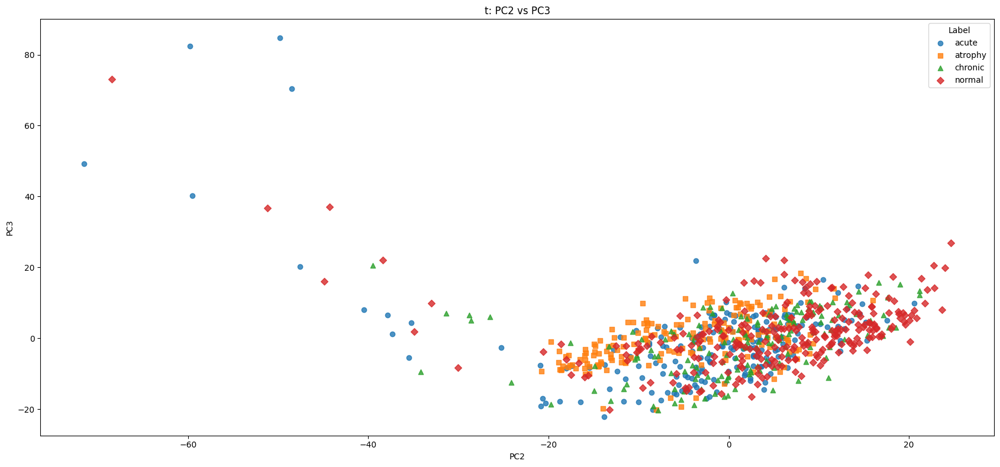

In [474]:
plot_pc(X_pc_t, y, pc_x=2, pc_y=3, dataset_name="t")

### t-SNE

#### Functions

In [475]:

def get_tsne(X, perplexity=30, random_state=0):
    """Return a t-SNE embedding of X with n_components dimensions."""
    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        random_state=random_state,
    )
    X_tsne = tsne.fit_transform(X)
    return X_tsne

In [476]:
def plot_tsne(X_tsne, y, dataset_name=""):
    """
    Create and show a scatter plot for a 2D t-SNE embedding (X_tsne)
    for a single dataset.
    """
    fig, ax = plt.subplots(figsize=(12, 8))

    for label, marker in marker_map.items():
        idx = (y == label)
        ax.scatter(
            X_tsne[idx, 0],
            X_tsne[idx, 1],
            marker=marker,
            label=label,
            alpha=0.8,
        )

    ax.set_xlabel("t-SNE 1")
    ax.set_ylabel("t-SNE 2")

    if dataset_name:
        ax.set_title(f"{dataset_name}: t-SNE")
    else:
        ax.set_title("t-SNE")

    ax.legend(title="Label")
    plt.tight_layout()
    plt.show()

#### t-SNE: masked patches center

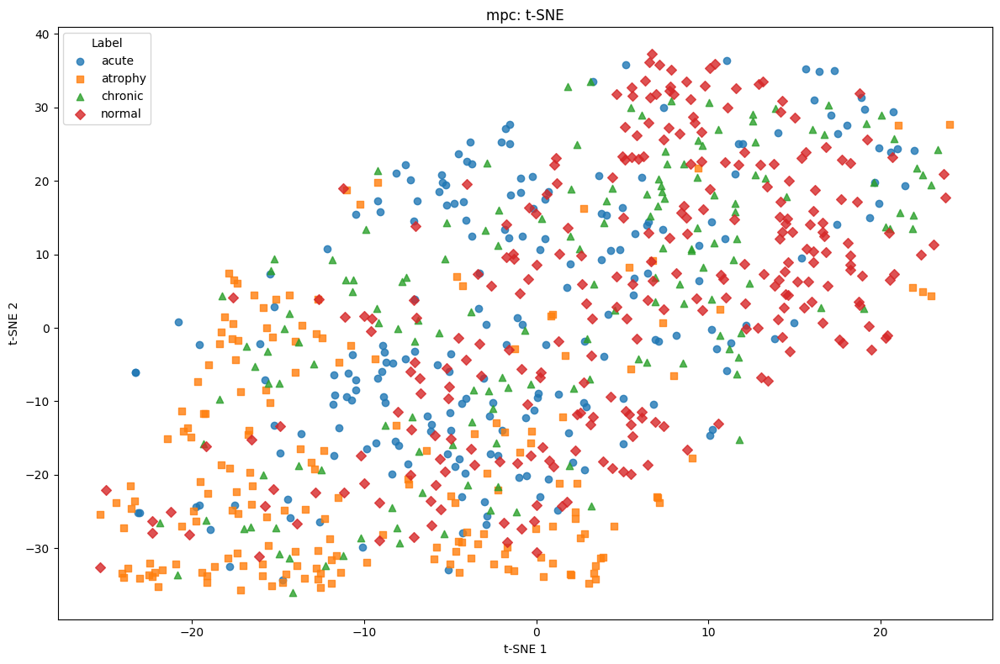

In [477]:
X_tsne_mpc = get_tsne(X_mpc)
plot_tsne(X_tsne_mpc, y, dataset_name="mpc")

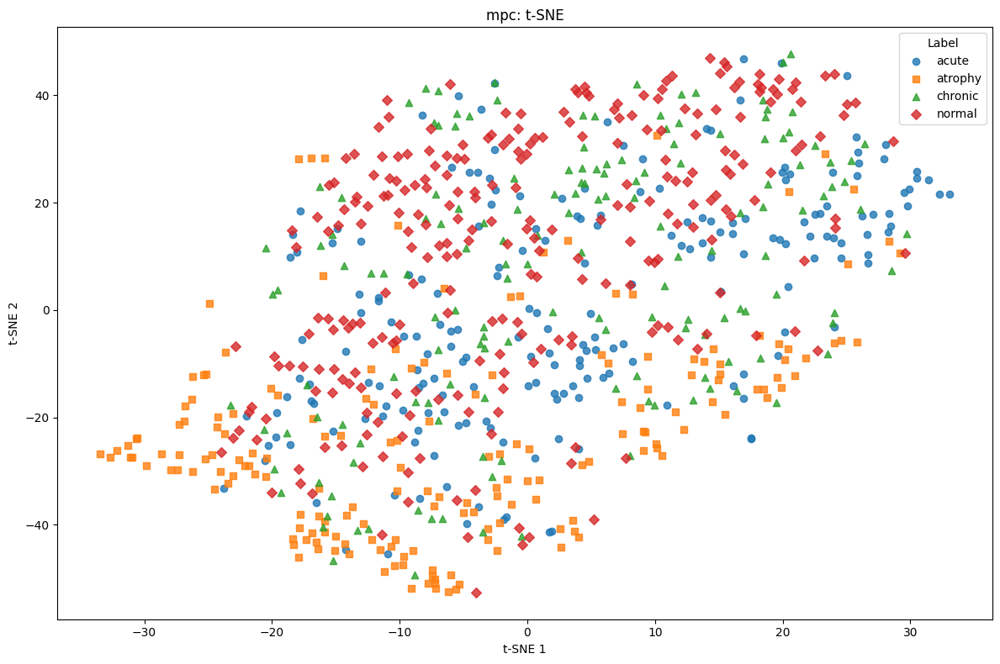

In [478]:
X_tsne_mpc = get_tsne(X_mpc, perplexity=20)
plot_tsne(X_tsne_mpc, y, dataset_name="mpc")

#### t-SNE: masked patches

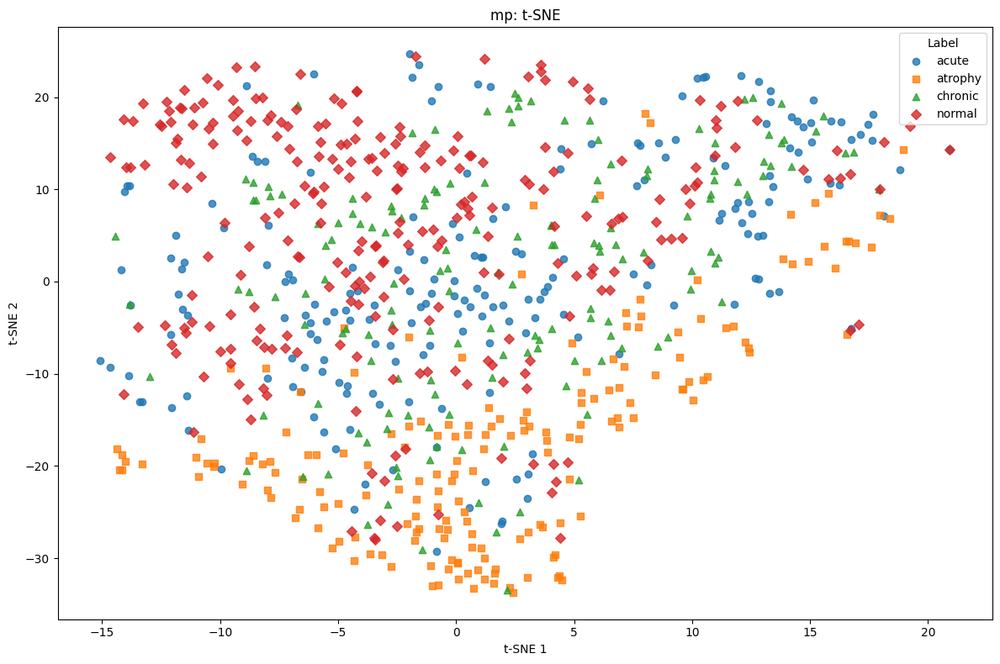

In [479]:
X_tsne_mp = get_tsne(X_mp, perplexity=30, random_state=0)
plot_tsne(X_tsne_mp, y, dataset_name="mp")

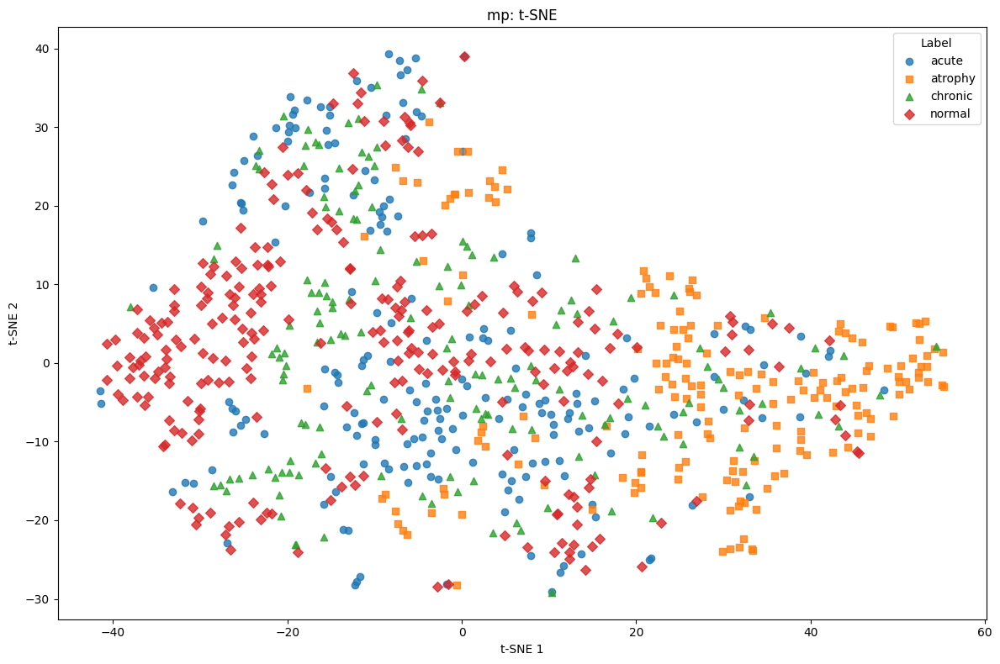

In [480]:
X_tsne_mp = get_tsne(X_mp, perplexity=15, random_state=0)
plot_tsne(X_tsne_mp, y, dataset_name="mp")

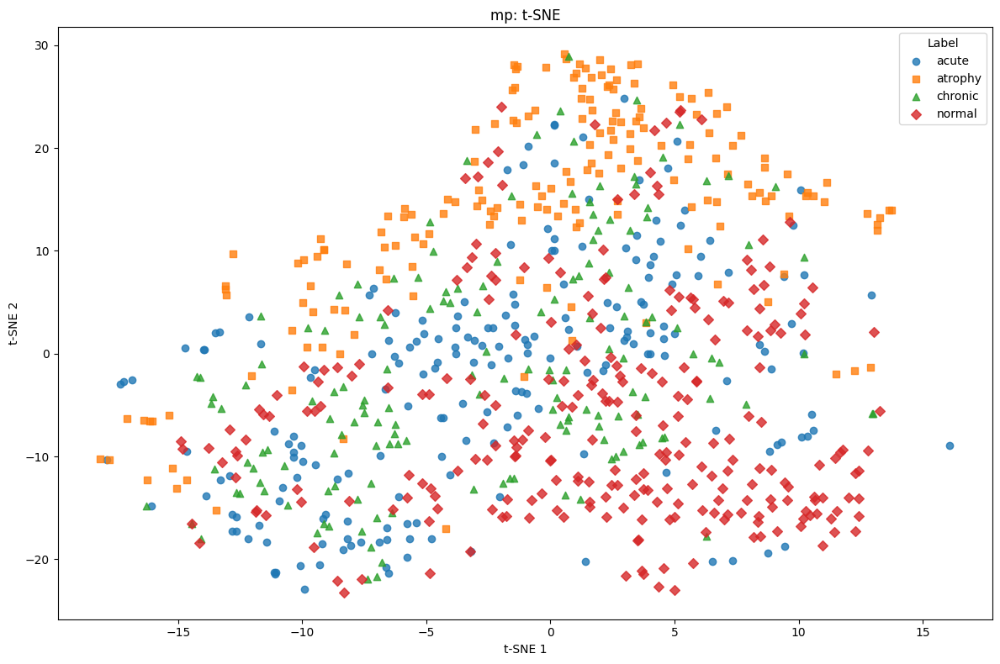

In [481]:
X_tsne_mp = get_tsne(X_mp, perplexity=35, random_state=0)
plot_tsne(X_tsne_mp, y, dataset_name="mp")

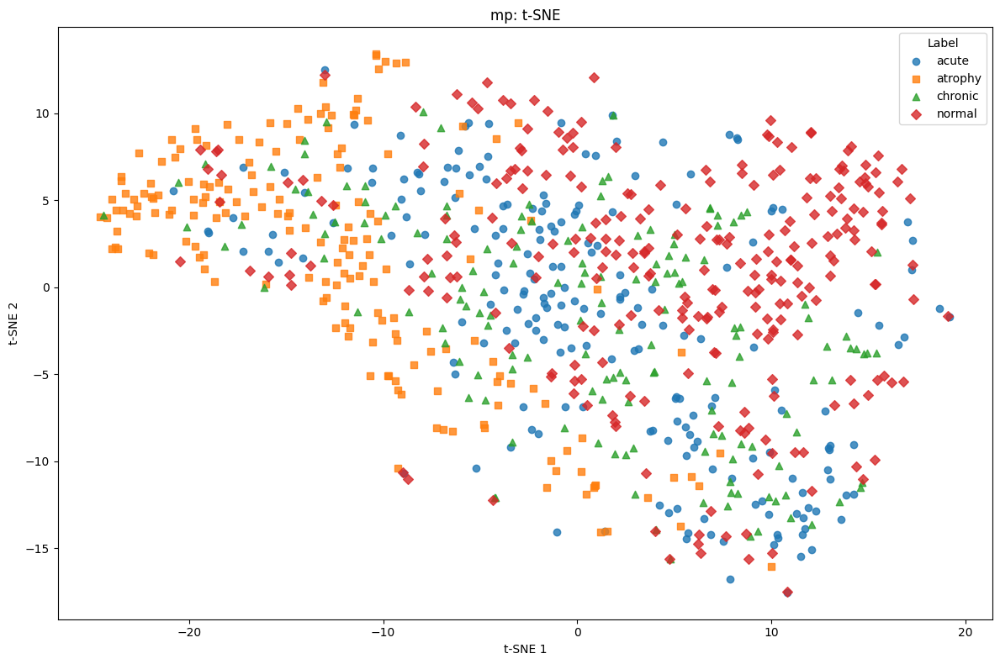

In [482]:
X_tsne_mp = get_tsne(X_mp, perplexity=40, random_state=0)
plot_tsne(X_tsne_mp, y, dataset_name="mp")

#### t-SNE: tubule patches

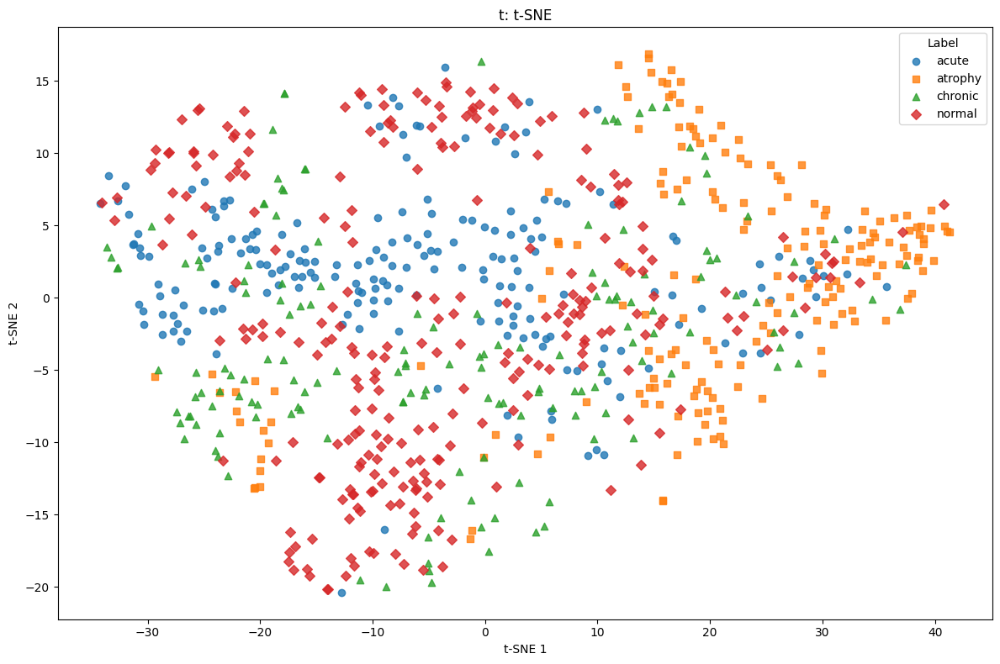

In [483]:
X_tsne_t = get_tsne(X_t, perplexity=30, random_state=0)
plot_tsne(X_tsne_t, y, dataset_name="t")

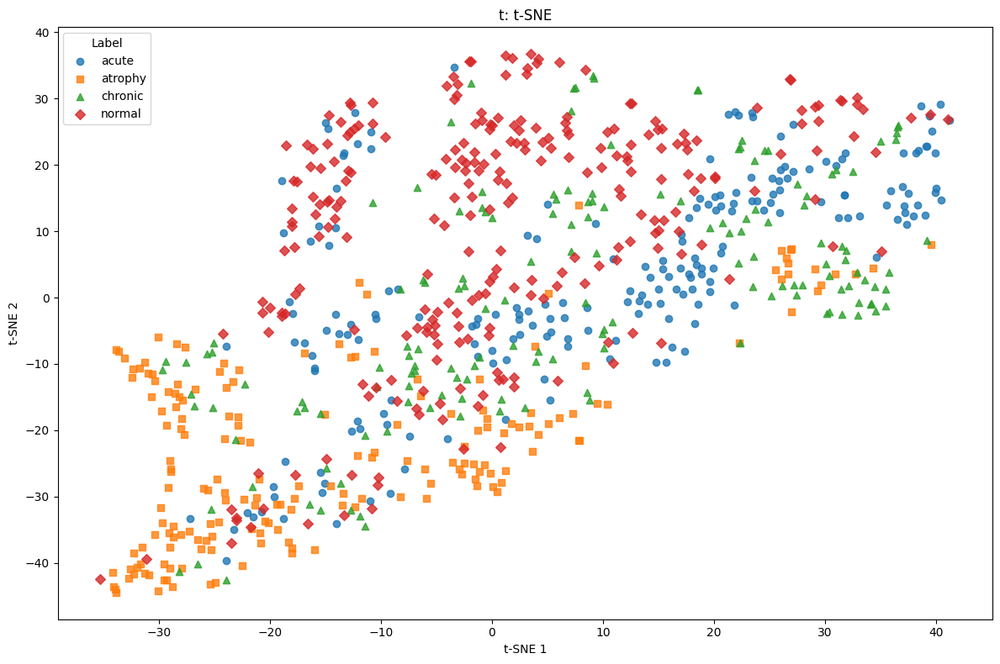

In [484]:
X_tsne_t = get_tsne(X_t, perplexity=15, random_state=0)
plot_tsne(X_tsne_t, y, dataset_name="t")

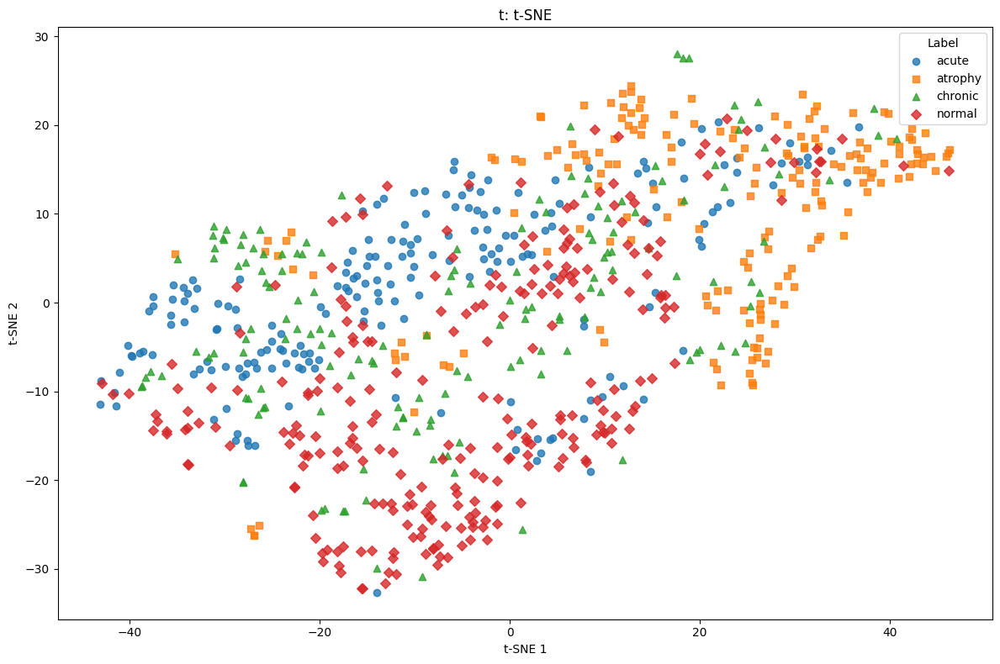

In [485]:
X_tsne_t = get_tsne(X_t, perplexity=20, random_state=0)
plot_tsne(X_tsne_t, y, dataset_name="t")

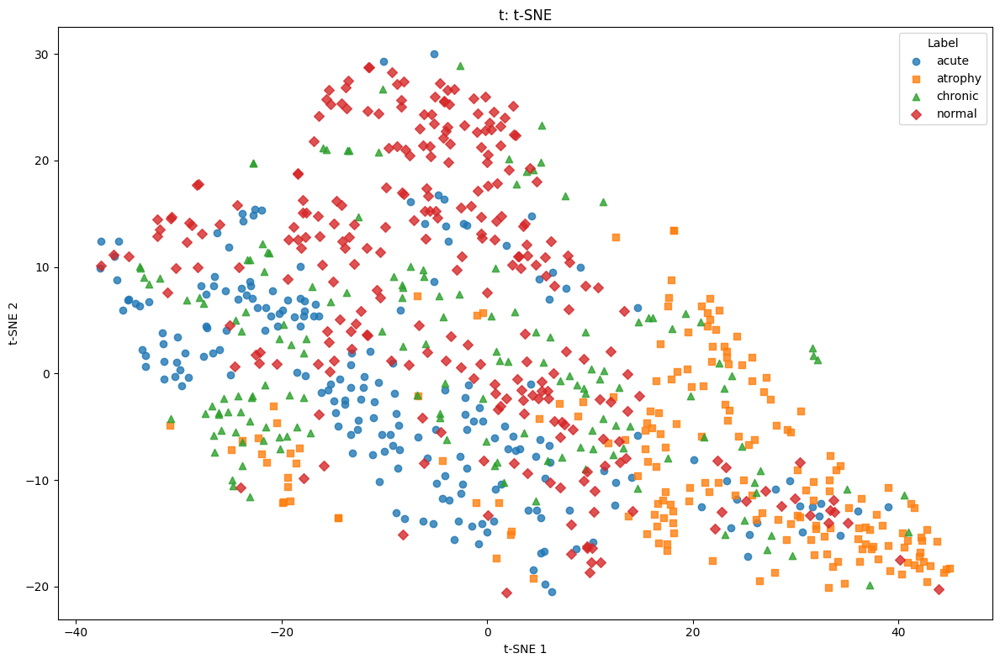

In [486]:
X_tsne_t = get_tsne(X_t, perplexity=25, random_state=0)
plot_tsne(X_tsne_t, y, dataset_name="t")

### UMAP

#### Functions

In [487]:
def get_umap_2d(X, n_neighbors=15, min_dist=0.1, random_state=0):
    """
    Return a 2D UMAP embedding of X.
    """
    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        random_state=random_state,
    )
    X_umap = reducer.fit_transform(X)
    return X_umap

In [488]:
def plot_umap(X_umap, y, dataset_name="", cluster_labels=None):
    fig, ax = plt.subplots(figsize=(12, 10))

    if cluster_labels is None:
        for label, marker in marker_map.items():
            idx = (y == label)
            if not np.any(idx):
                continue
            ax.scatter(
                X_umap[idx, 0],
                X_umap[idx, 1],
                marker=marker,
                label=label,
                alpha=0.8,
            )

        ax.legend(title="Label")

    else:
        clusters = np.unique(cluster_labels)
        cmap = plt.cm.get_cmap("tab10", len(clusters))

        for label, marker in marker_map.items():
            idx_label = (y == label)
            if not np.any(idx_label):
                continue

            colors_for_points = cmap(cluster_labels[idx_label])

            ax.scatter(
                X_umap[idx_label, 0],
                X_umap[idx_label, 1],
                marker=marker,
                c=colors_for_points,
                alpha=0.8,
                edgecolors="none",
                label=label,   
            )
        label_legend = ax.legend(title="True label (marker)", loc="upper left")

        cluster_handles = [
            Line2D([0], [0], marker="o", linestyle="none",
                   color=cmap(c), label=f"cluster {c}")
            for c in clusters
        ]
        ax.add_artist(label_legend)
        ax.legend(handles=cluster_handles, title="Cluster (color)", loc="upper right")

    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(f"{dataset_name}: UMAP")
    plt.tight_layout()
    plt.show()


In [489]:
def sweep_umap(X, y, dataset_name="", n_neighbors_list=None, min_dist_list=None, random_state=0):
    """
    Run UMAP for several (n_neighbors, min_dist) combinations and plot each result.
    """
    if n_neighbors_list is None:
        n_neighbors_list = [5, 10, 15, 30, 50]    
    if min_dist_list is None:
        min_dist_list = [0.0, 0.1, 0.3]     

    for n_n in n_neighbors_list:
        for m_d in min_dist_list:
            print(f"{dataset_name}: UMAP with n_neighbors={n_n}, min_dist={m_d}")
            X_umap = get_umap_2d(X, n_neighbors=n_n, min_dist=m_d, random_state=random_state)
            plot_umap(X_umap, y, dataset_name=f"{dataset_name} (n={n_n}, d={m_d})")

#### UMAP: mpc

C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


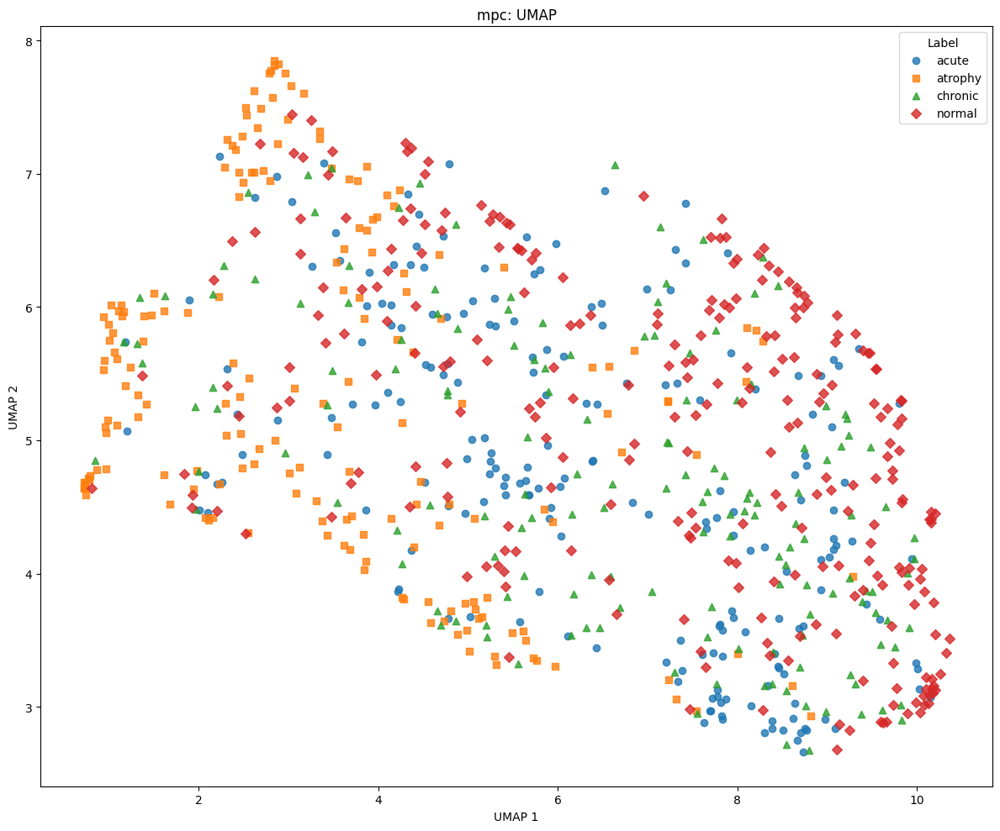

In [490]:
X_umap_mpc = get_umap_2d(X_mpc, n_neighbors=15, min_dist=0.1, random_state=0)
plot_umap(X_umap_mpc, y, dataset_name="mpc")

mpc: UMAP with n_neighbors=5, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


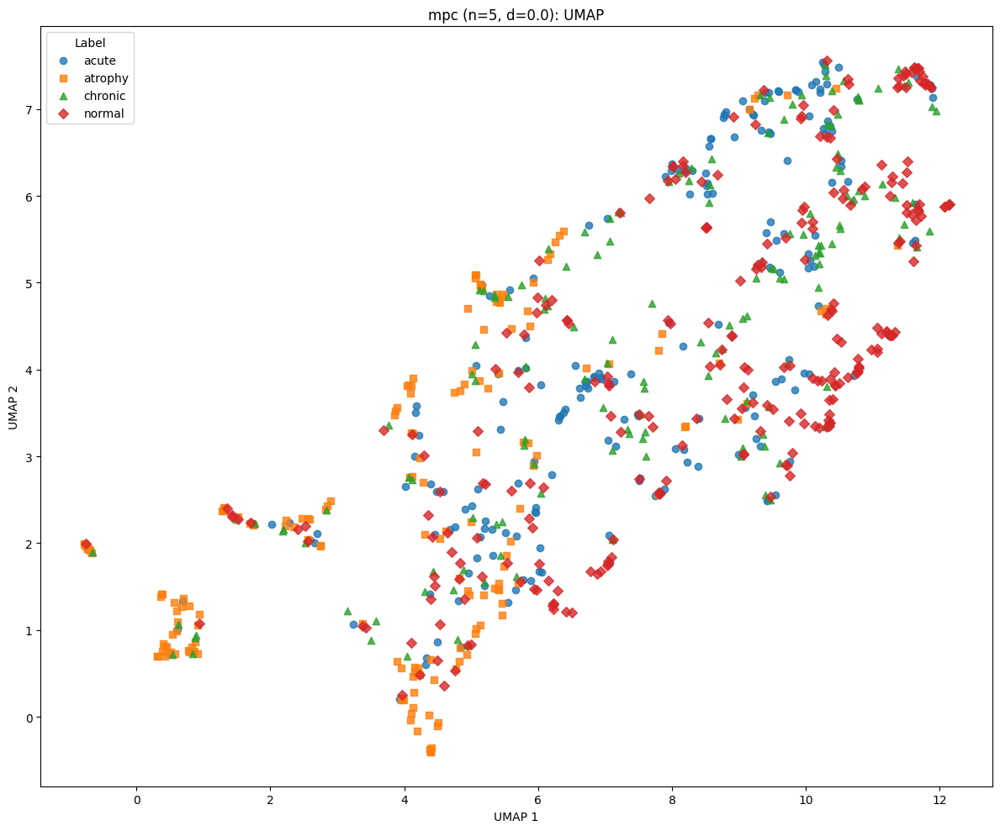

mpc: UMAP with n_neighbors=5, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


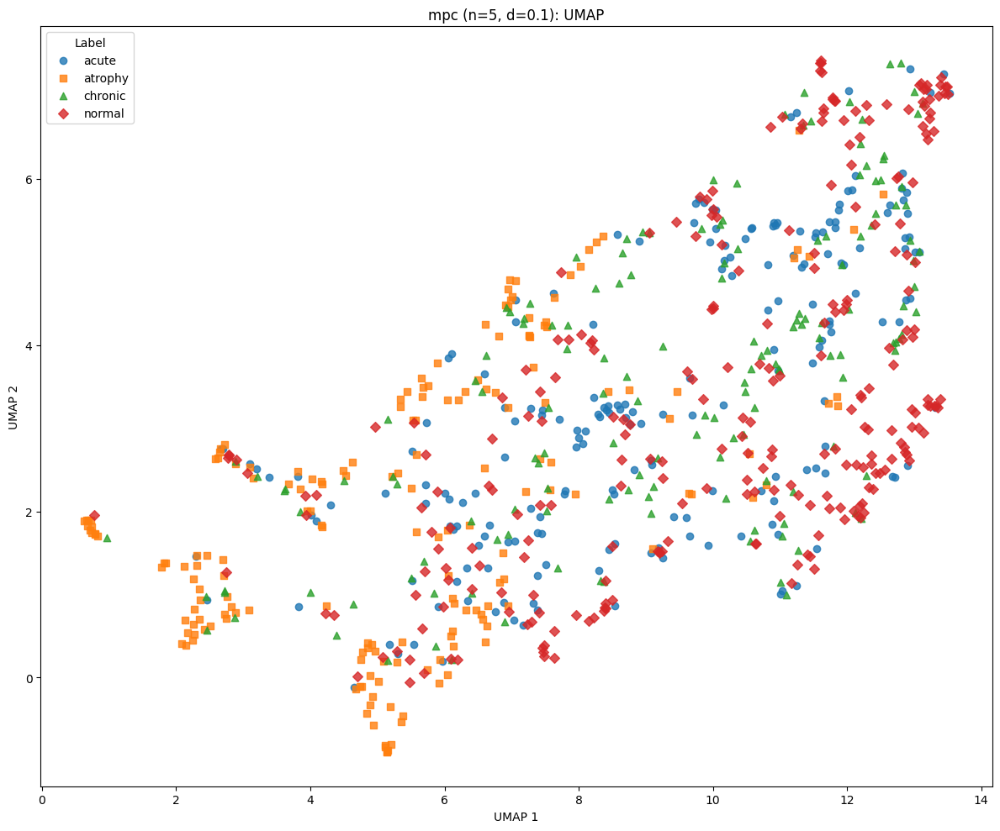

mpc: UMAP with n_neighbors=5, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


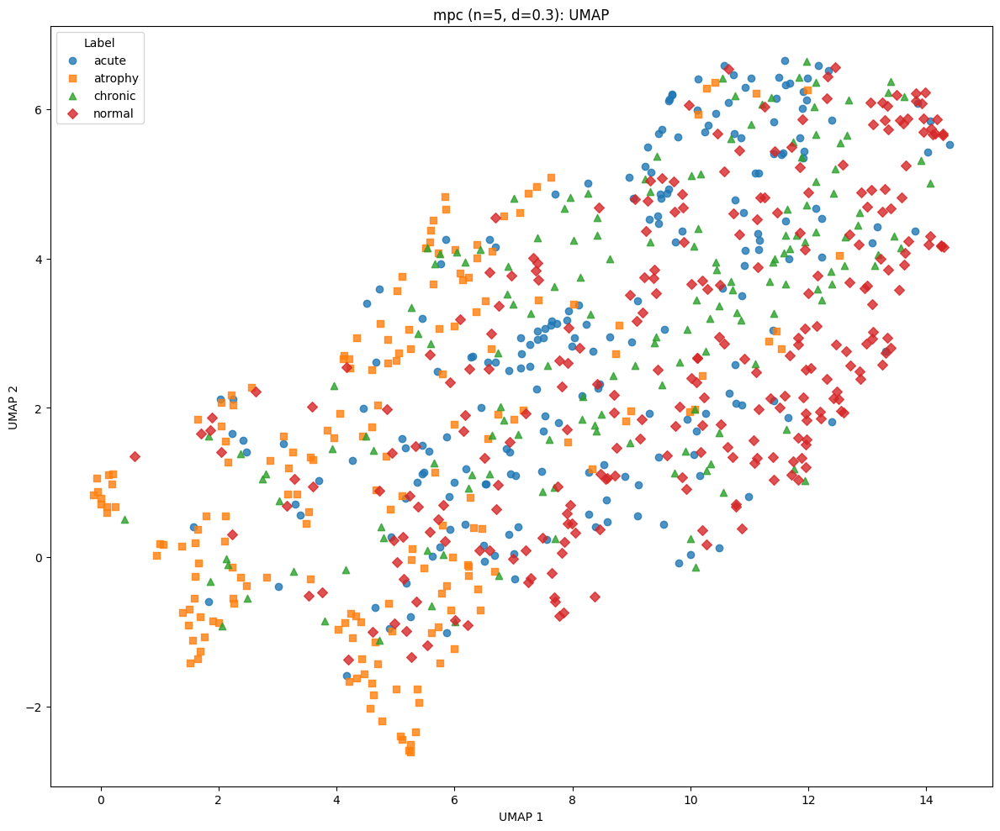

mpc: UMAP with n_neighbors=10, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


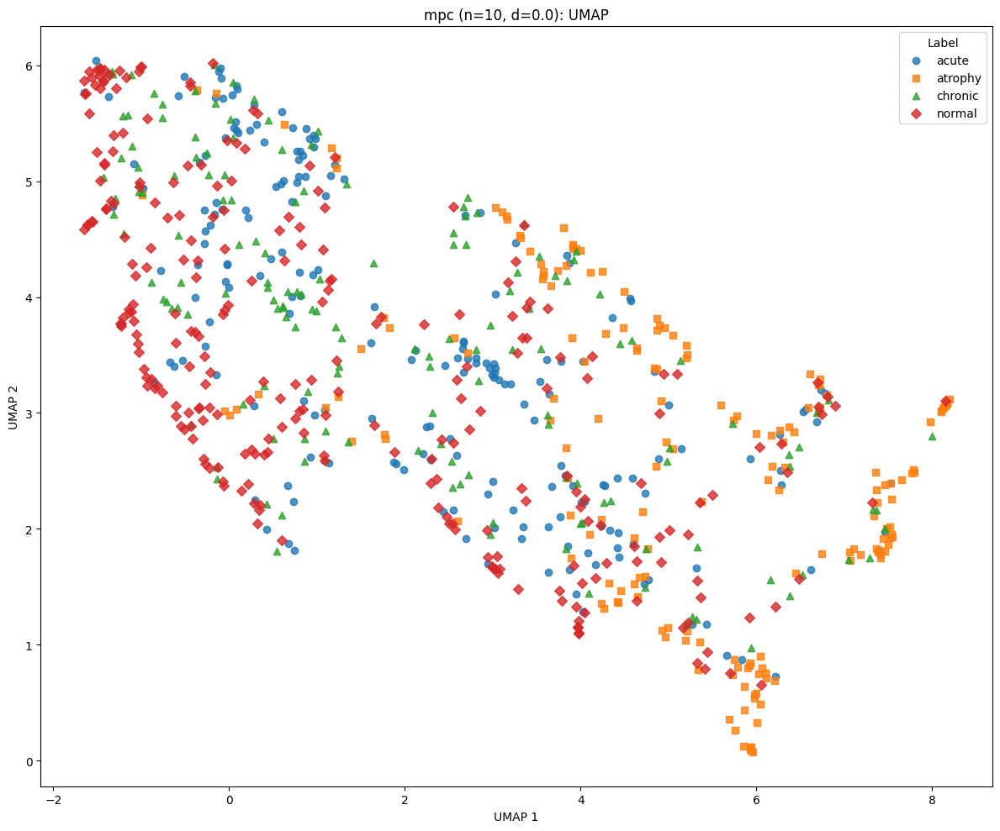

mpc: UMAP with n_neighbors=10, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


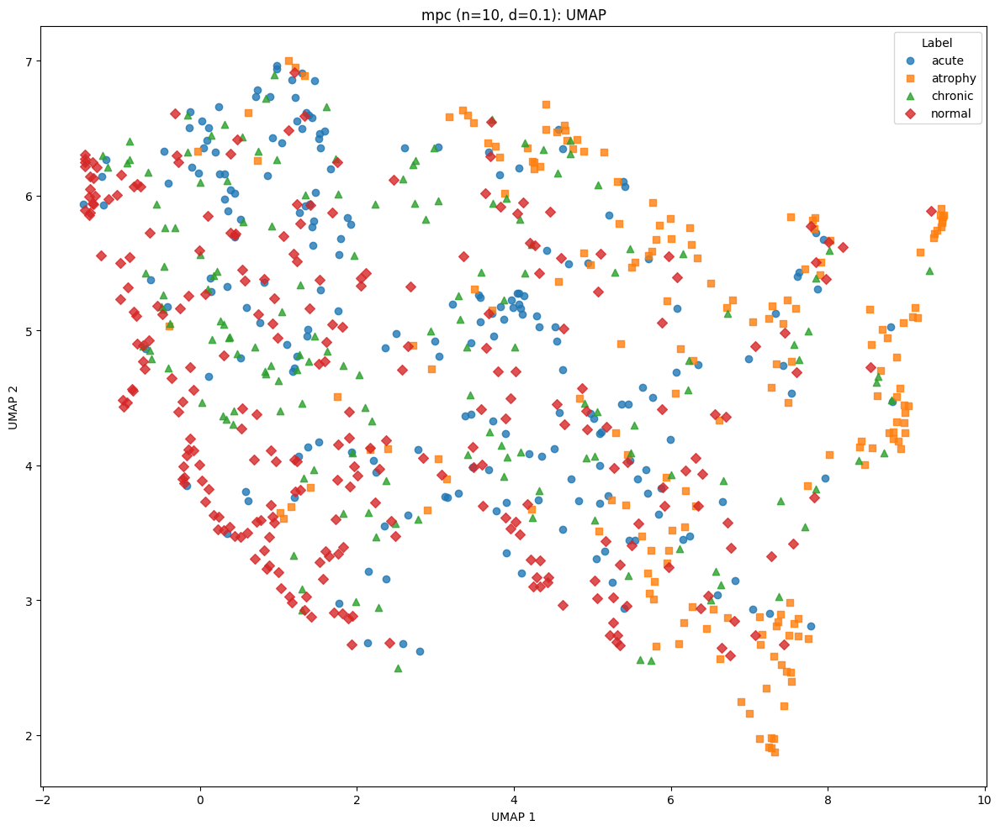

mpc: UMAP with n_neighbors=10, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


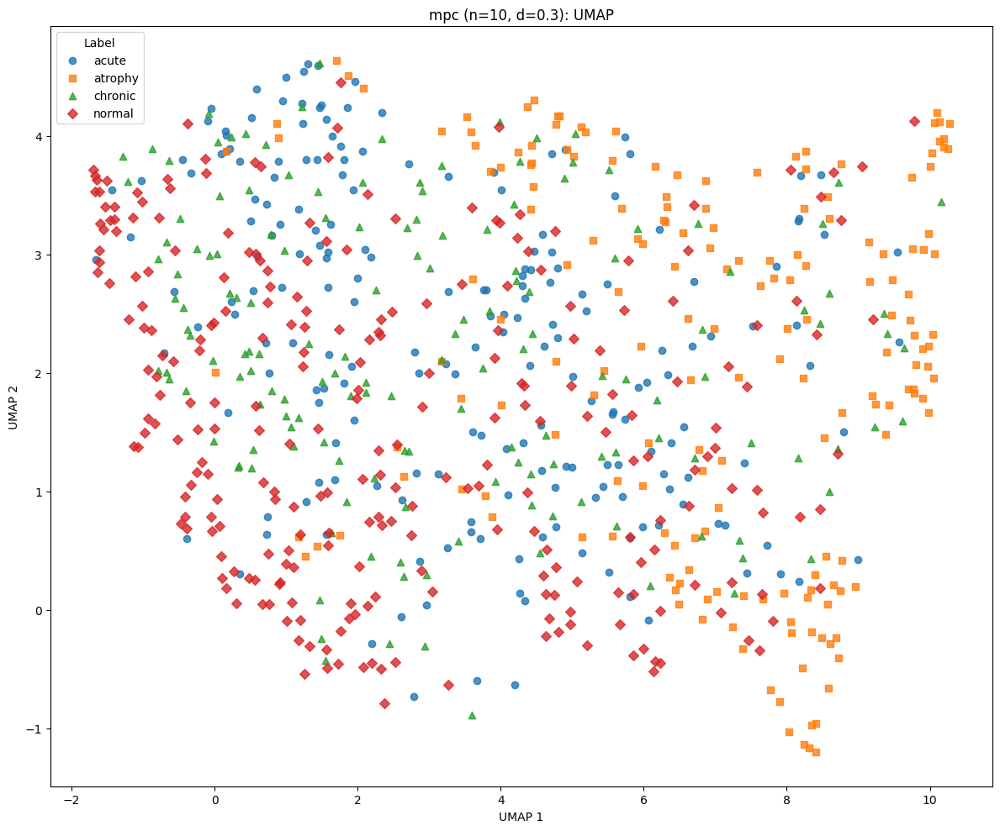

mpc: UMAP with n_neighbors=15, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


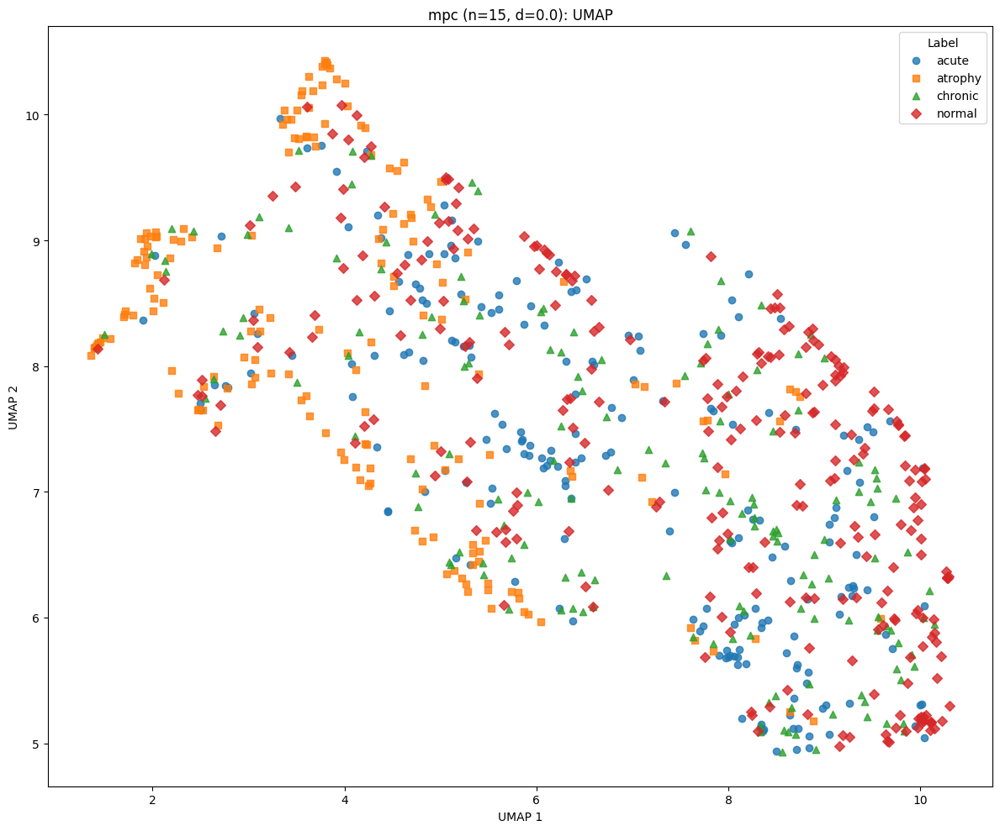

mpc: UMAP with n_neighbors=15, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


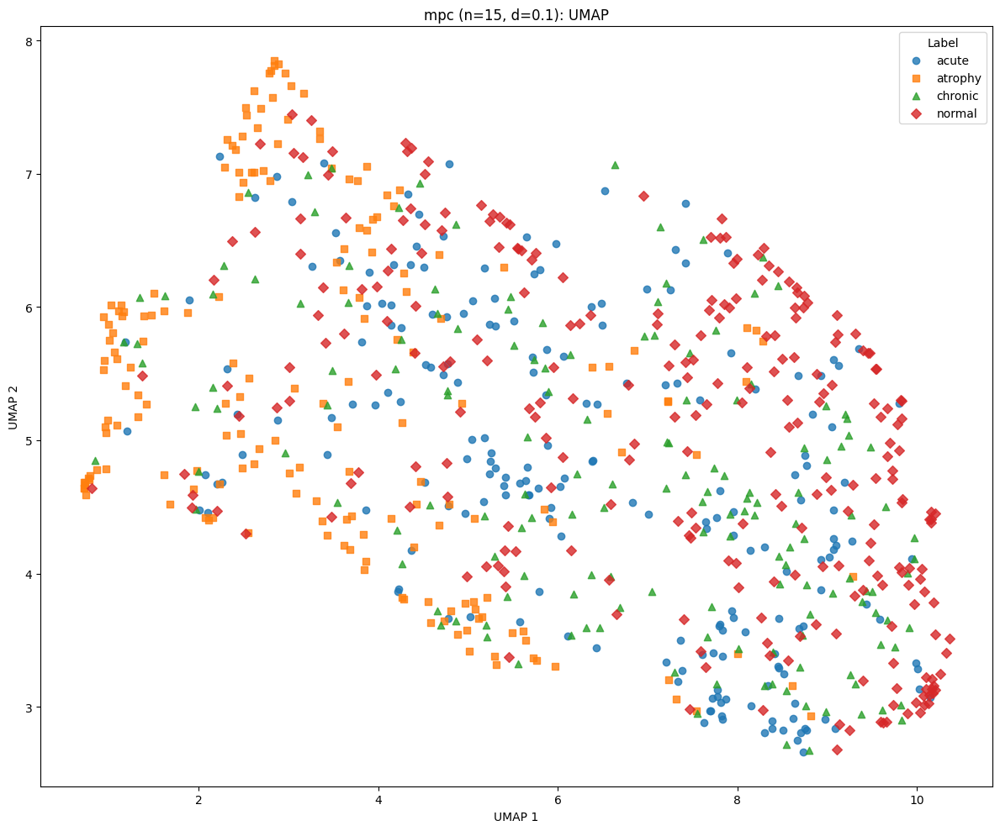

mpc: UMAP with n_neighbors=15, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


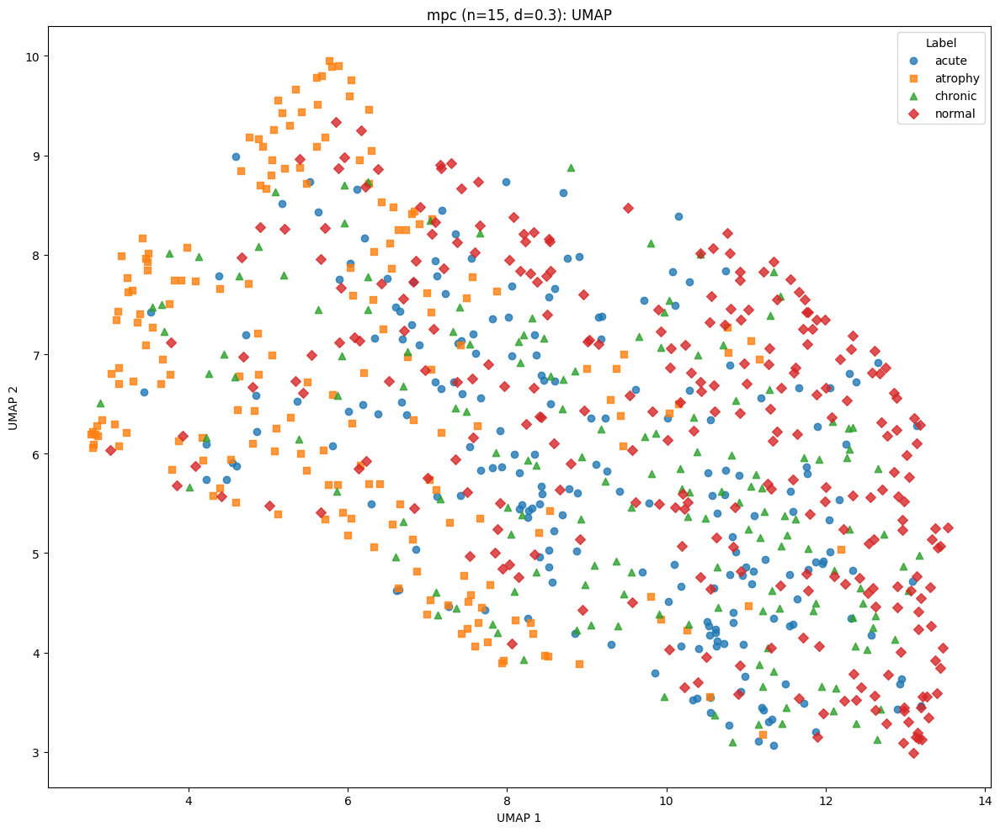

mpc: UMAP with n_neighbors=30, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


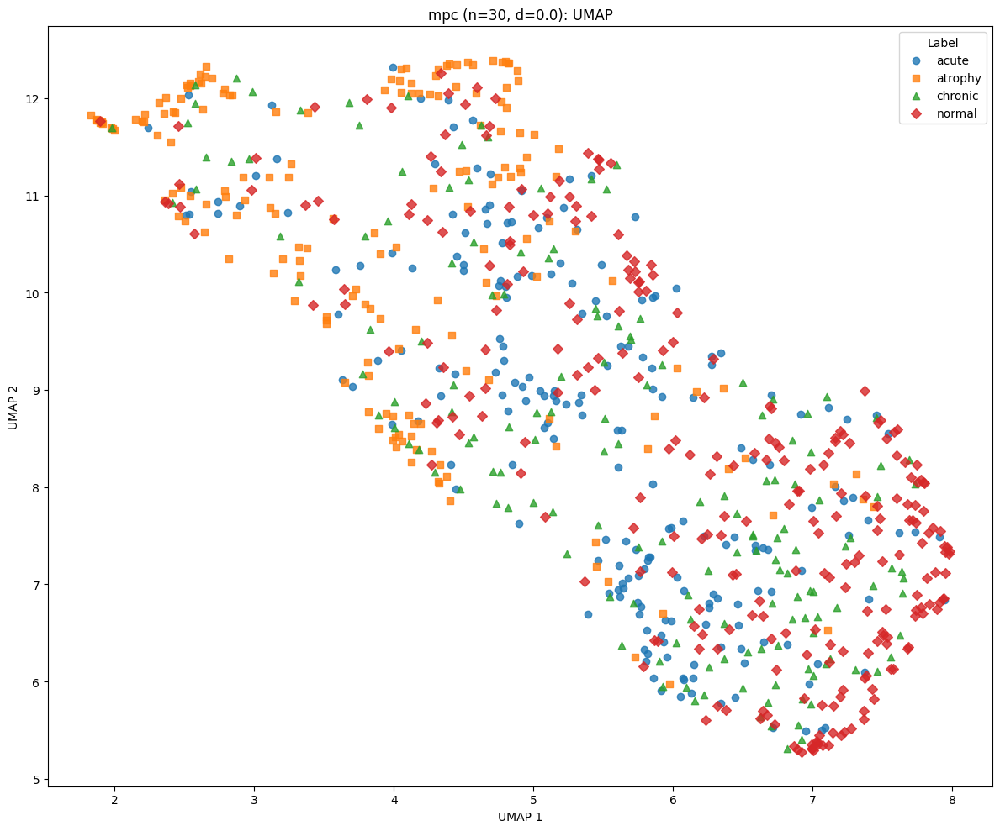

mpc: UMAP with n_neighbors=30, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


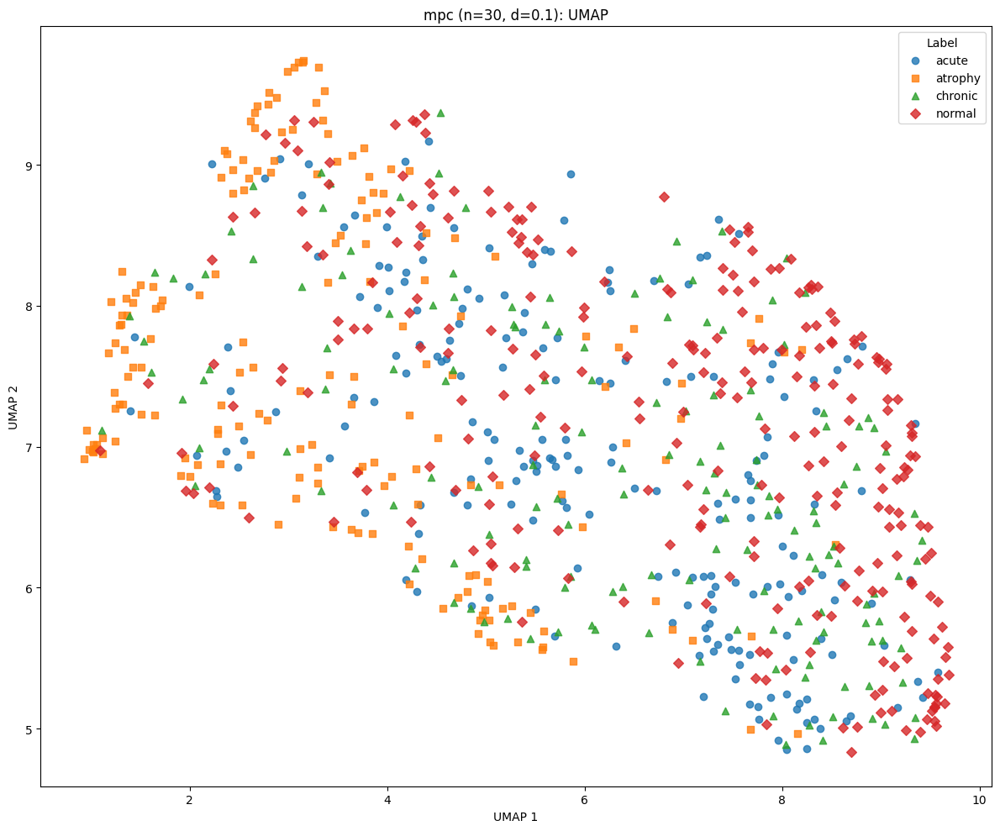

mpc: UMAP with n_neighbors=30, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


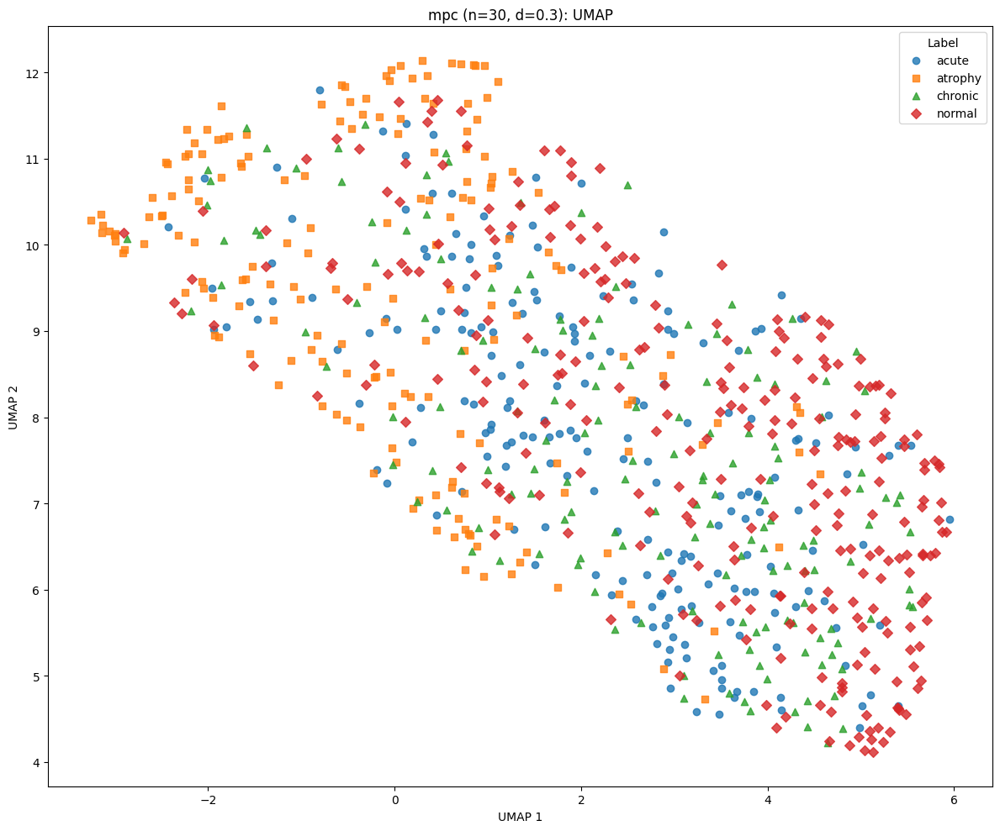

mpc: UMAP with n_neighbors=50, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


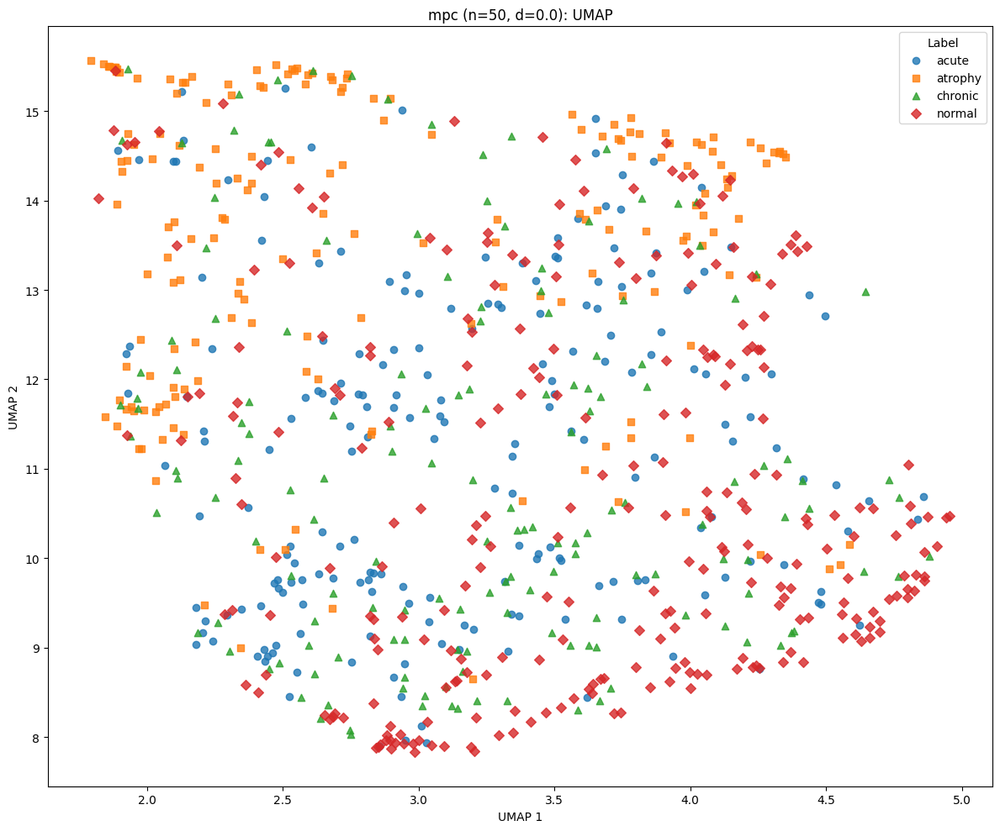

mpc: UMAP with n_neighbors=50, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


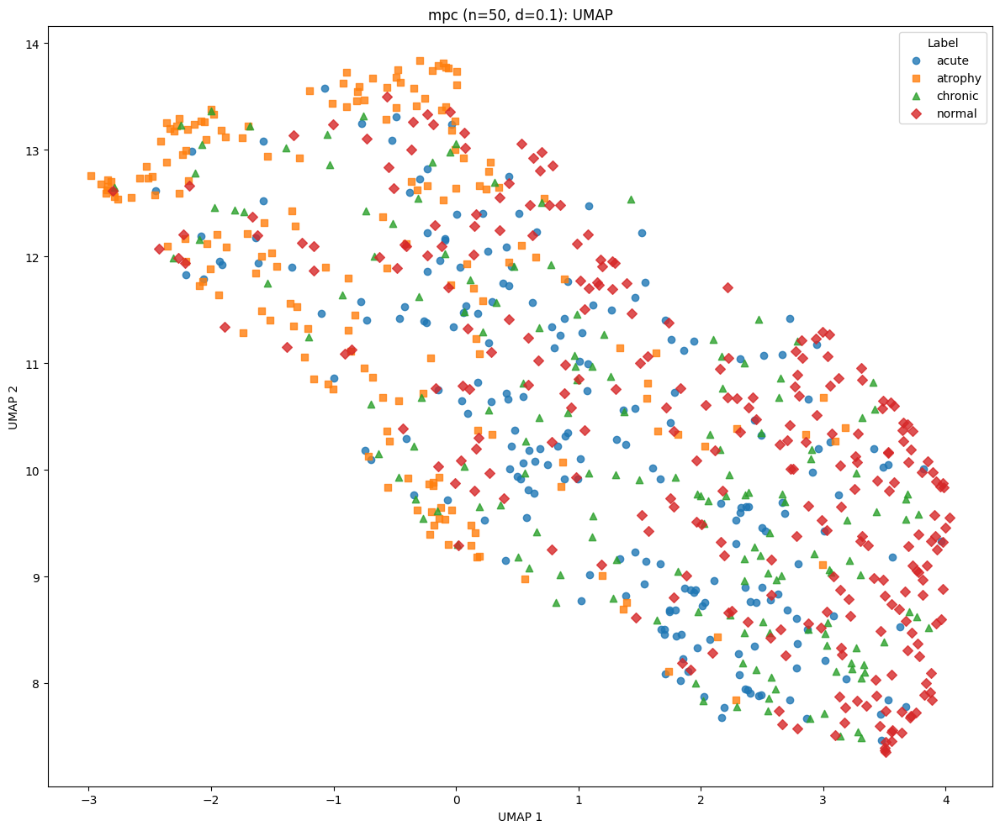

mpc: UMAP with n_neighbors=50, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


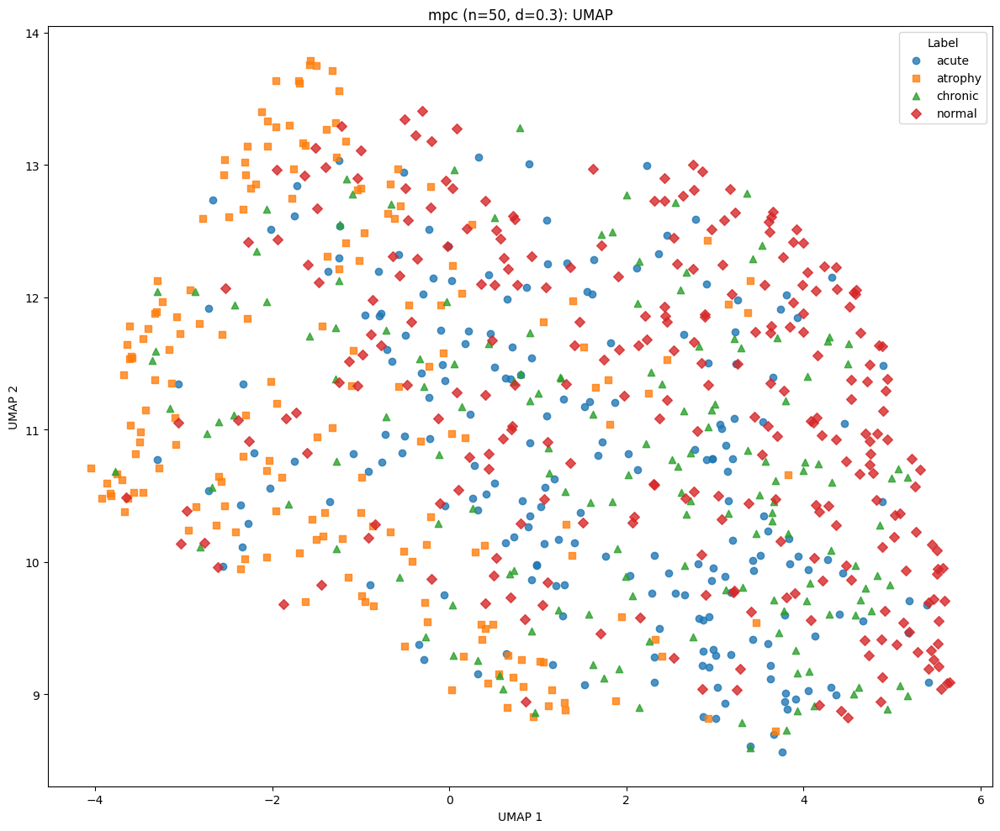

In [491]:
sweep_umap(X_mpc, y, dataset_name="mpc")

#### UMAP: mp

C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


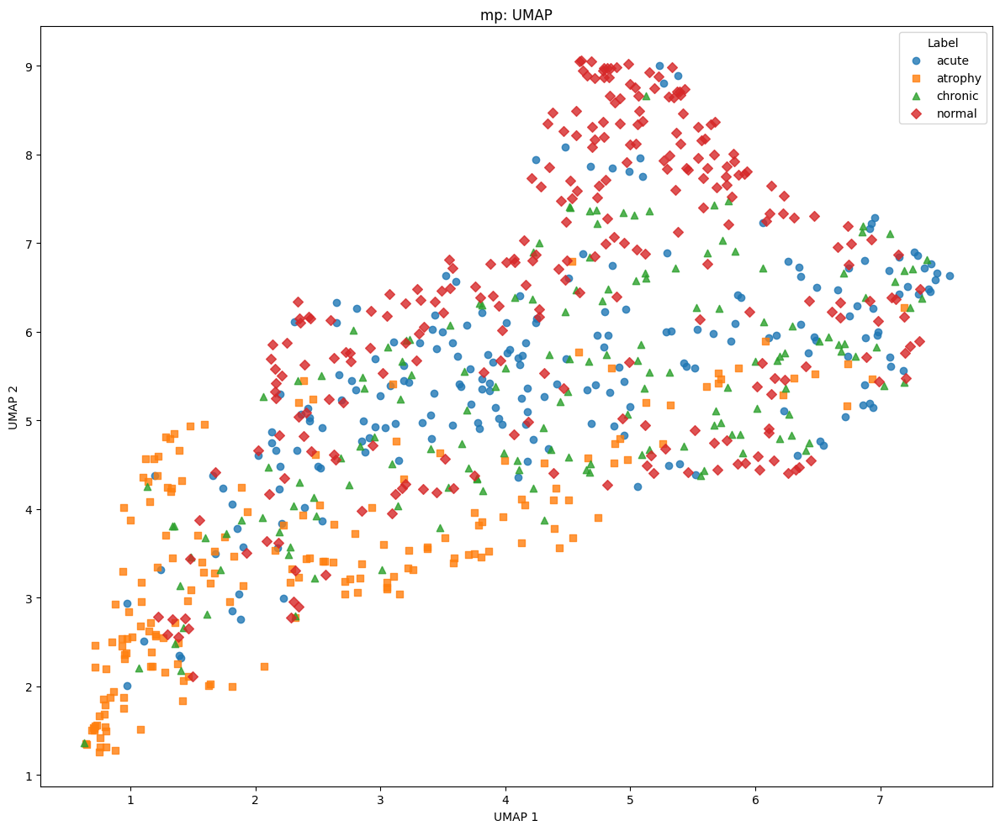

In [492]:
X_umap_mp = get_umap_2d(X_mp, n_neighbors=15, min_dist=0.1, random_state=0)
plot_umap(X_umap_mp, y, dataset_name="mp")

mp: UMAP with n_neighbors=5, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


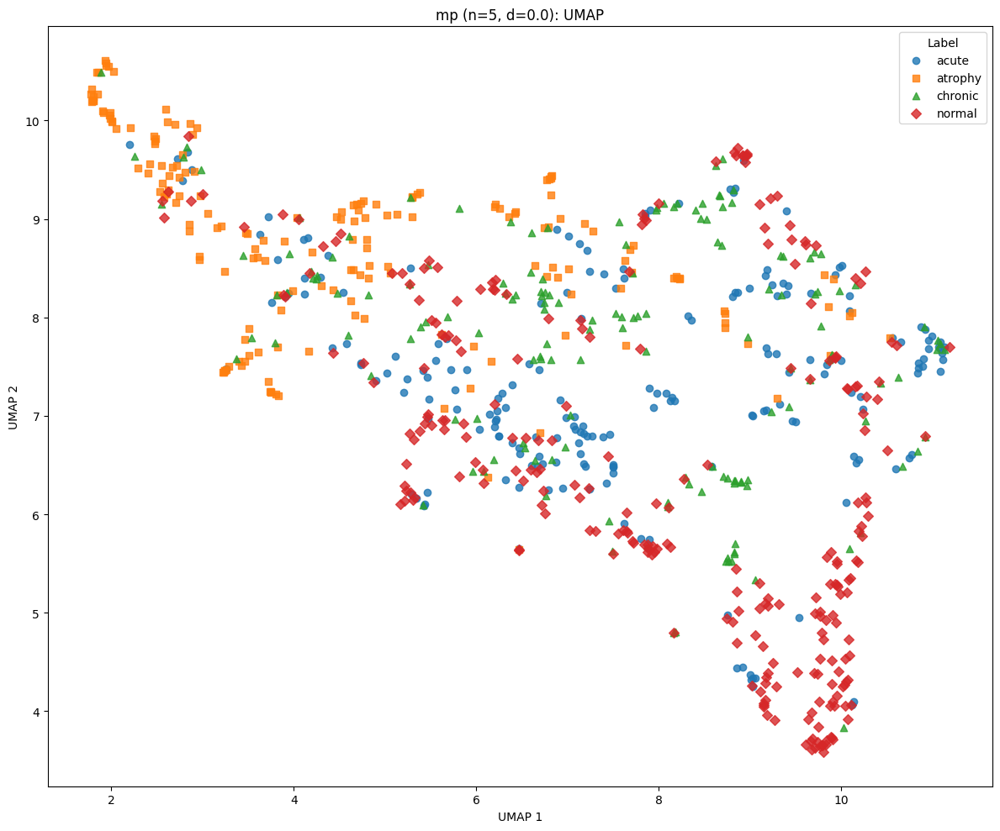

mp: UMAP with n_neighbors=5, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


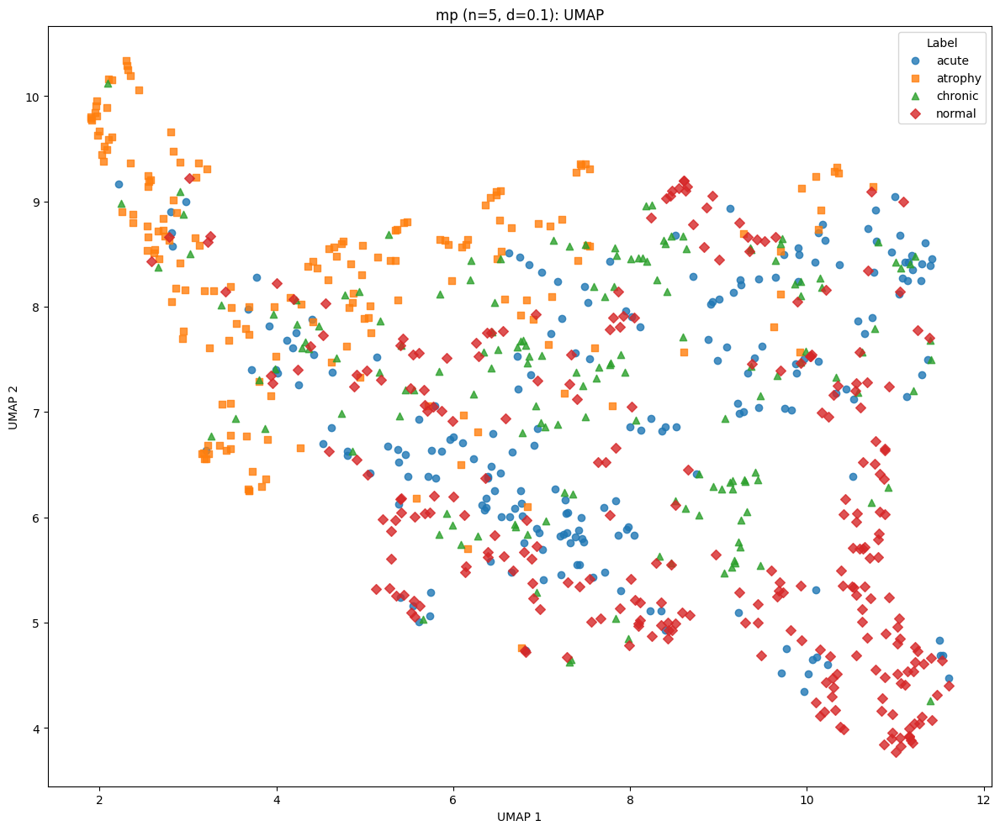

mp: UMAP with n_neighbors=5, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


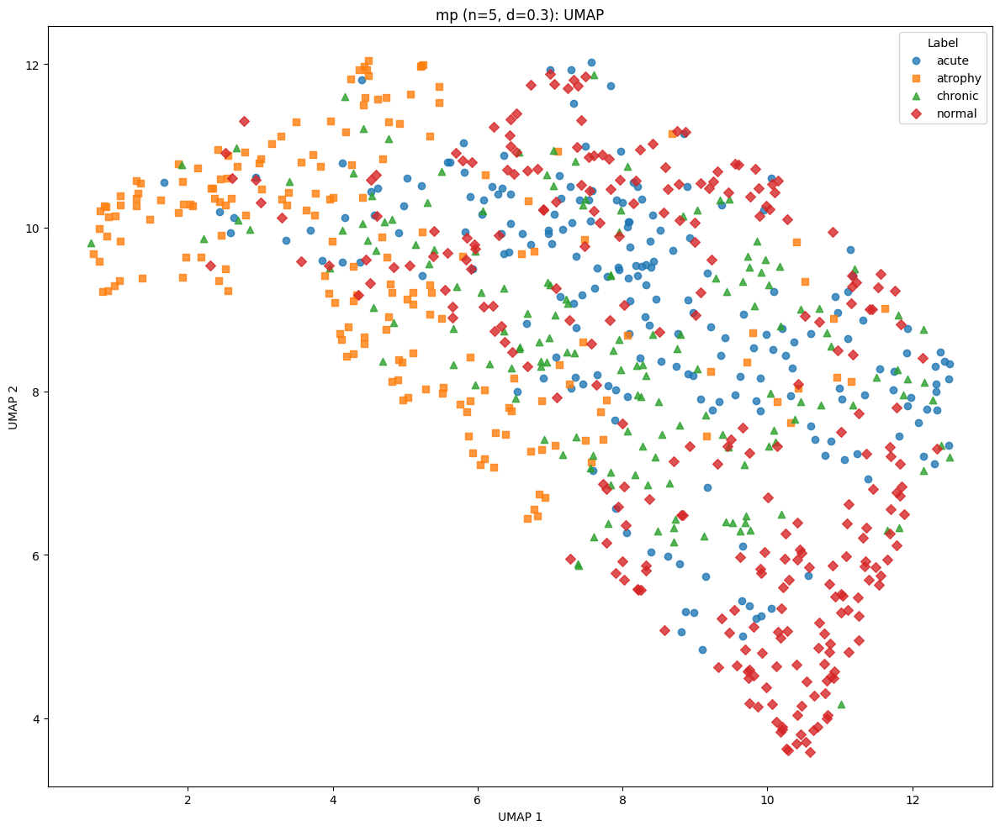

mp: UMAP with n_neighbors=10, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


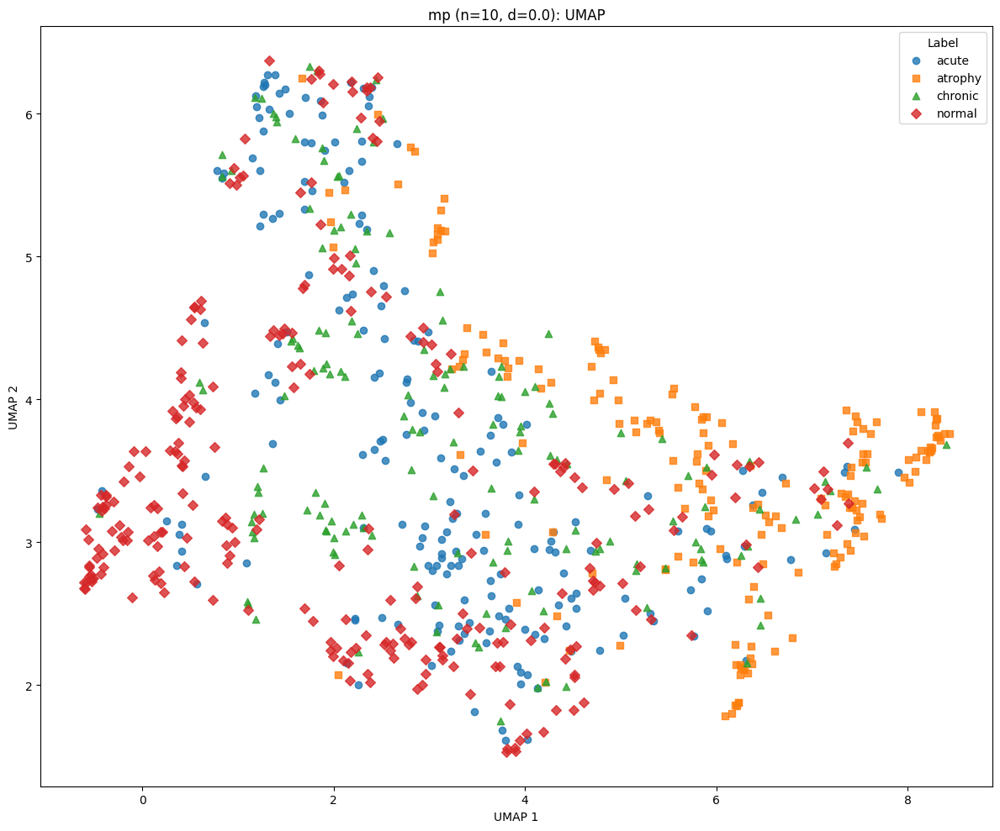

mp: UMAP with n_neighbors=10, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


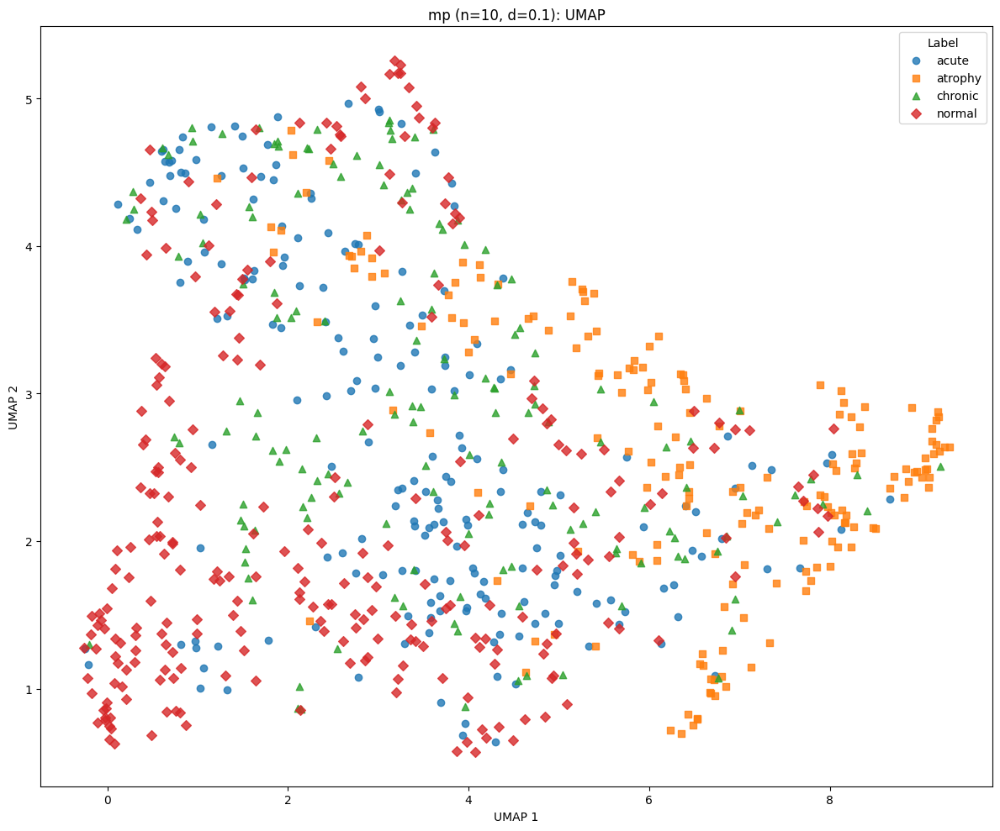

mp: UMAP with n_neighbors=10, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


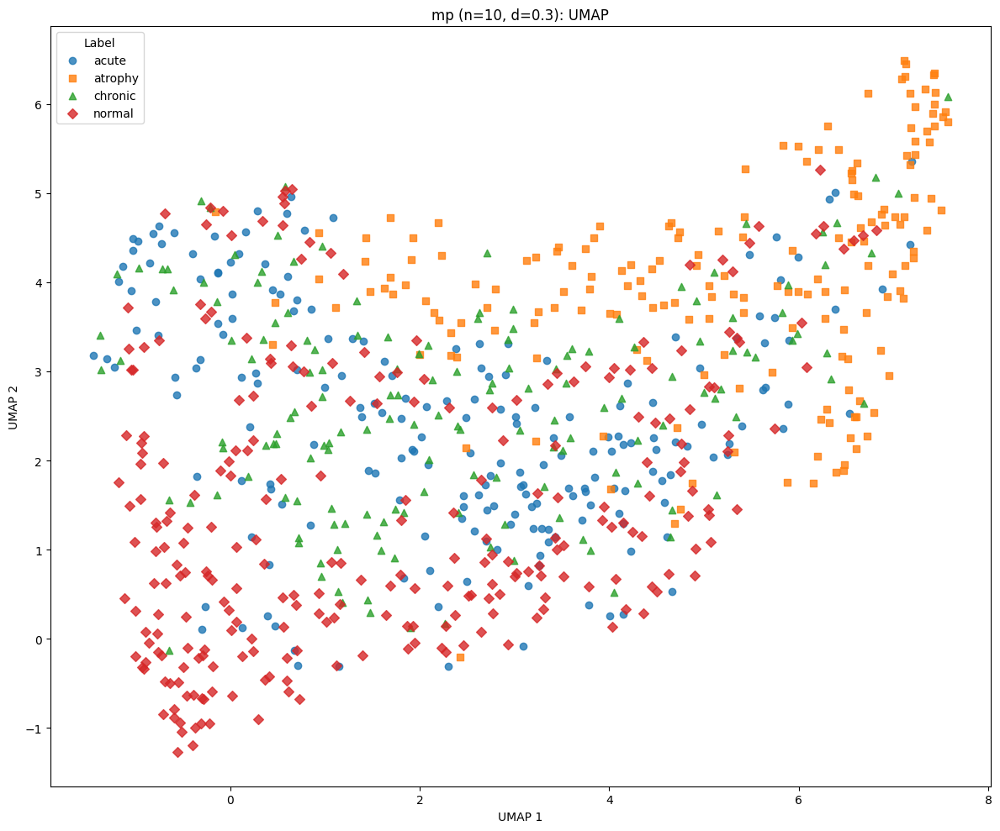

mp: UMAP with n_neighbors=15, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\olset\miniconda3\envs\Praksis\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


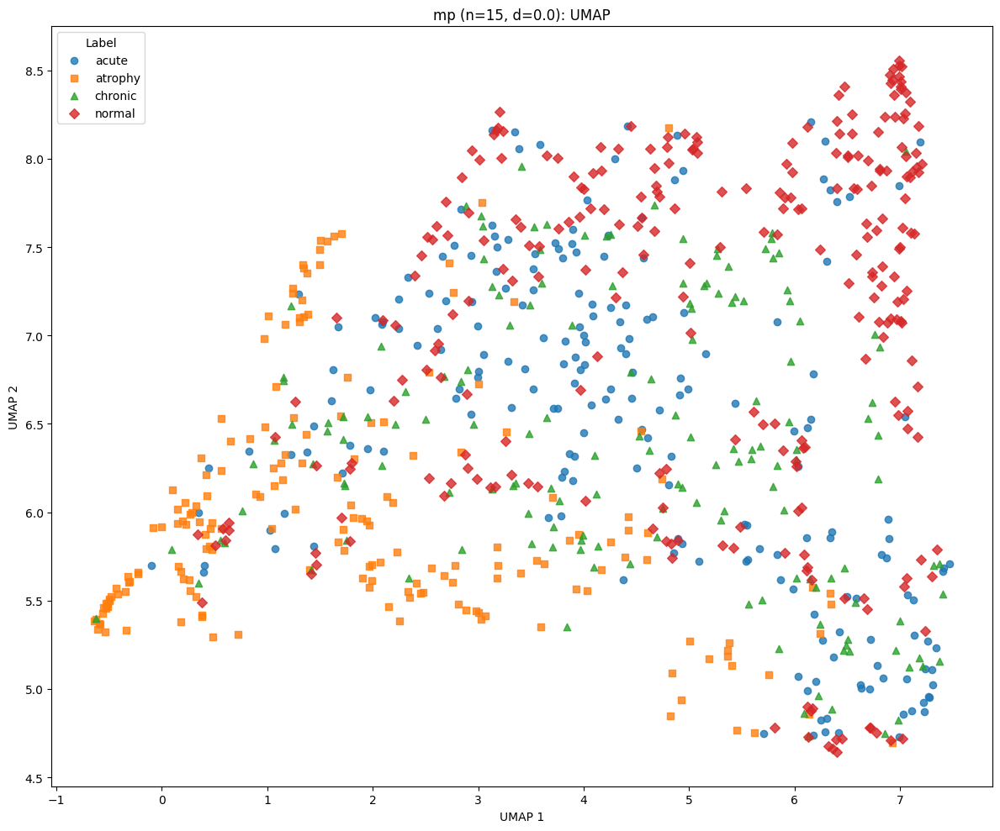

mp: UMAP with n_neighbors=15, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


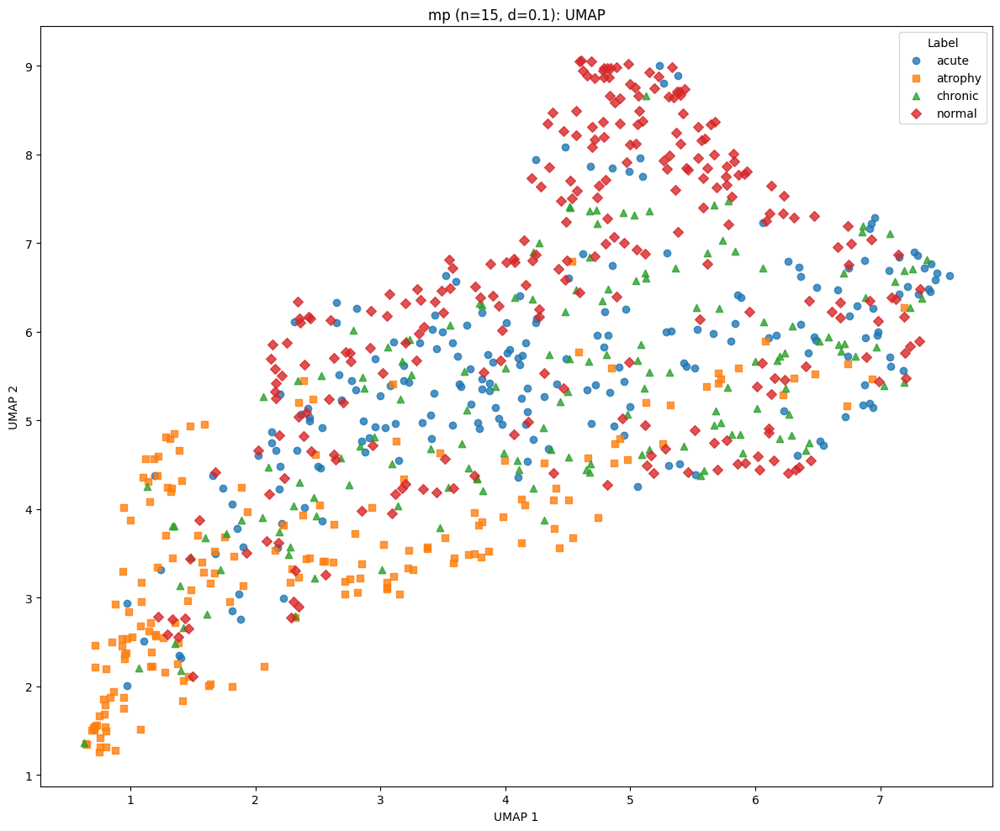

mp: UMAP with n_neighbors=15, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


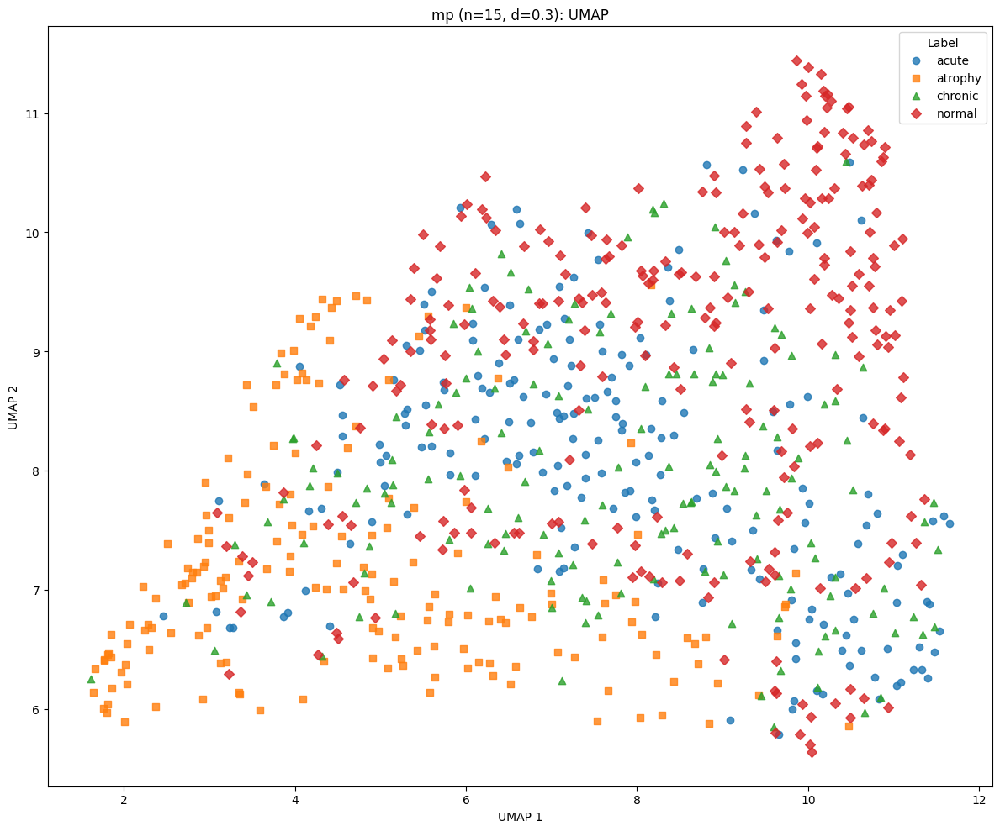

mp: UMAP with n_neighbors=30, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


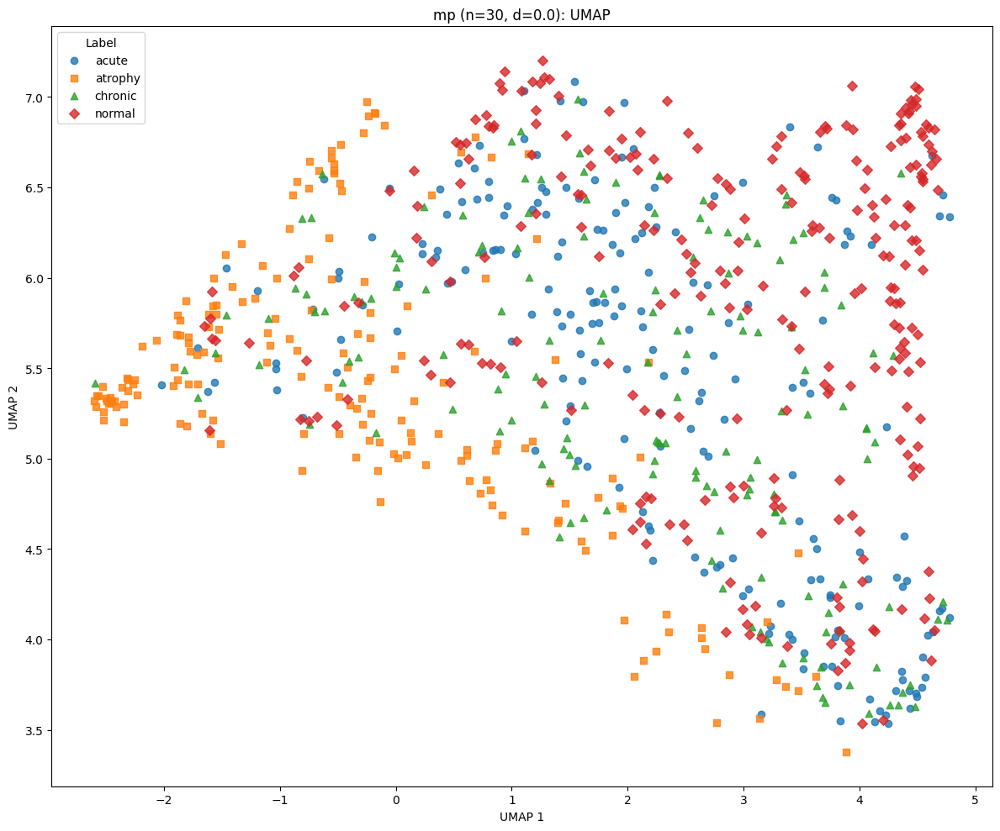

mp: UMAP with n_neighbors=30, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


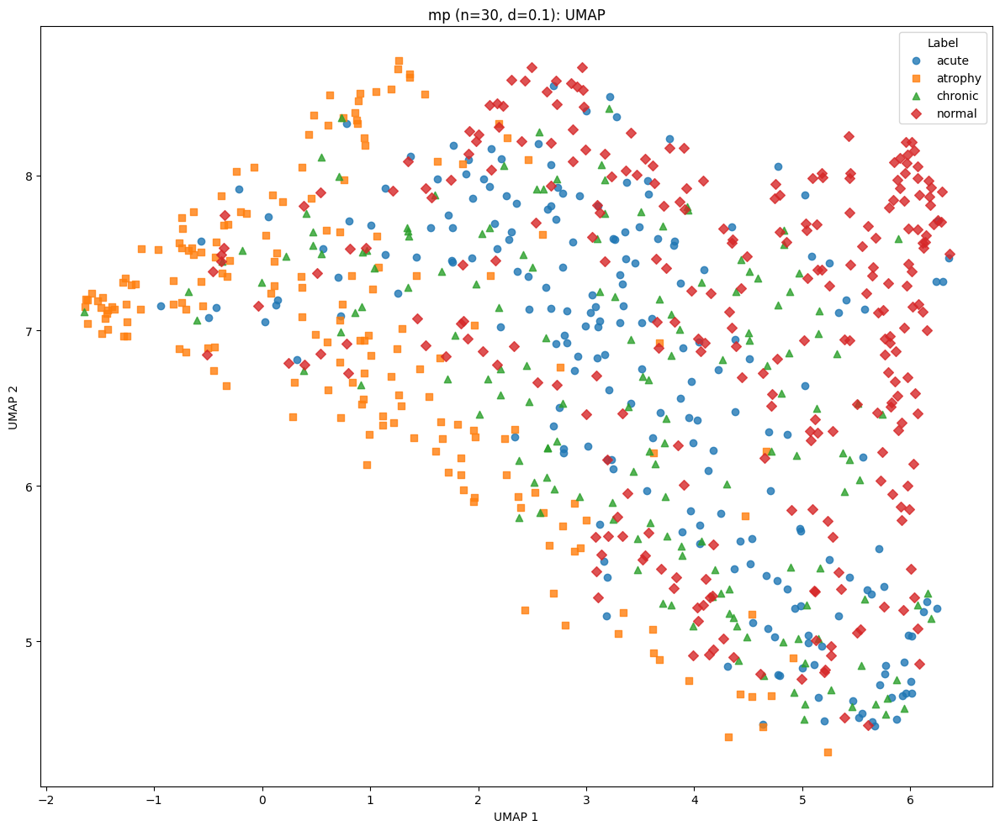

mp: UMAP with n_neighbors=30, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


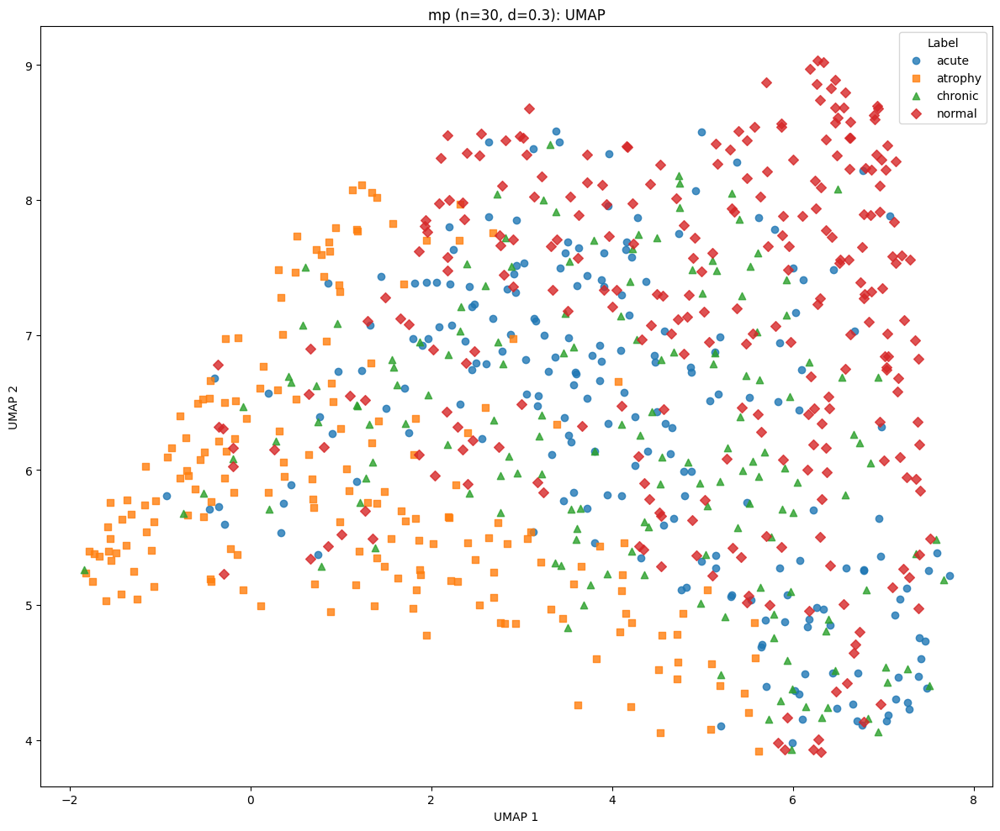

mp: UMAP with n_neighbors=50, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


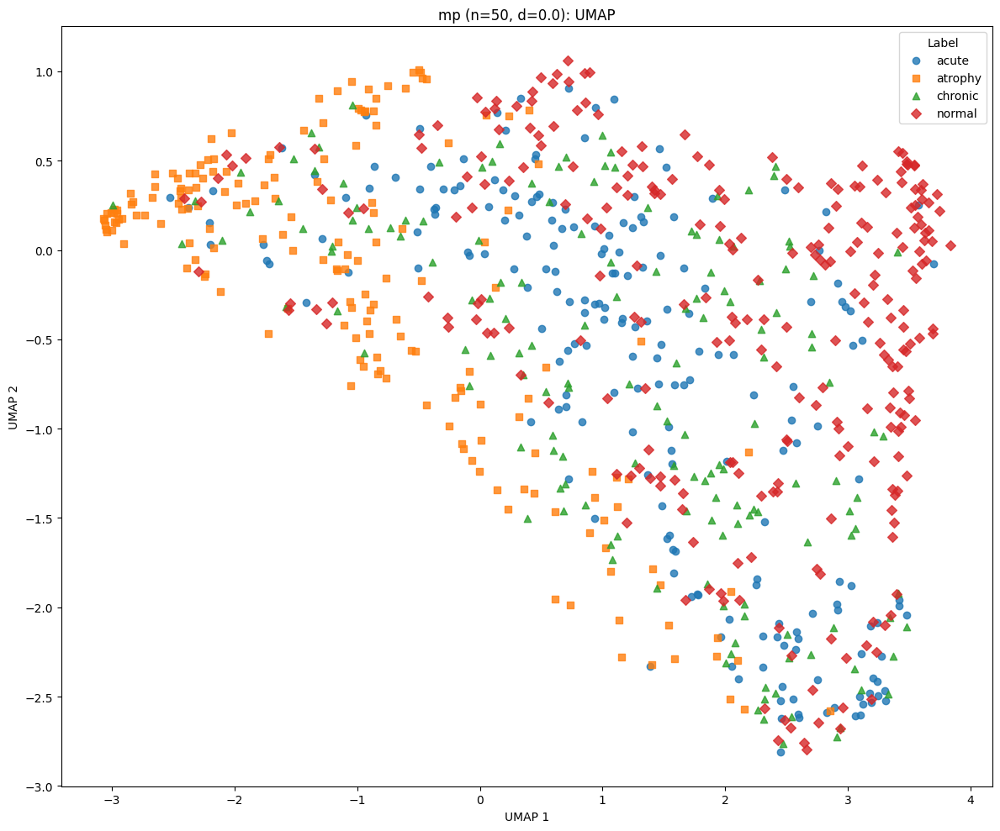

mp: UMAP with n_neighbors=50, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


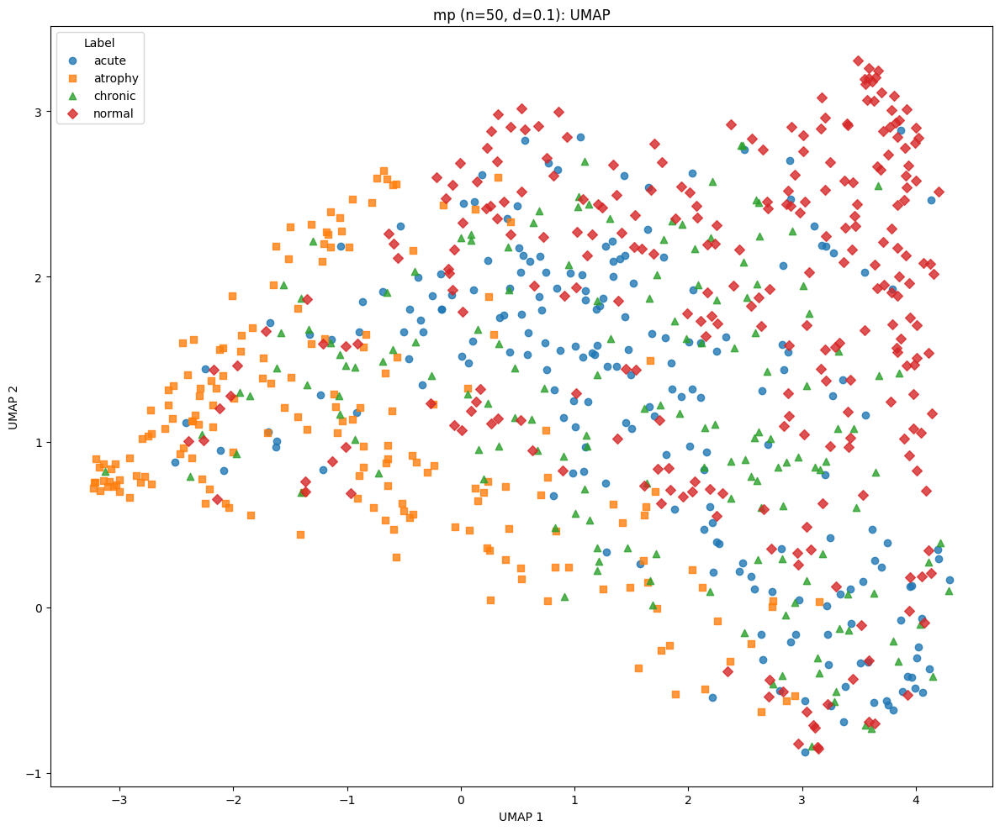

mp: UMAP with n_neighbors=50, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


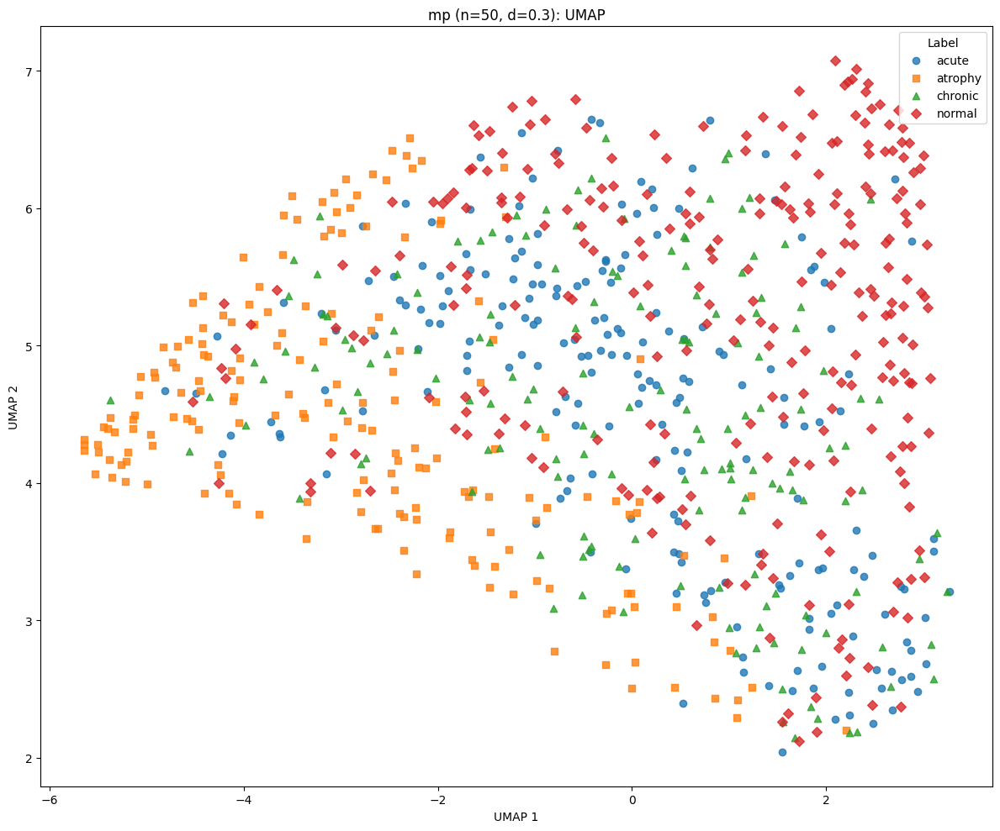

In [493]:
sweep_umap(X_mp, y, dataset_name="mp", n_neighbors_list=None, min_dist_list=None, random_state=0)

#### UMAP: t

C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


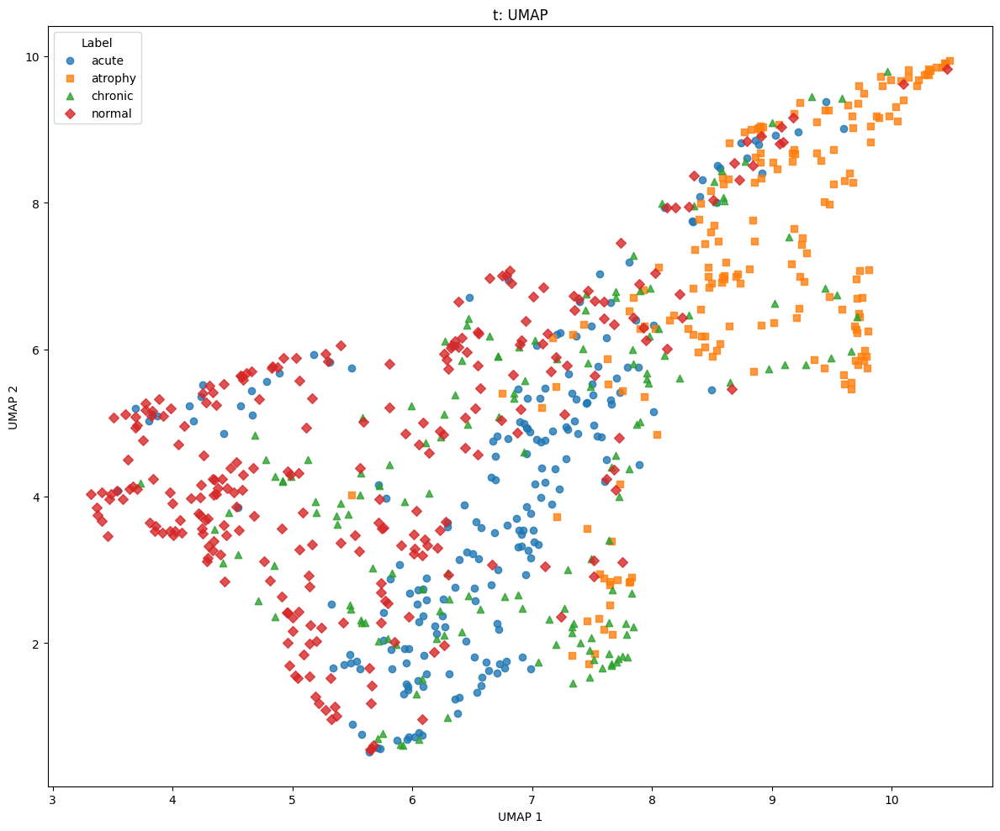

In [494]:
X_umap_t = get_umap_2d(X_t, n_neighbors=15, min_dist=0.1, random_state=0)
plot_umap(X_umap_t, y, dataset_name="t")

t: UMAP with n_neighbors=5, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


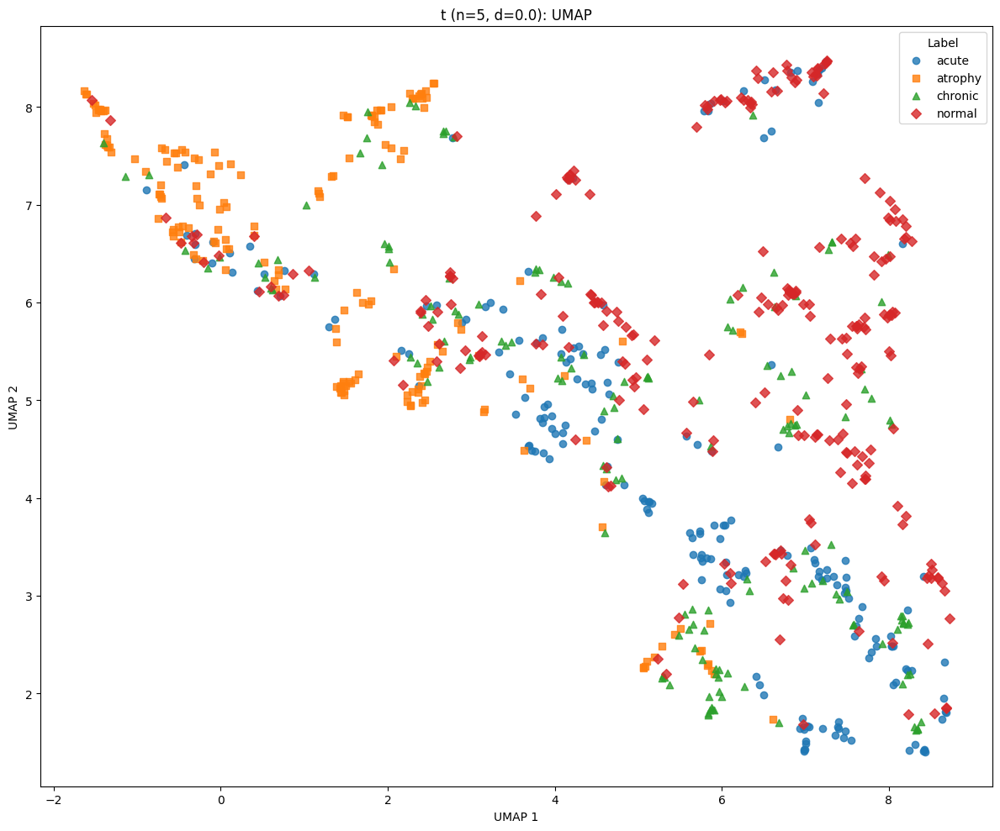

t: UMAP with n_neighbors=5, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


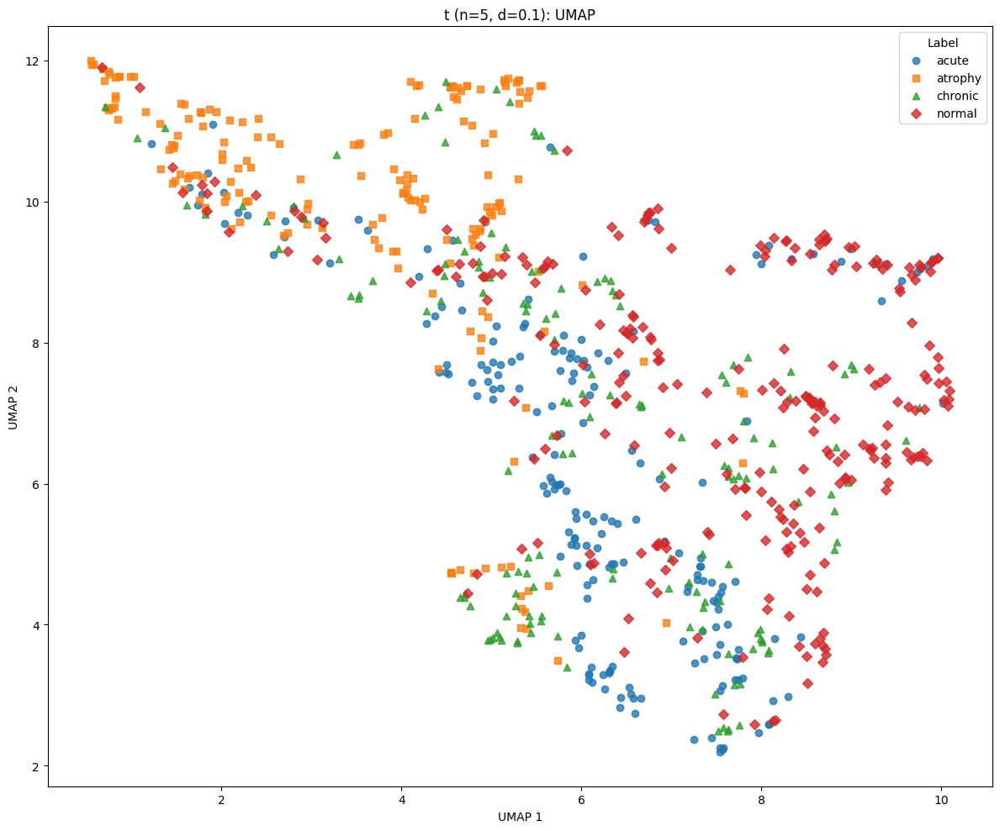

t: UMAP with n_neighbors=5, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


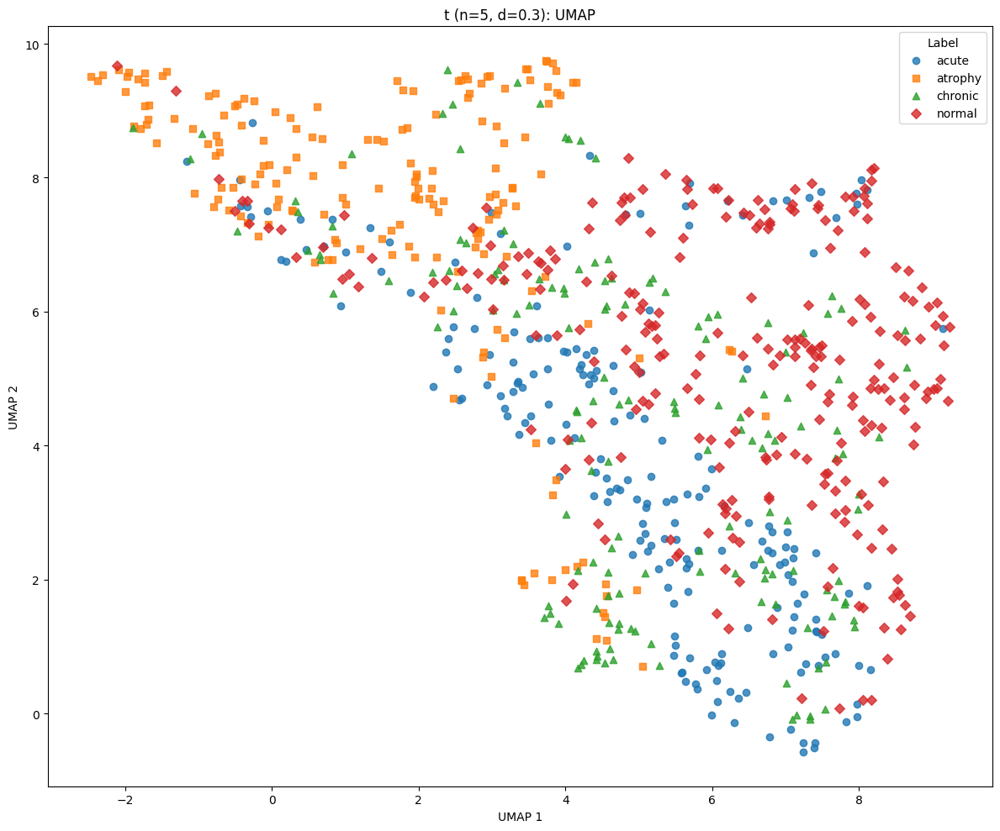

t: UMAP with n_neighbors=10, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


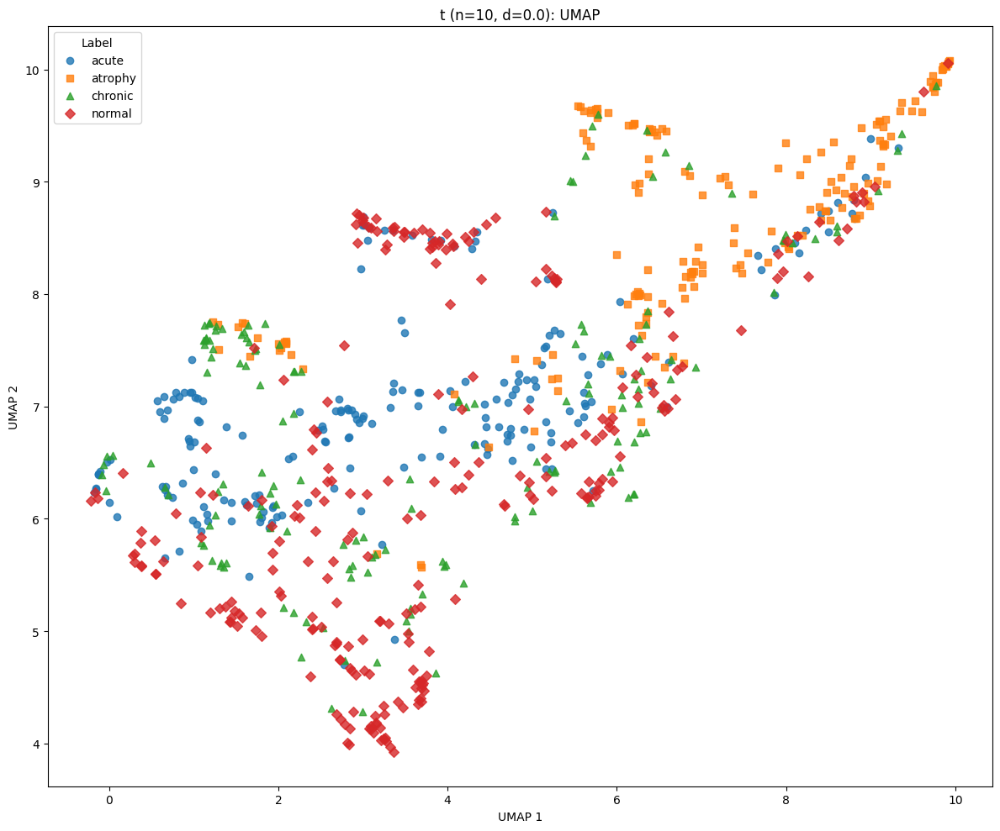

t: UMAP with n_neighbors=10, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


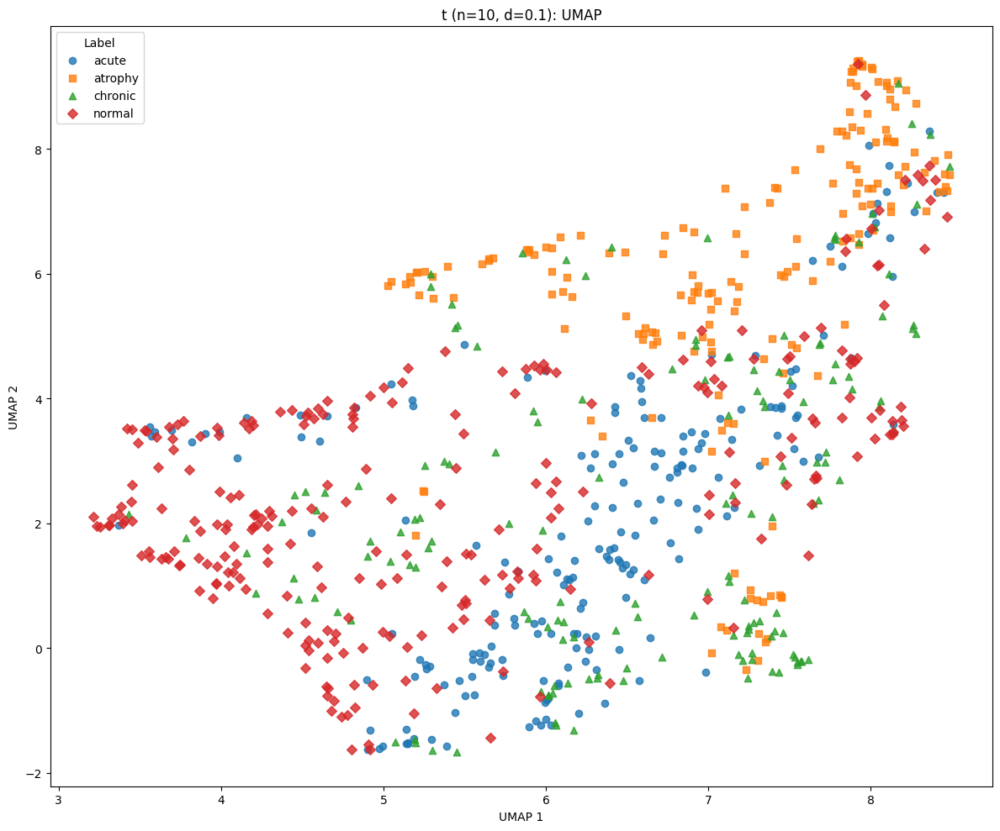

t: UMAP with n_neighbors=10, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


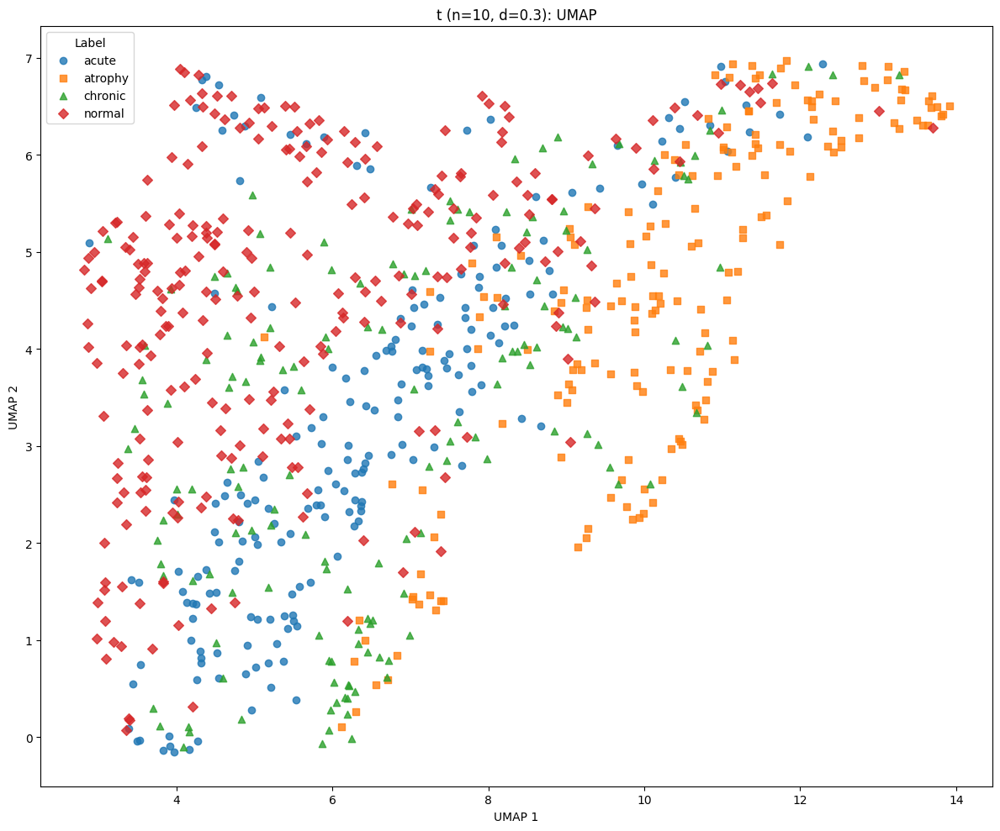

t: UMAP with n_neighbors=15, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


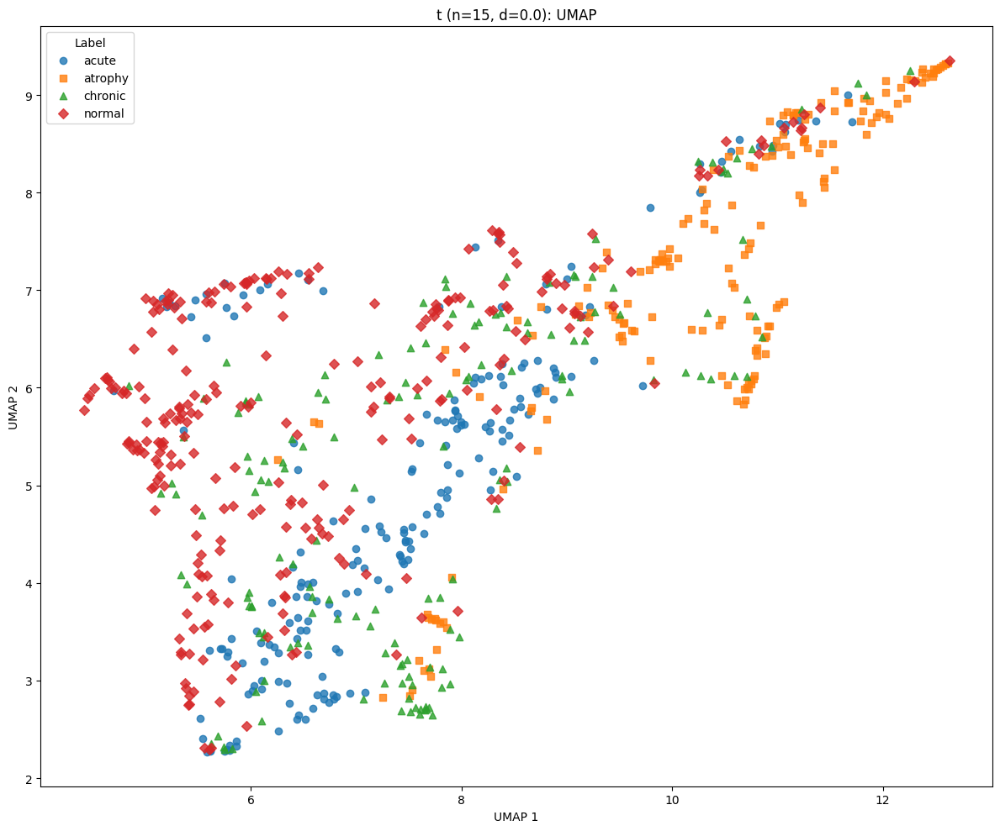

t: UMAP with n_neighbors=15, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


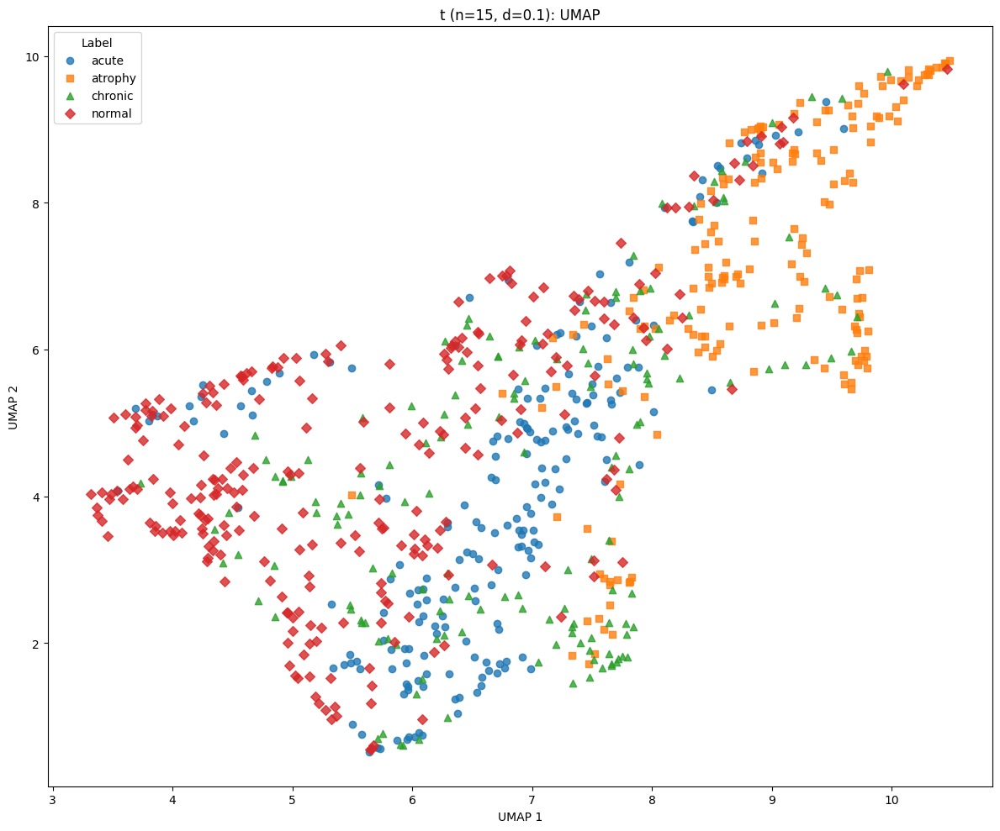

t: UMAP with n_neighbors=15, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


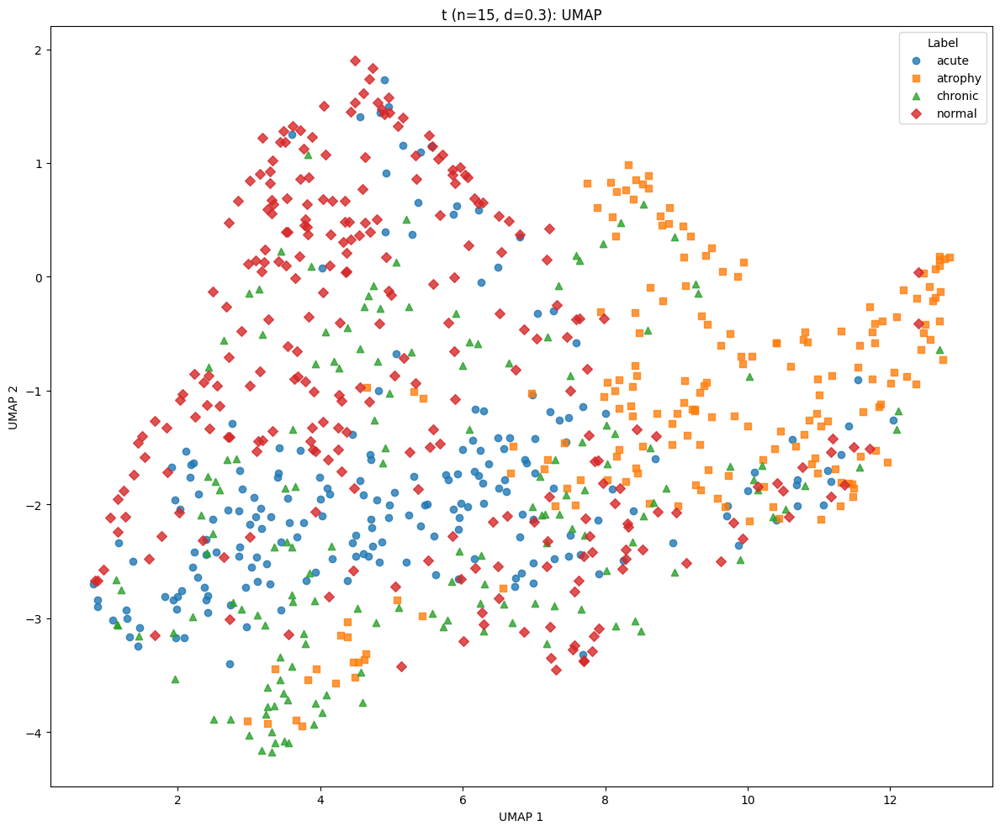

t: UMAP with n_neighbors=30, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


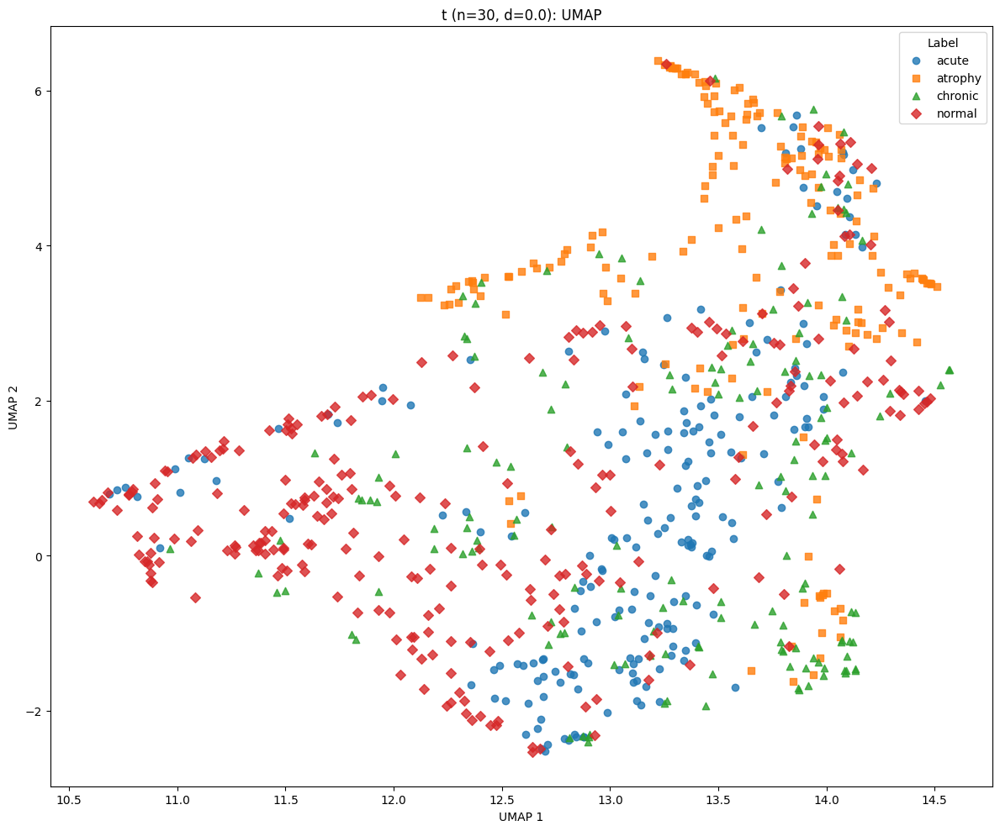

t: UMAP with n_neighbors=30, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


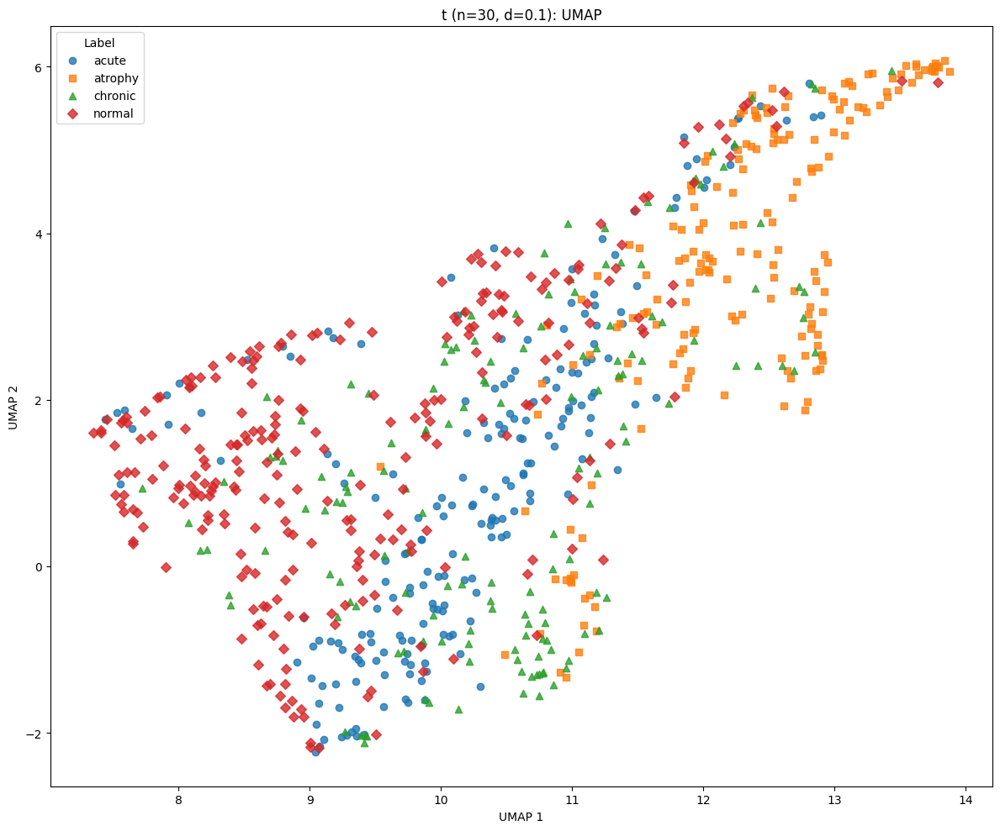

t: UMAP with n_neighbors=30, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


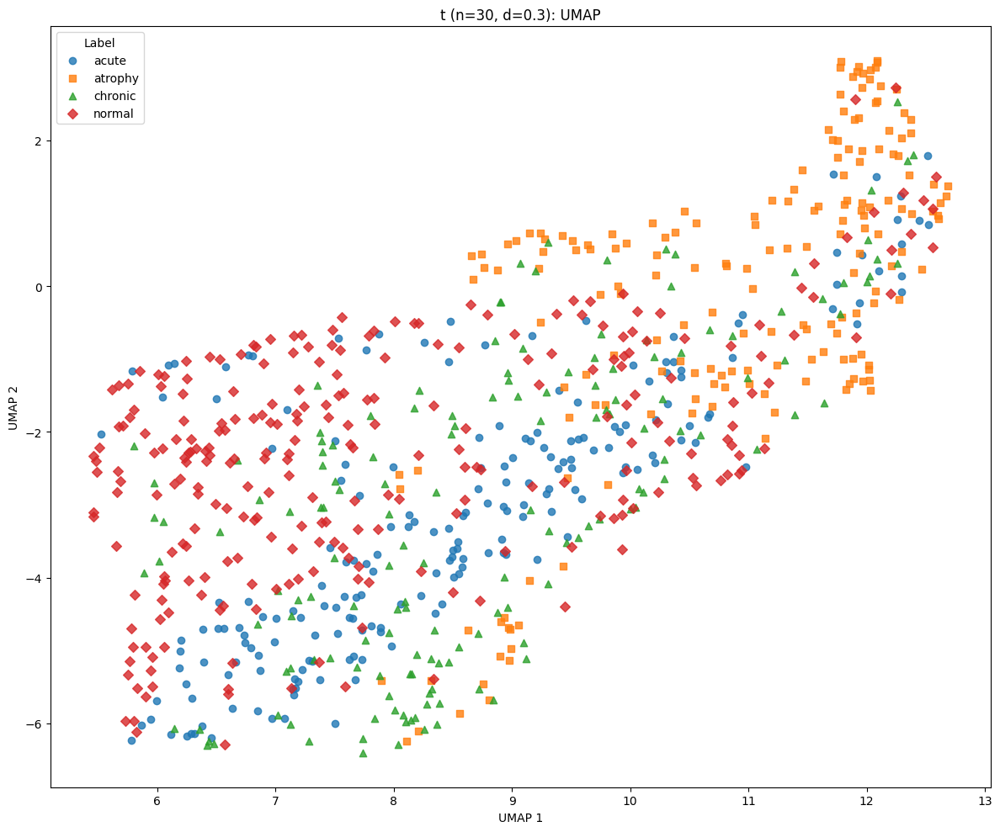

t: UMAP with n_neighbors=50, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


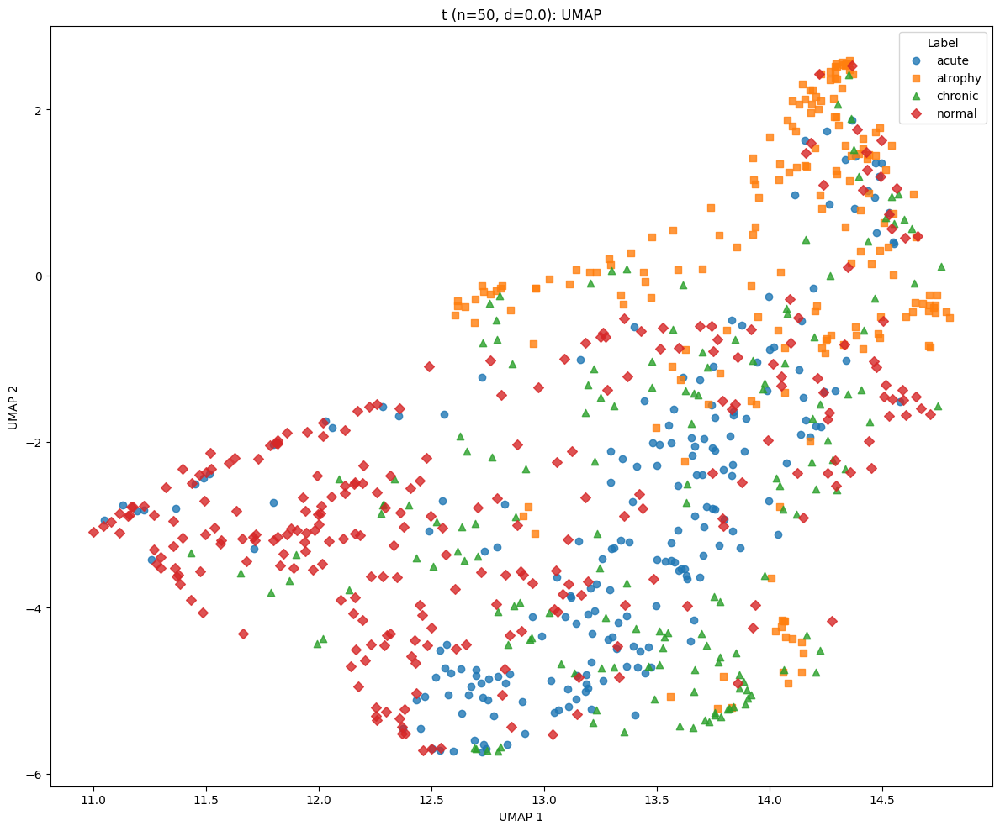

t: UMAP with n_neighbors=50, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


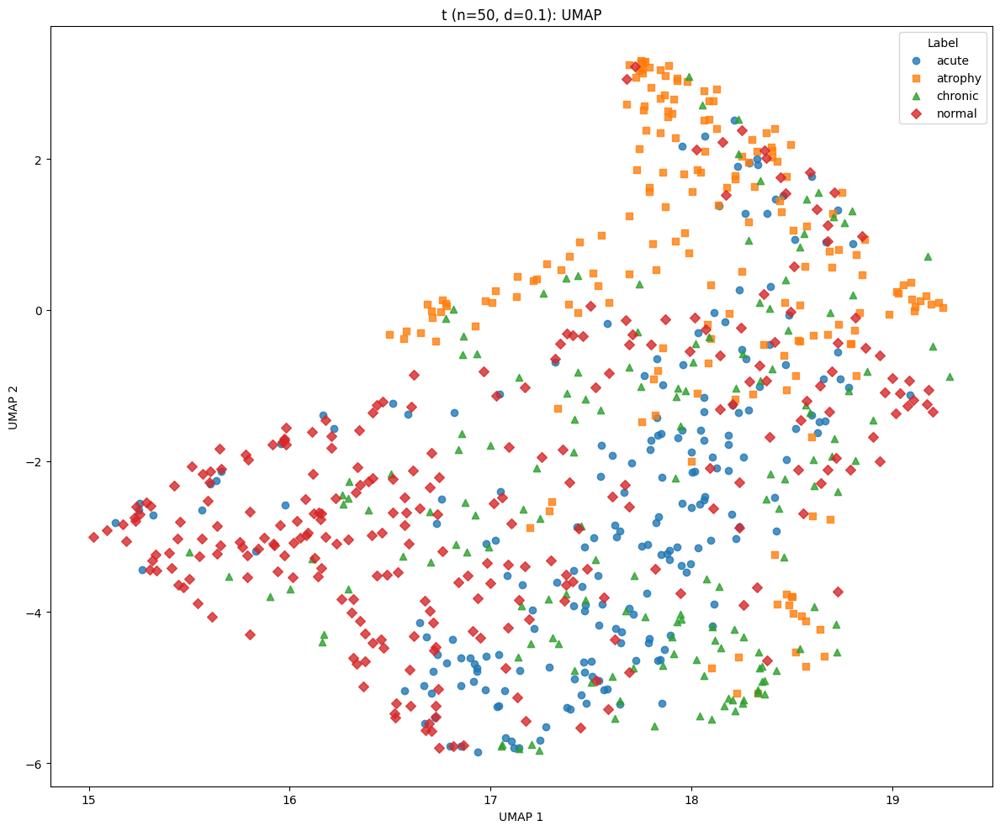

t: UMAP with n_neighbors=50, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


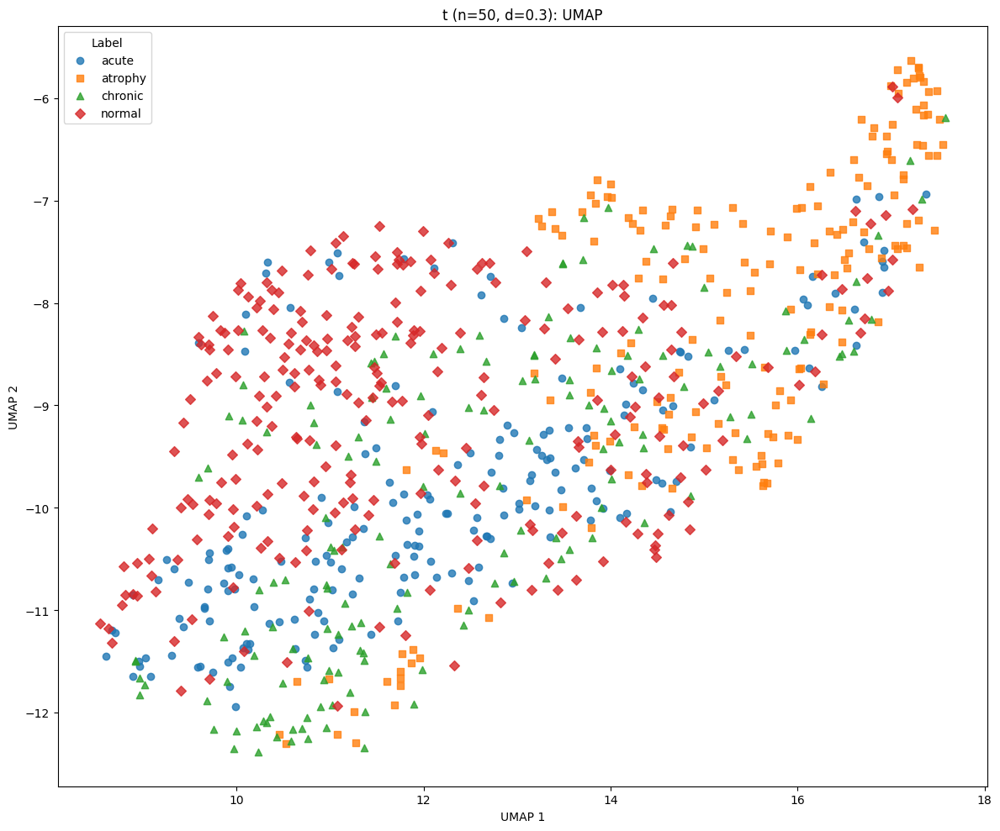

In [495]:
sweep_umap(X_t, y, dataset_name="t", n_neighbors_list=None, min_dist_list=None, random_state=0)

### LDA

#### LDA: mpc

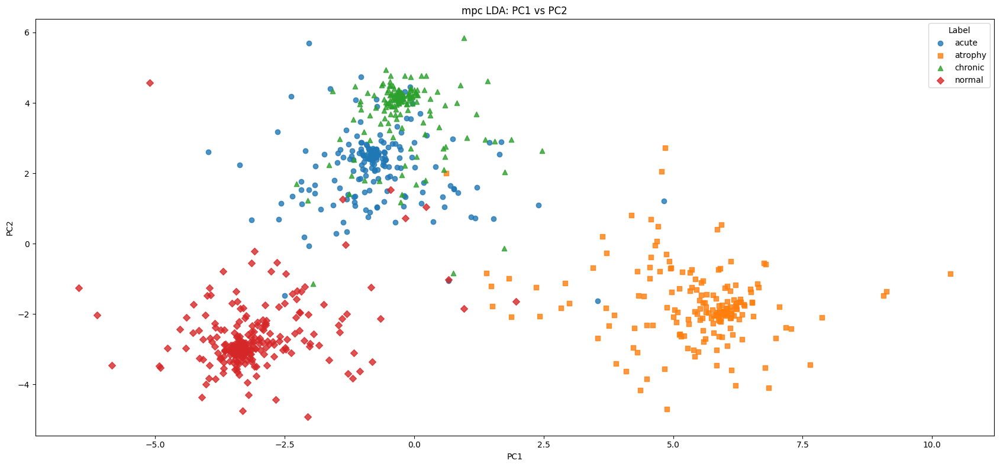

In [496]:
lda = LDA(n_components=2)
X_lda_mpc = lda.fit_transform(X_mpc, y)
plot_pc(X_lda_mpc, y, pc_x=1, pc_y=2, dataset_name="mpc LDA")

#### LDA: mp

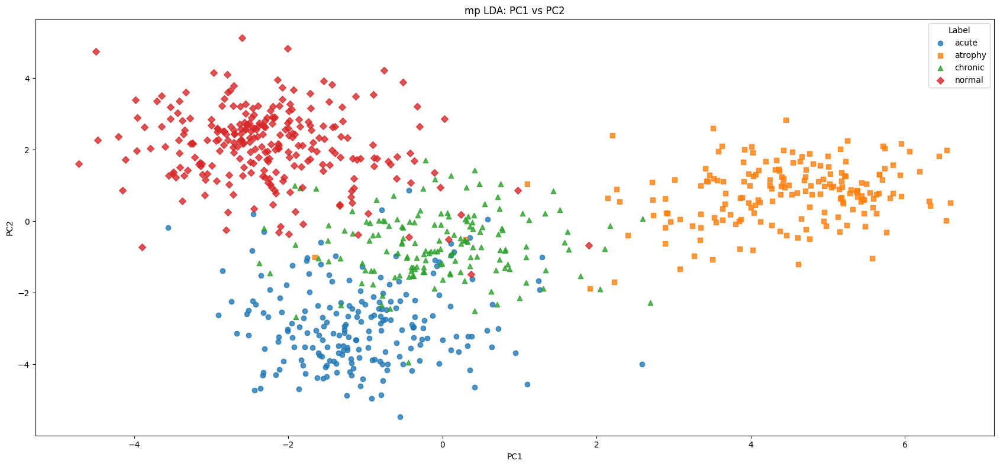

In [497]:
lda = LDA(n_components=2)
X_lda_mp = lda.fit_transform(X_mp, y)
plot_pc(X_lda_mp, y, pc_x=1, pc_y=2, dataset_name="mp LDA")

#### LDA: t

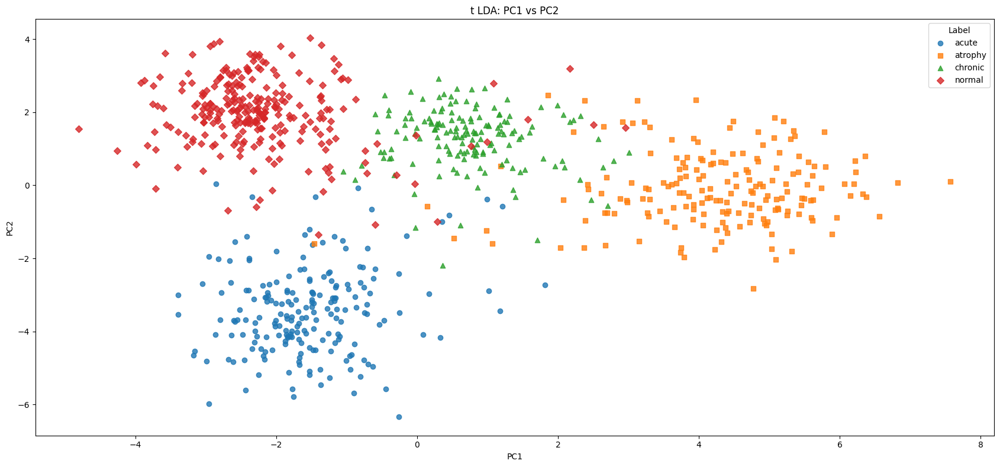

In [498]:
lda = LDA(n_components=2)
X_lda_t = lda.fit_transform(X_t, y)
plot_pc(X_lda_t, y, pc_x=1, pc_y=2, dataset_name="t LDA")

# Clustering

## Spectral

In [499]:
def run_spectral(X, n_clusters=4, n_neighbors=15, random_state=0):
    
    spectral = SpectralClustering(
        n_clusters=n_clusters,
        affinity="nearest_neighbors",  
        n_neighbors=n_neighbors,
        assign_labels="kmeans",
        random_state=random_state,
    )

    labels = spectral.fit_predict(X)
    return np.array(labels)

### Umap, T

C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\olset\AppData\Local\Temp\ipykernel_6868\1167330322.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


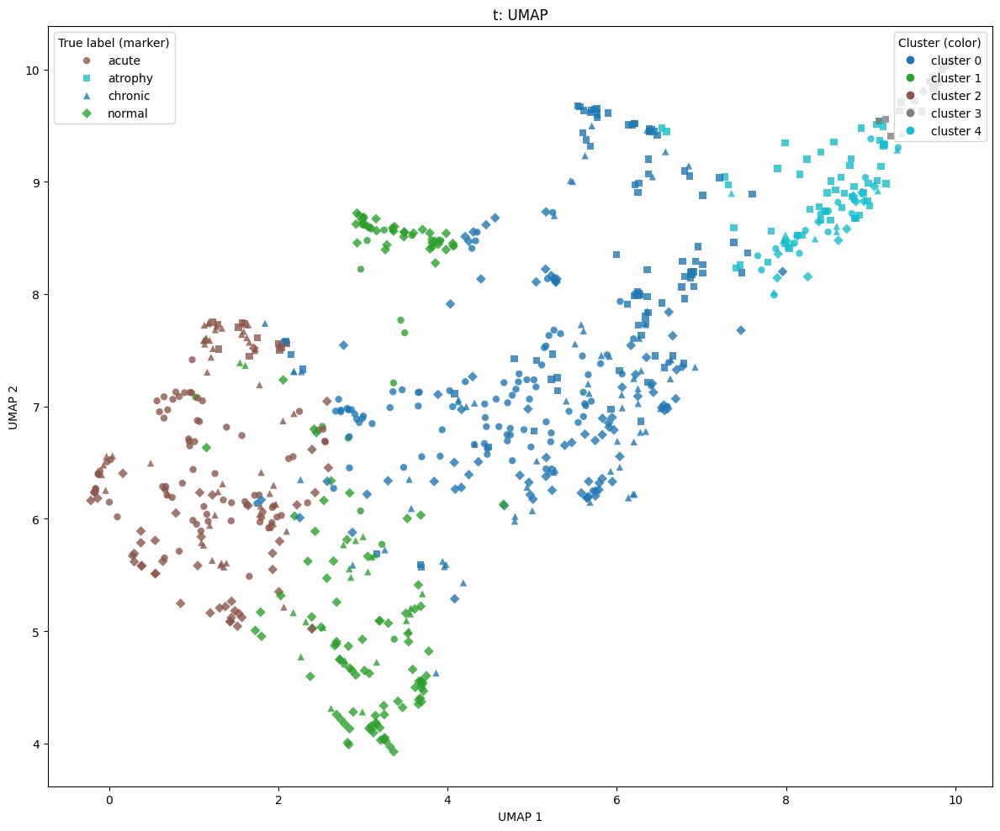

In [500]:
spectral_labels_t = run_spectral(X_t, n_clusters=5, n_neighbors=15, random_state=0)

X_umap_t = get_umap_2d(X_t, n_neighbors=10, min_dist=0.0, random_state=0)
plot_umap(X_umap_t, y, dataset_name="t", cluster_labels=spectral_labels_t)


### LDA, MPC

C:\Users\olset\AppData\Local\Temp\ipykernel_6868\2228504669.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


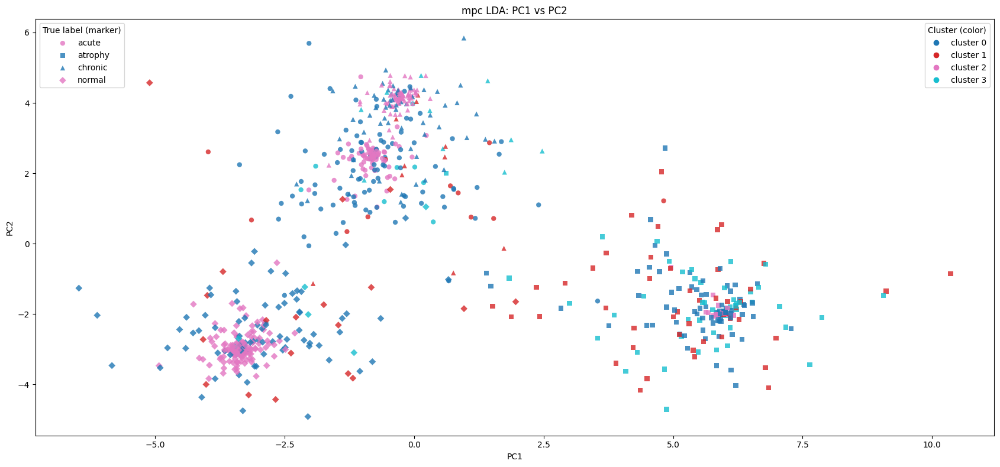

In [501]:
spectral_labels_mpc = run_spectral(
    X_mpc,
    n_clusters=4,
    n_neighbors=15,
    random_state=0,
)
lda = LDA(n_components=2)
X_lda_mpc = lda.fit_transform(X_mpc, y)


plot_pc(
    X_lda_mpc,
    y,
    pc_x=1,
    pc_y=2,
    dataset_name="mpc LDA",
    cluster_labels=spectral_labels_mpc,
)

## Leiden clustering

In [502]:
def run_leiden(X, n_neighbors=15, resolution=1.0, random_state=0):
    """Run Leiden clustering on X (n_samples, n_features)."""
    knn_graph = kneighbors_graph(X, n_neighbors=n_neighbors, include_self=False).tocsr()

    sources, targets = knn_graph.nonzero()
    g = ig.Graph(zip(sources, targets), directed=False)
    g.es["weight"] = knn_graph.data

    partition = la.find_partition(
        g,
        la.RBConfigurationVertexPartition,
        weights="weight",
        resolution_parameter=resolution,
        seed=random_state,
    )

    return np.array(partition.membership)


C:\Users\olset\AppData\Local\Temp\ipykernel_6868\2228504669.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


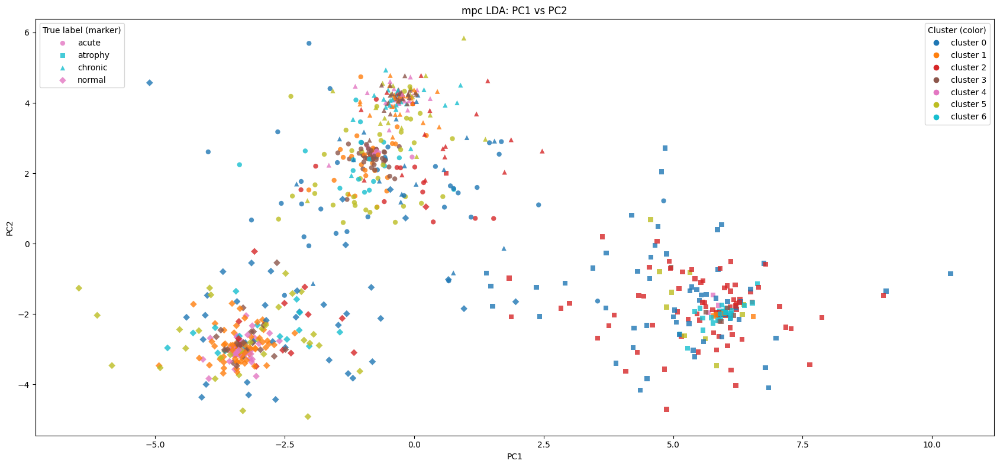

809


In [503]:
leiden_labels_mpc = run_leiden(
    X_mpc,
    n_neighbors=15,
    resolution=1.0,
    random_state=0,
)

lda = LDA(n_components=2)
X_lda_mpc = lda.fit_transform(X_mpc, y)

plot_pc(
    X_lda_mpc,
    y,
    pc_x=1,
    pc_y=2,
    dataset_name="mpc LDA",
    cluster_labels=leiden_labels_mpc,
)
print(len(y))

# Second dataset

## Making the subset

In [ ]:
# Making a mask for a subset, with only atropy and normal

target_labels = ["normal", "atrophy"]
mask = [label in target_labels for label in labels]

In [505]:
# Using the mask to make data and labels subsets
labels_subset = [label for label, keep in zip(labels, mask) if keep]

X_mpc_subset = X_mpc[mask]
X_mp_subset = X_mp[mask]
X_t_subset = X_t[mask]

In [506]:
# Defines X and y
Xs = [X_mpc_subset, X_mp_subset, X_t_subset]
y_subset = np.array(labels_subset)

# Scales the features
scaler = StandardScaler()
for i in range(len(Xs)):
    Xs[i] = scaler.fit_transform(Xs[i])

X_mpc_subset, X_mp_subset, X_t_subset  = Xs

In [507]:
marker_map = {
    'atrophy': 's',
    'normal':  'v',
}

## Dimensjons reduksjon

### UMAP

#### Functions

In [508]:
def plot_umap_subset(X_umap, y, dataset_name="", cluster_labels=None):
    fig, ax = plt.subplots(figsize=(10, 8))

    y = np.asarray(y)
    cluster_labels = np.asarray(cluster_labels)

    # Identify unique clusters and create a discrete colormap
    clusters = np.unique(cluster_labels)
    cmap = plt.cm.get_cmap("tab10", len(clusters))

    # Plot points: marker = pathology, color = cluster
    unique_labels = np.unique(y)
    for label in unique_labels:
        marker = marker_map[label]
        idx_label = (y == label)

        colors_for_points = cmap(cluster_labels[idx_label])

        ax.scatter(
            X_umap[idx_label, 0],
            X_umap[idx_label, 1],
            marker=marker,
            c=colors_for_points,
            alpha=0.8,
            edgecolors="none",
        )

    # Legend 1: pathological classes (shape only, black markers)
    label_handles = [
        Line2D(
            [0], [0],
            marker=marker_map[label],
            linestyle="none",
            color="k",
            label=label,
        )
        for label in unique_labels
    ]
    label_legend = ax.legend(
        handles=label_handles,
        title="Pathological classification",
        loc="upper left",
    )
    ax.add_artist(label_legend)

    # Legend 2: clusters (color only)
    cluster_handles = [
        Line2D(
            [0], [0],
            marker="o",
            linestyle="none",
            color=cmap(c),
            label=f"cluster {c}",
        )
        for c in clusters
    ]
    ax.legend(
        handles=cluster_handles,
        title="Cluster (color)",
        loc="upper right",
    )

    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(f"{dataset_name}: UMAP")
    plt.tight_layout()
    plt.show()



In [509]:
def sweep_umap_subset(X, y, dataset_name="", n_neighbors_list=None, min_dist_list=None, random_state=0):
    """
    Run UMAP for several (n_neighbors, min_dist) combinations and plot each result.
    """
    if n_neighbors_list is None:
        n_neighbors_list = [5, 10, 15, 30, 50]    
    if min_dist_list is None:
        min_dist_list = [0.0, 0.1, 0.3]     

    for n_n in n_neighbors_list:
        for m_d in min_dist_list:
            print(f"{dataset_name}: UMAP with n_neighbors={n_n}, min_dist={m_d}")
            X_umap = get_umap_2d(X, n_neighbors=n_n, min_dist=m_d, random_state=random_state)
            plot_umap(X_umap, y, dataset_name=f"{dataset_name} (n={n_n}, d={m_d})")

#### mpc

mpc: UMAP with n_neighbors=5, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


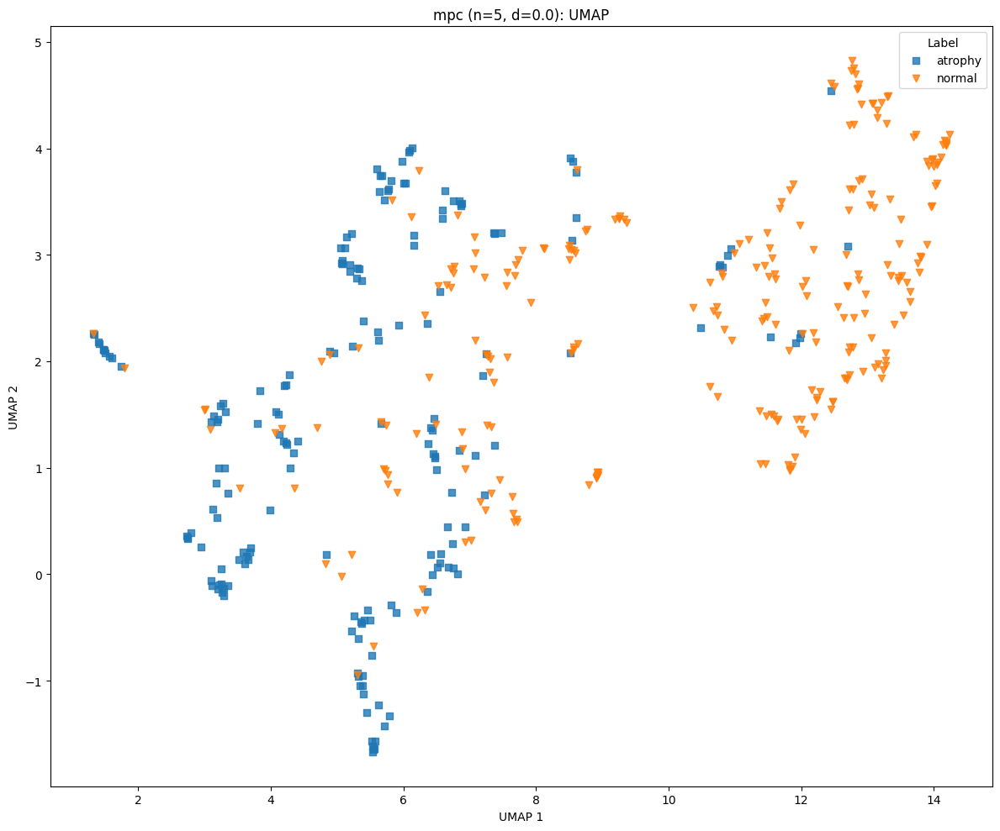

mpc: UMAP with n_neighbors=5, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


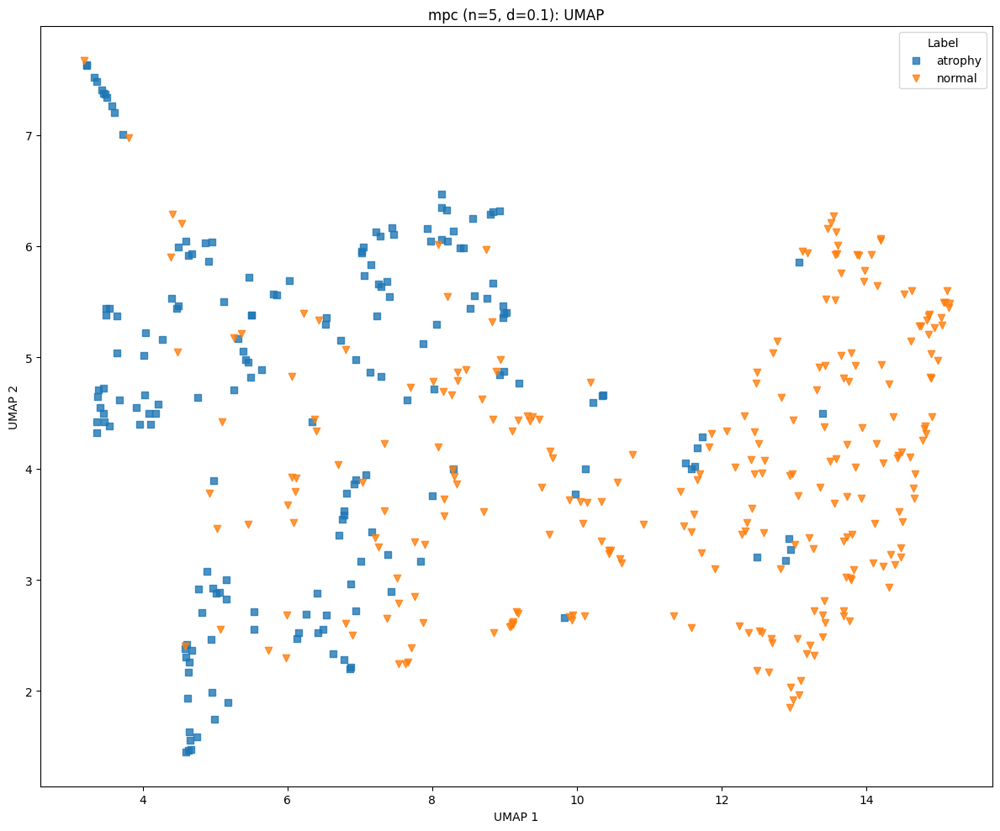

mpc: UMAP with n_neighbors=5, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


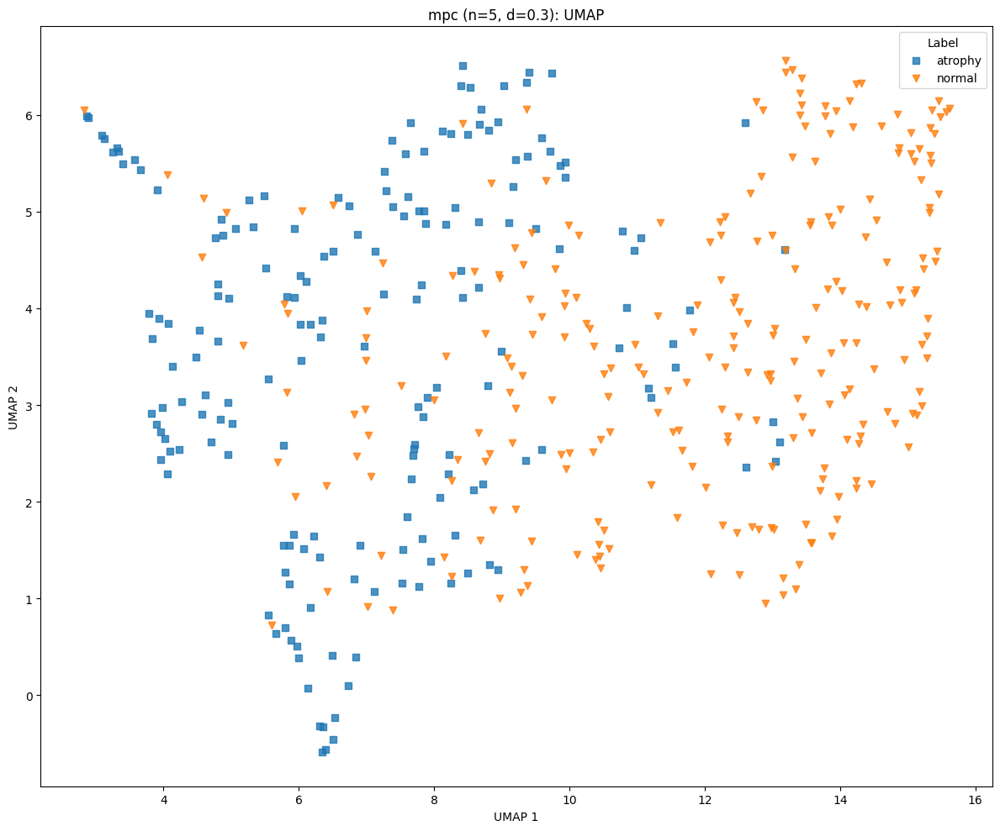

mpc: UMAP with n_neighbors=10, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


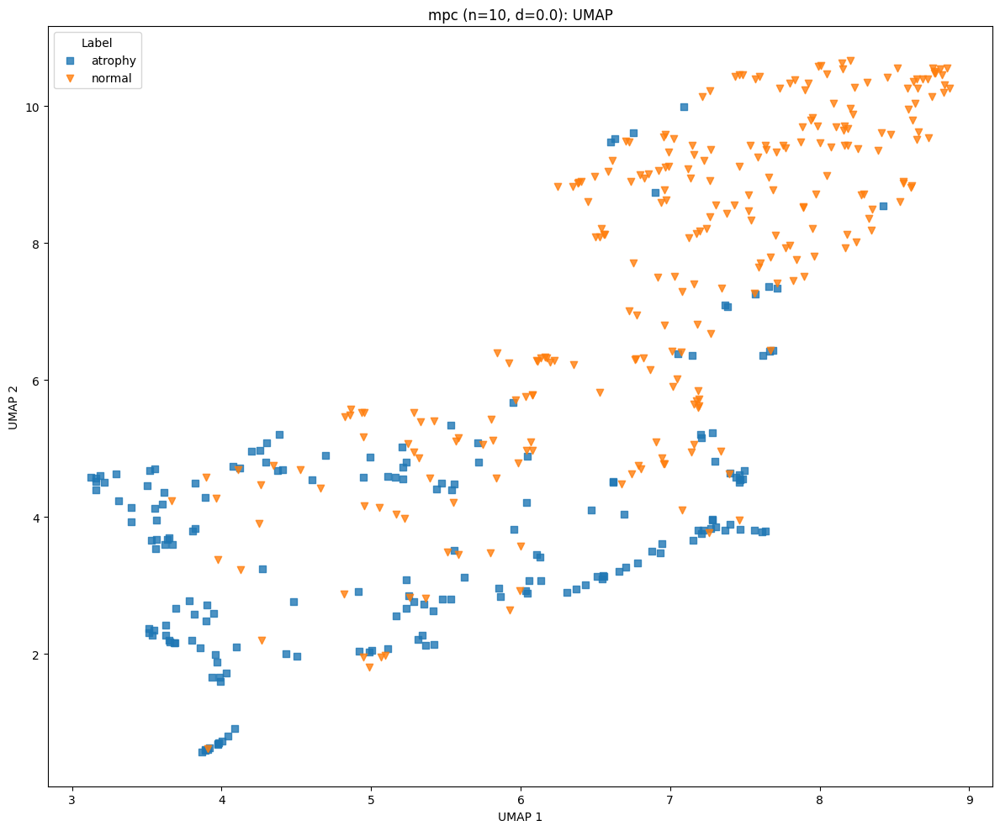

mpc: UMAP with n_neighbors=10, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


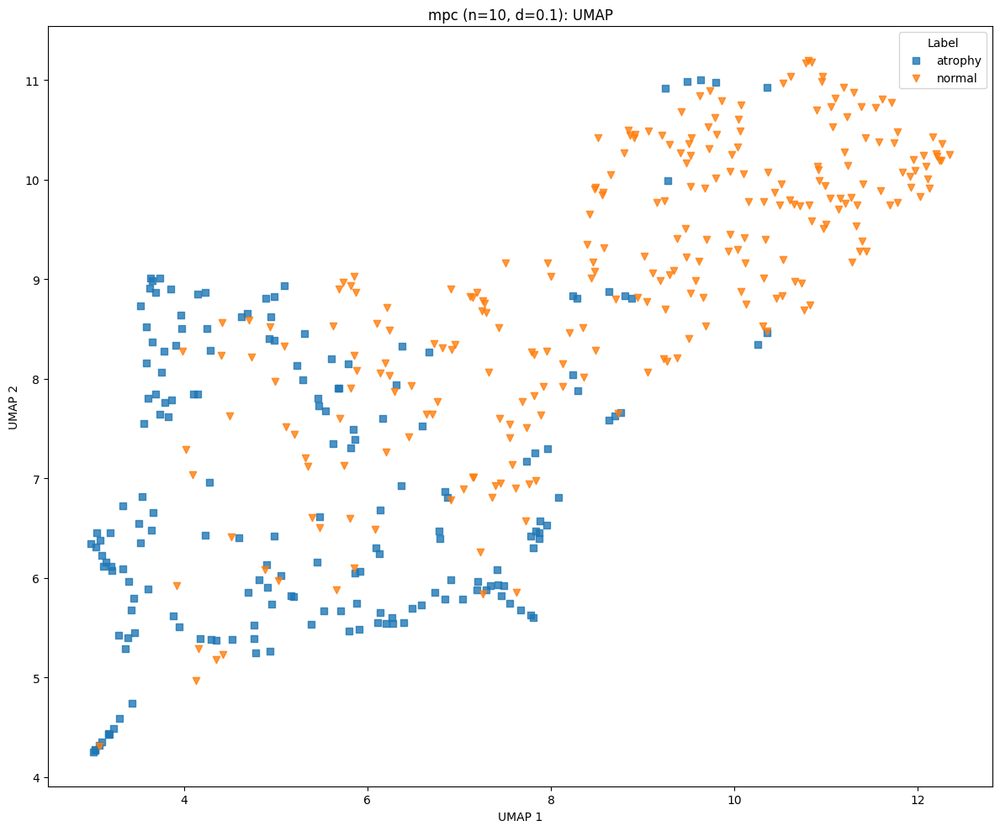

mpc: UMAP with n_neighbors=10, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


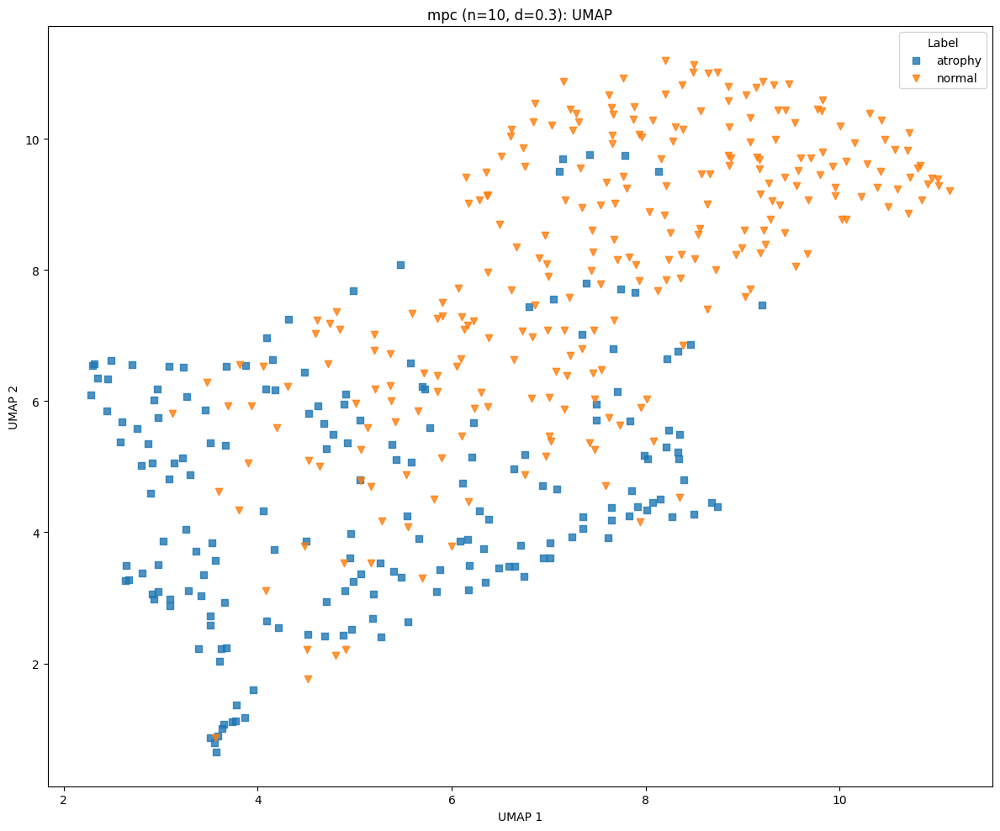

mpc: UMAP with n_neighbors=15, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


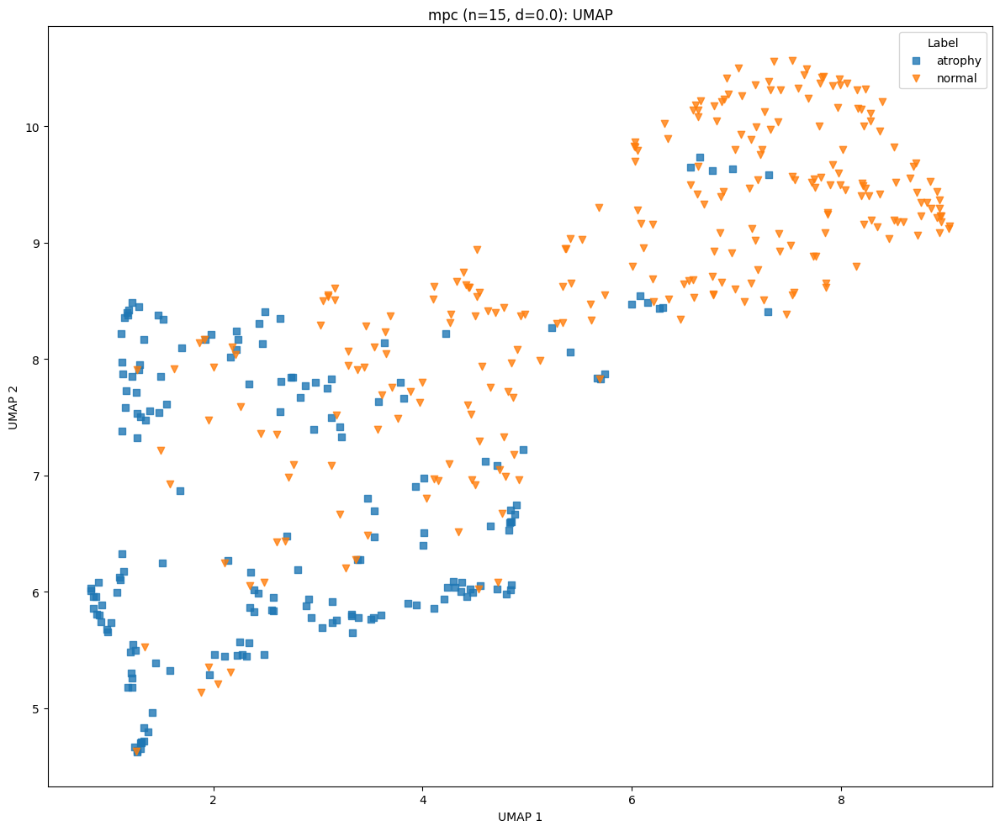

mpc: UMAP with n_neighbors=15, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


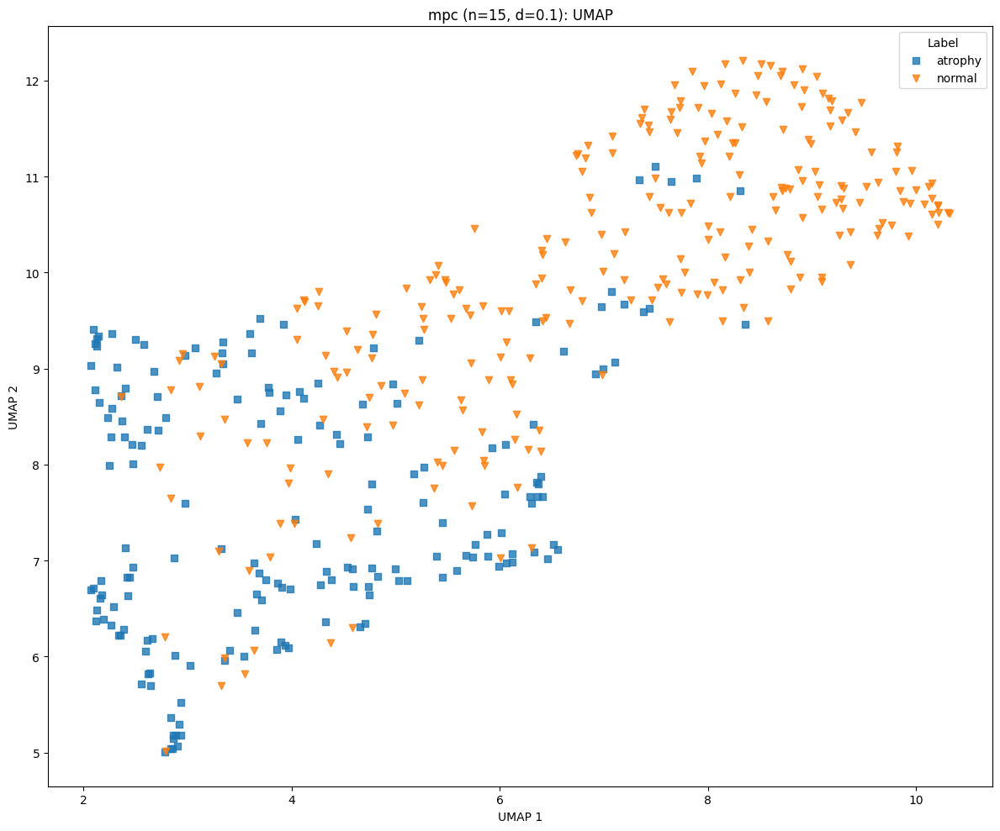

mpc: UMAP with n_neighbors=15, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


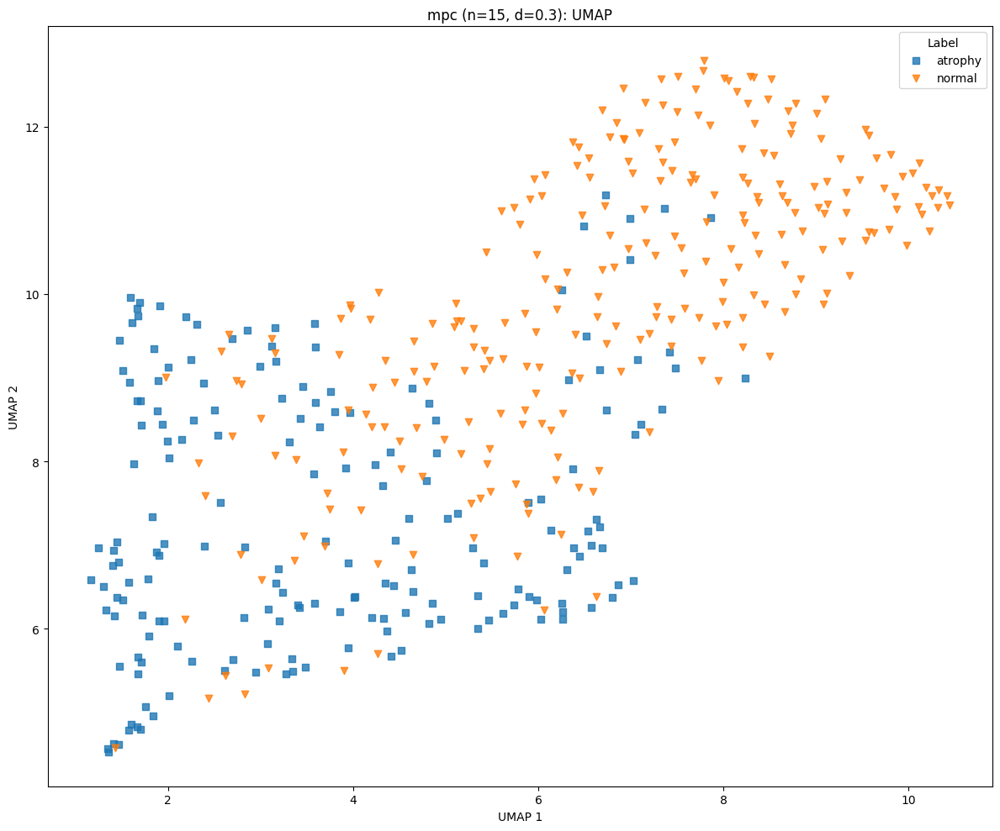

mpc: UMAP with n_neighbors=30, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


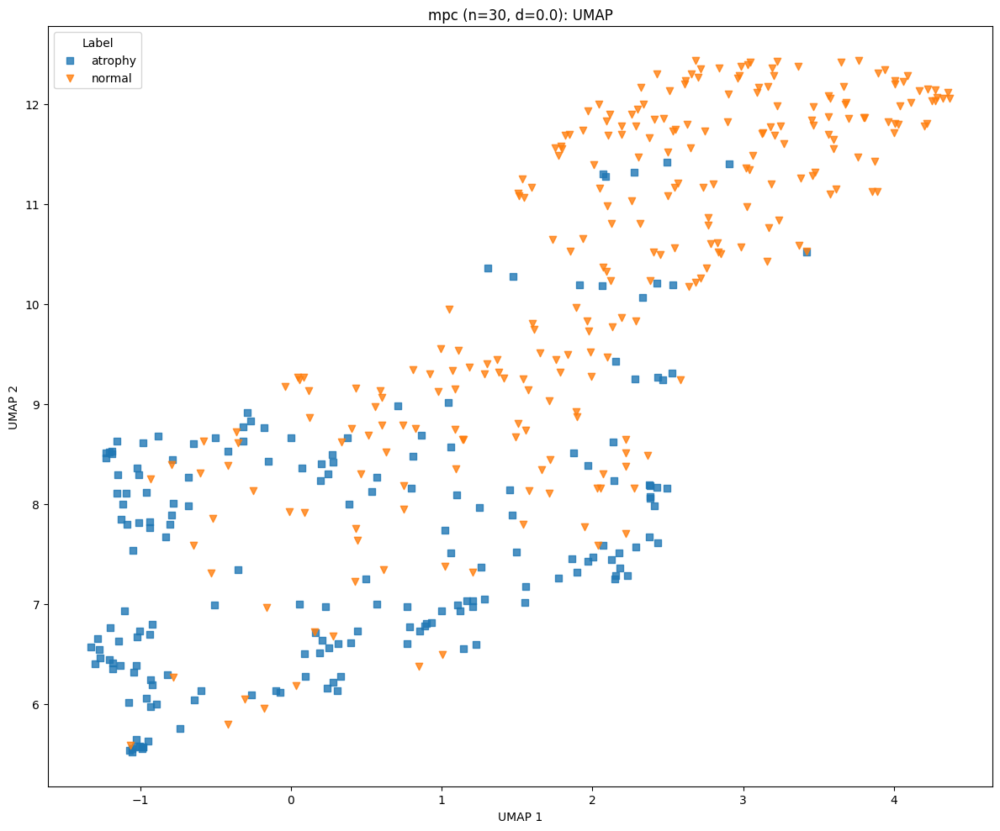

mpc: UMAP with n_neighbors=30, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


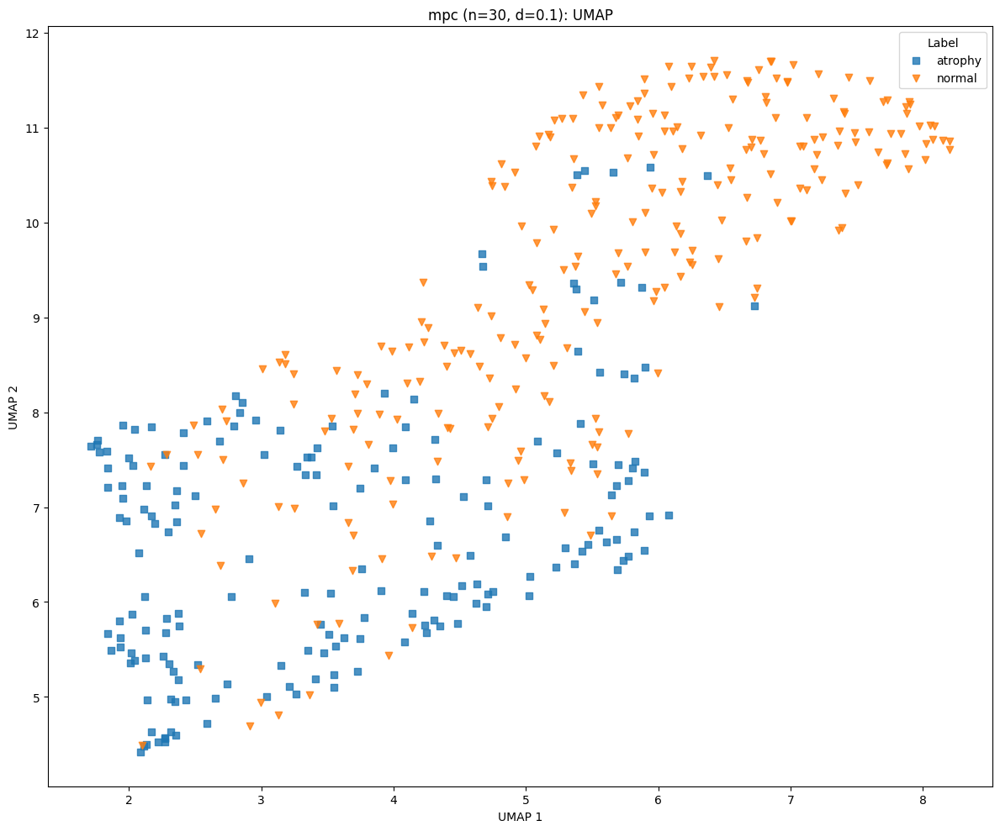

mpc: UMAP with n_neighbors=30, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


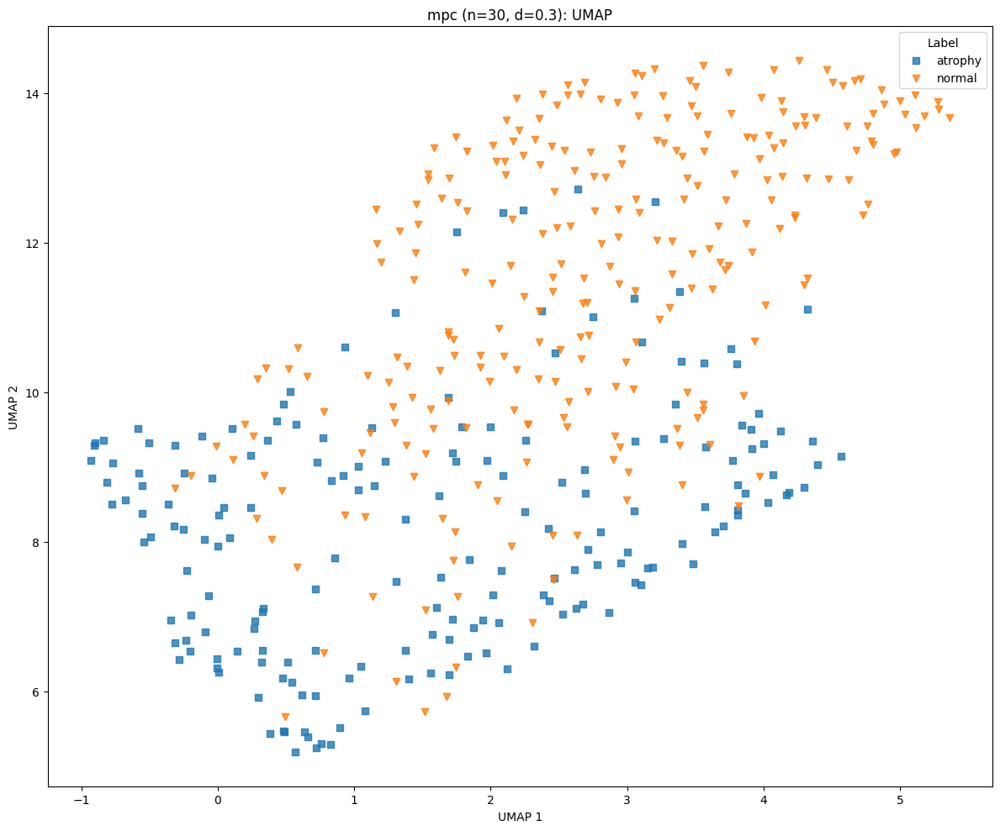

mpc: UMAP with n_neighbors=50, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


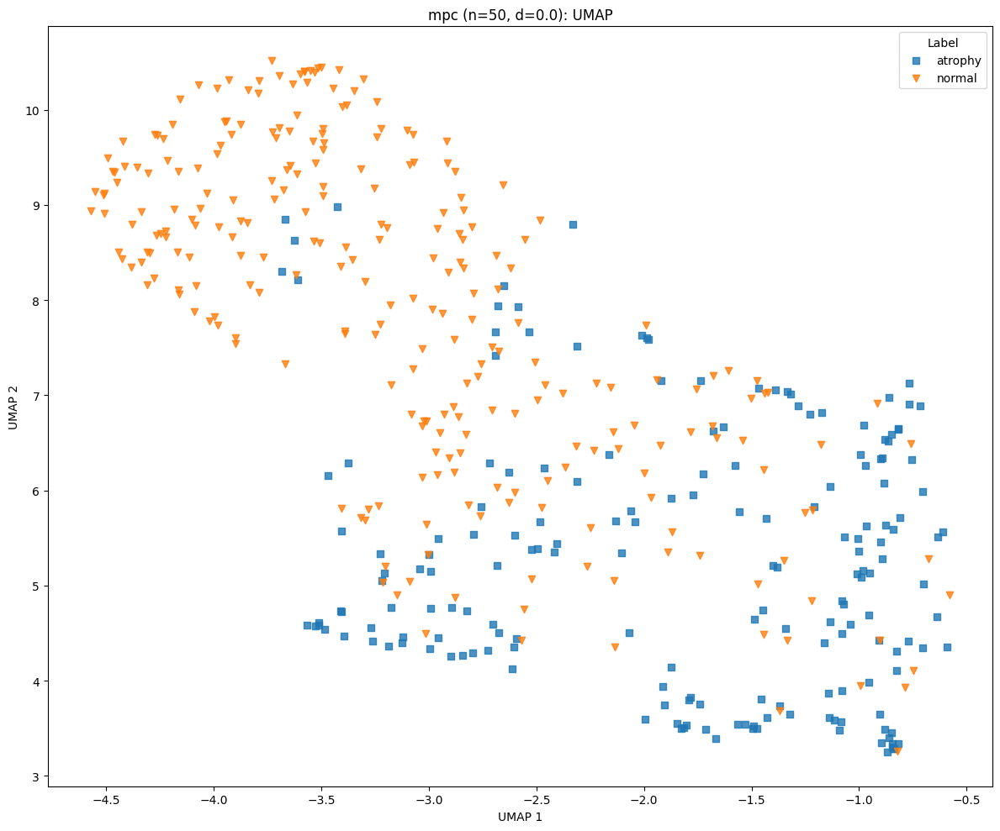

mpc: UMAP with n_neighbors=50, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


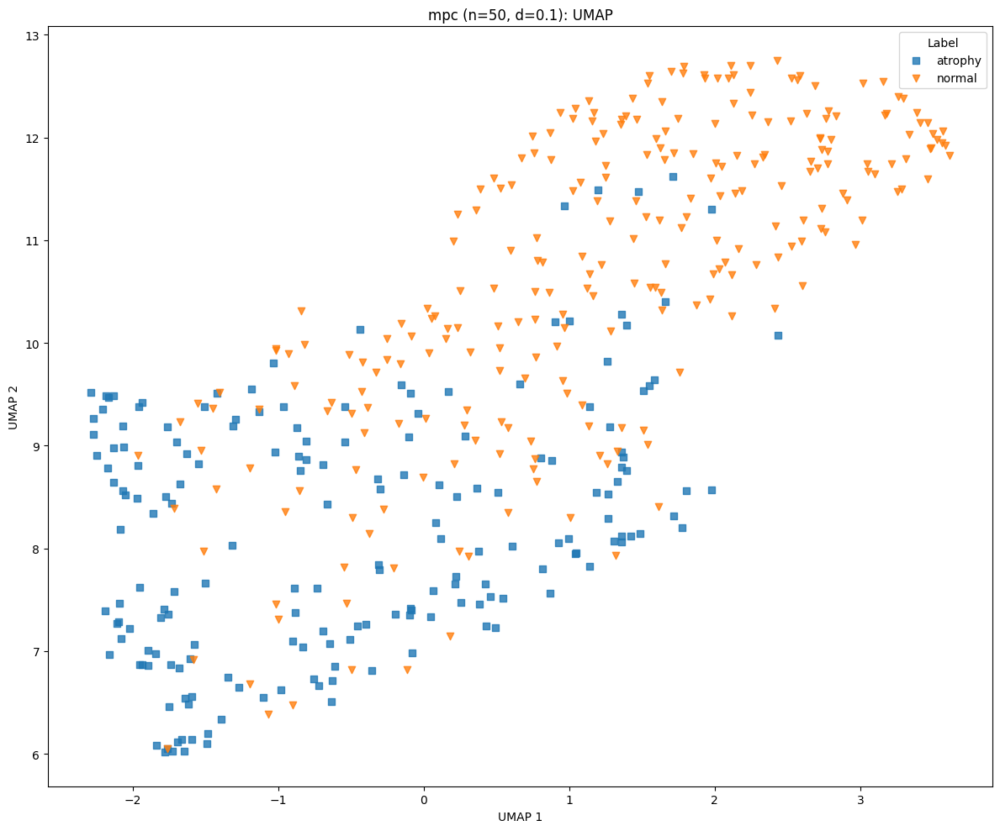

mpc: UMAP with n_neighbors=50, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


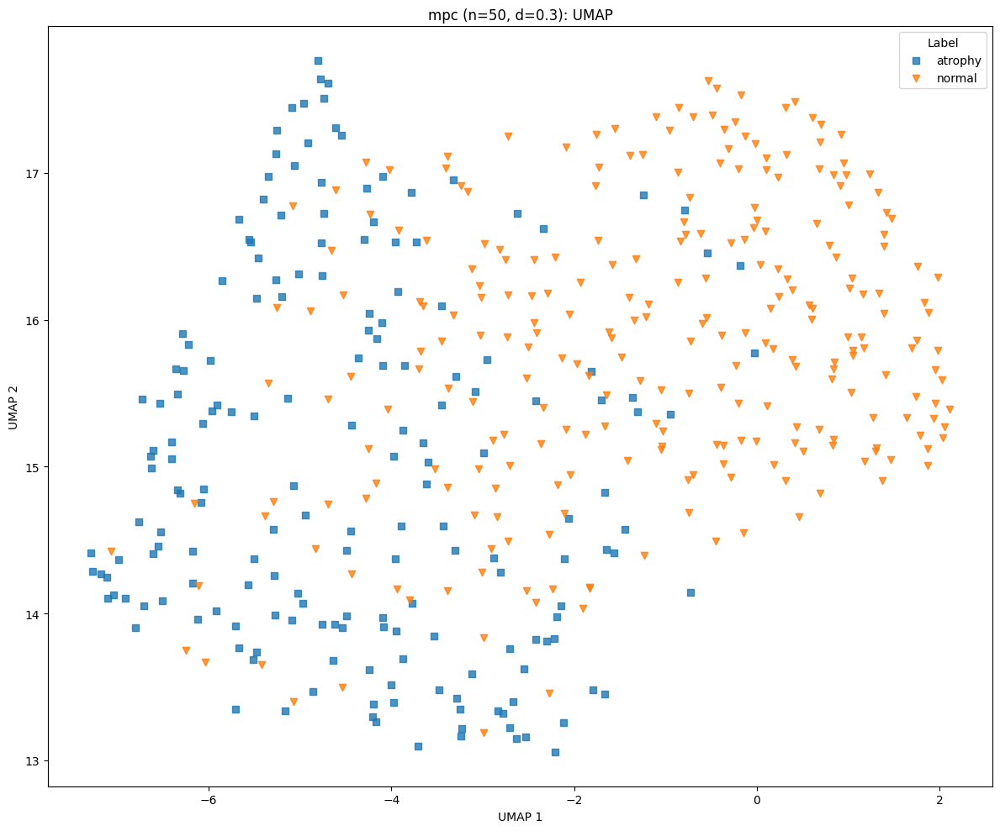

In [510]:
sweep_umap(X_mpc_subset, y_subset, dataset_name="mpc")

#### mp

mp: UMAP with n_neighbors=5, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


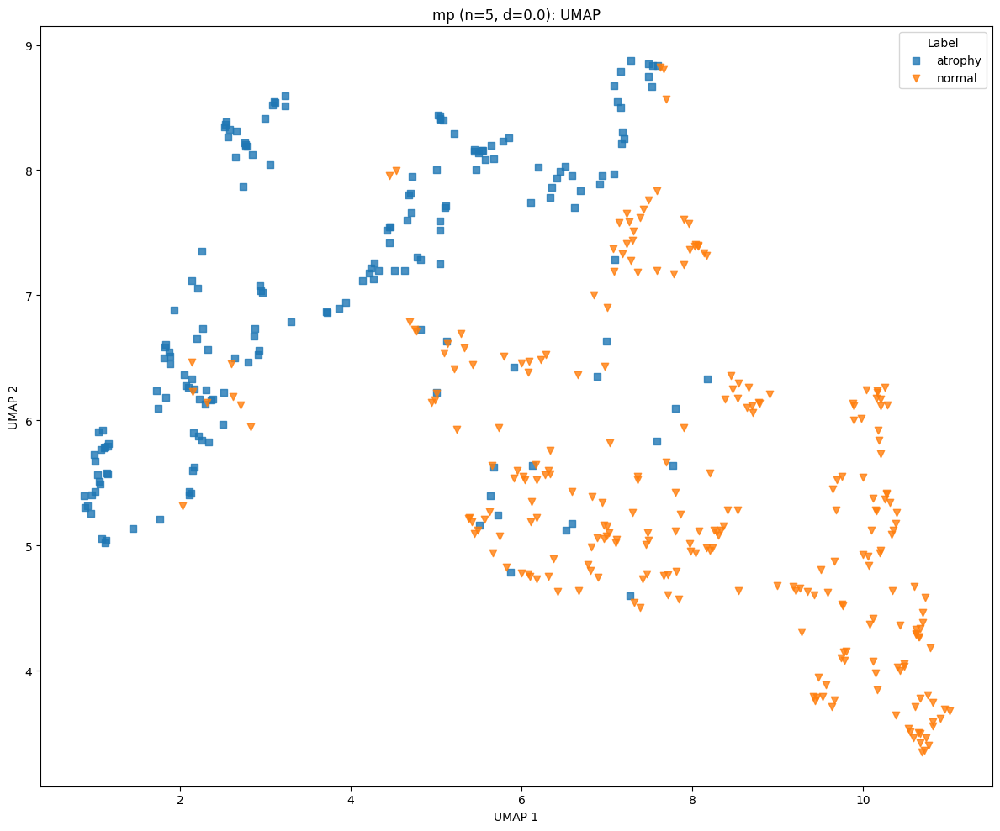

mp: UMAP with n_neighbors=5, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


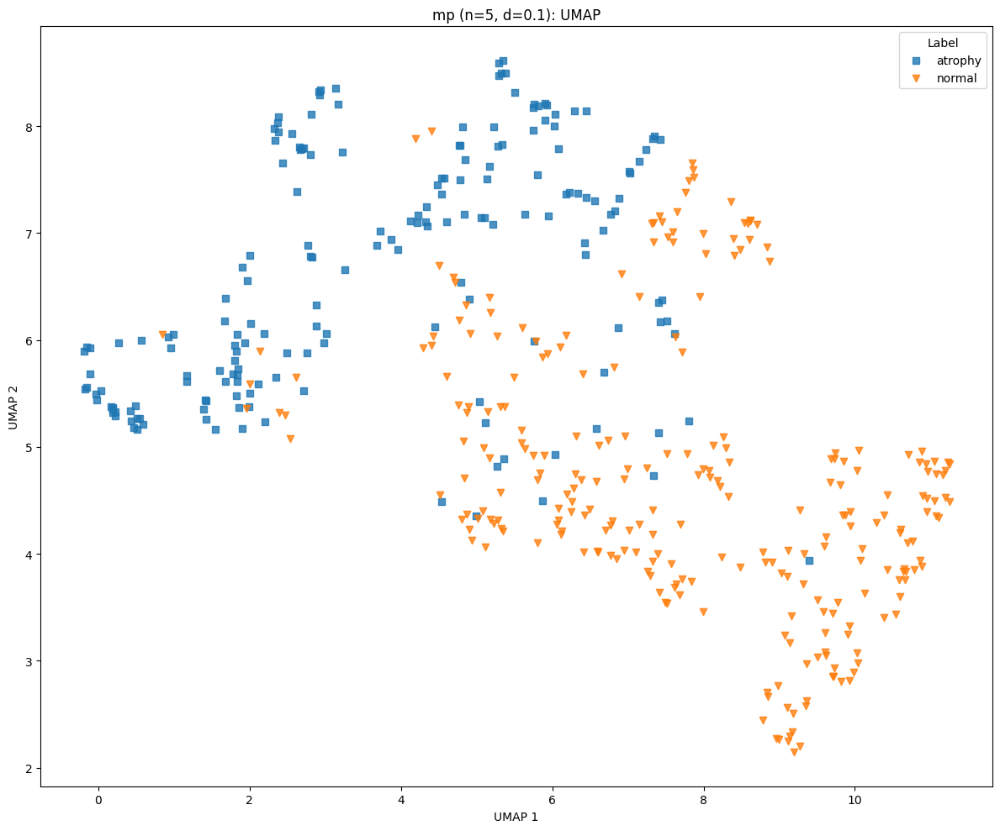

mp: UMAP with n_neighbors=5, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


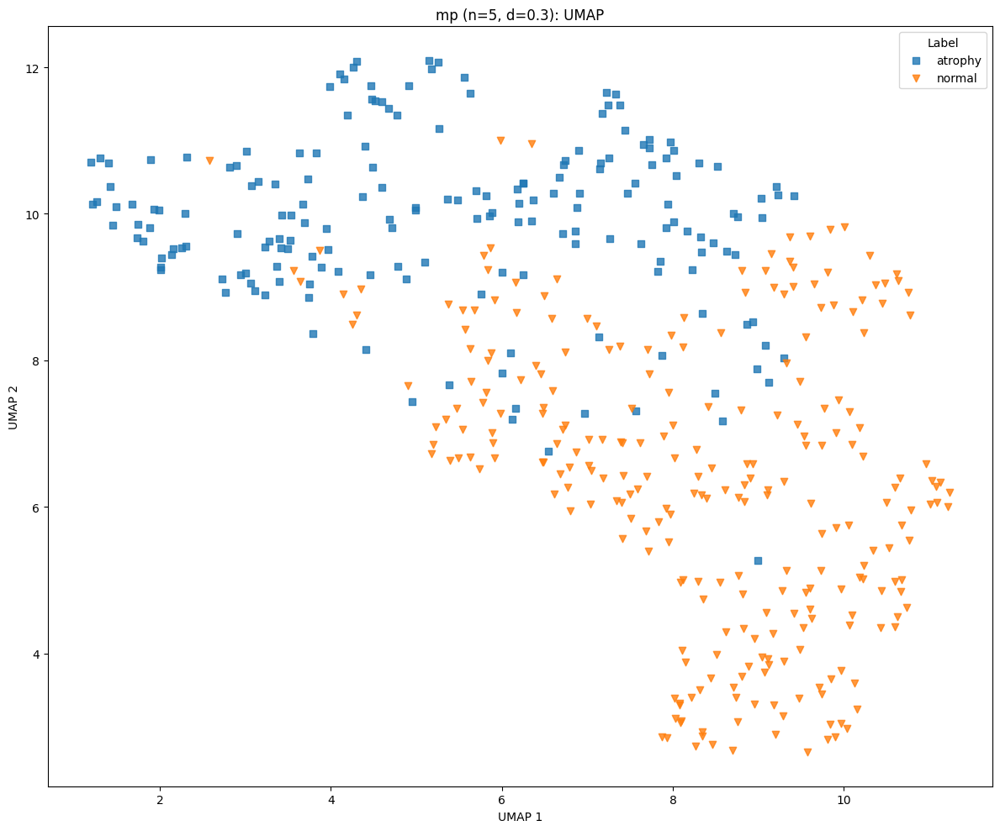

mp: UMAP with n_neighbors=10, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


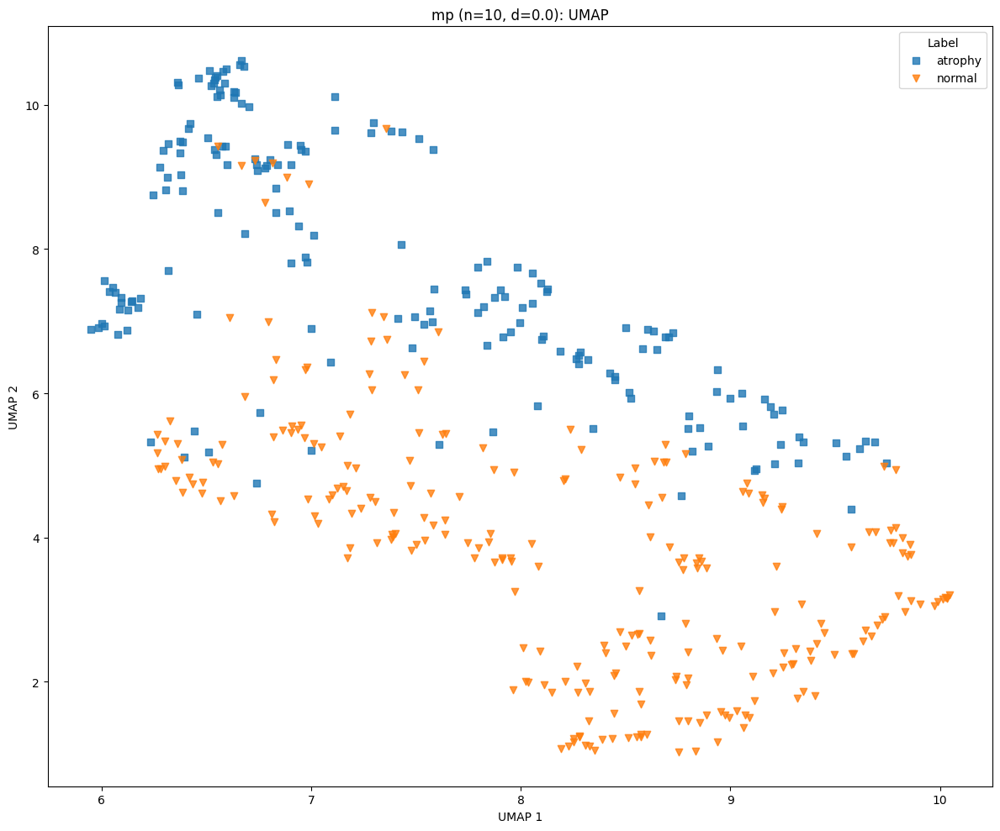

mp: UMAP with n_neighbors=10, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


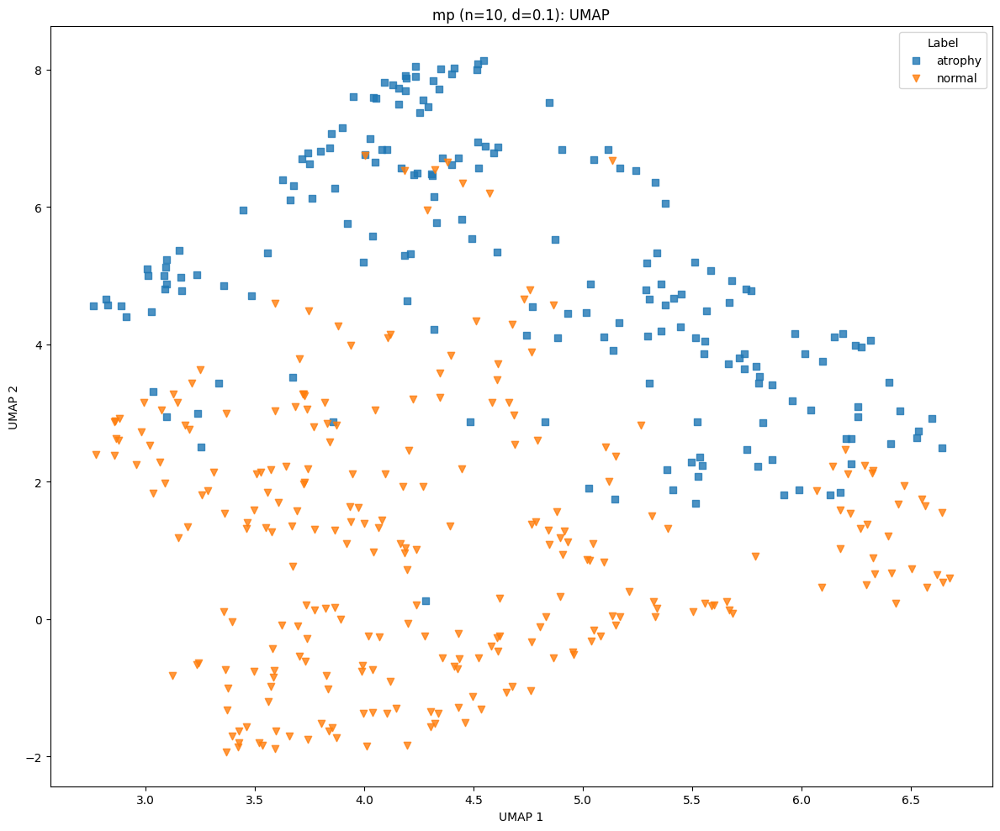

mp: UMAP with n_neighbors=10, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


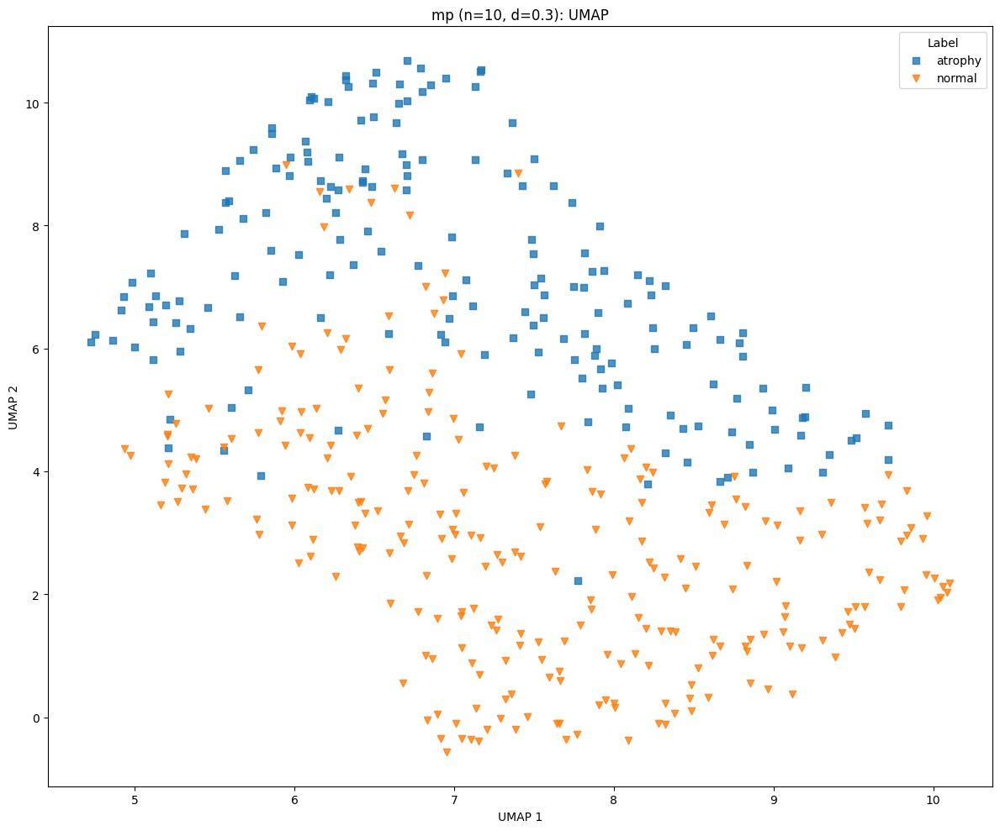

mp: UMAP with n_neighbors=15, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


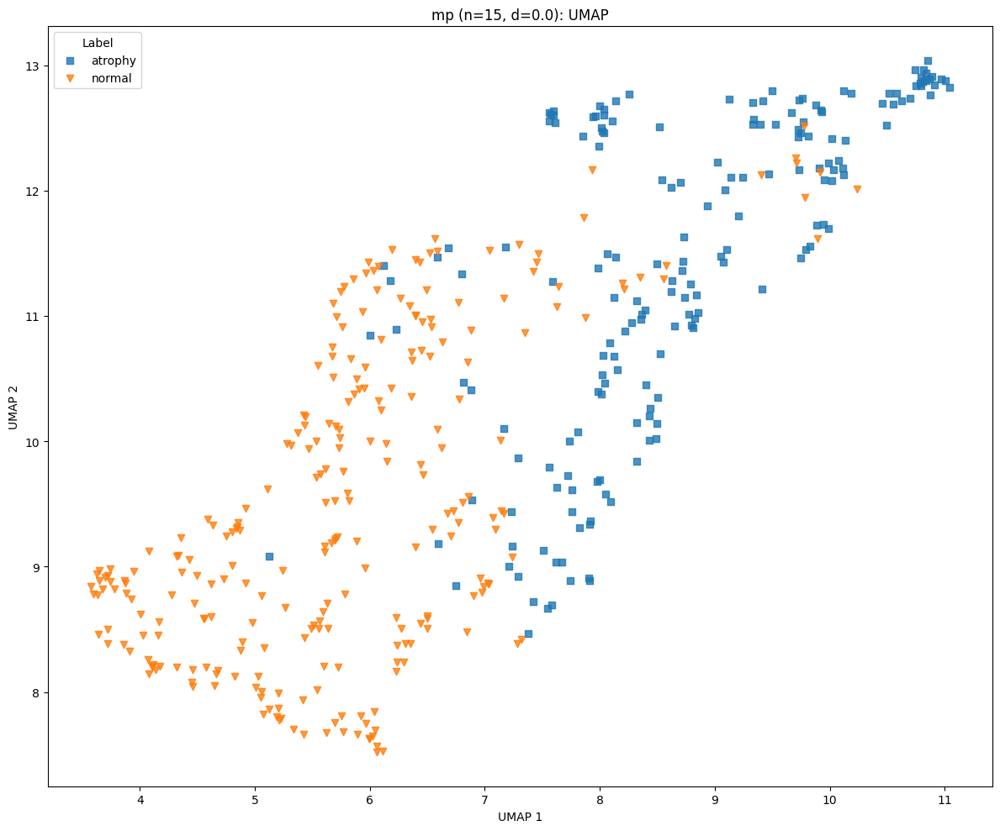

mp: UMAP with n_neighbors=15, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


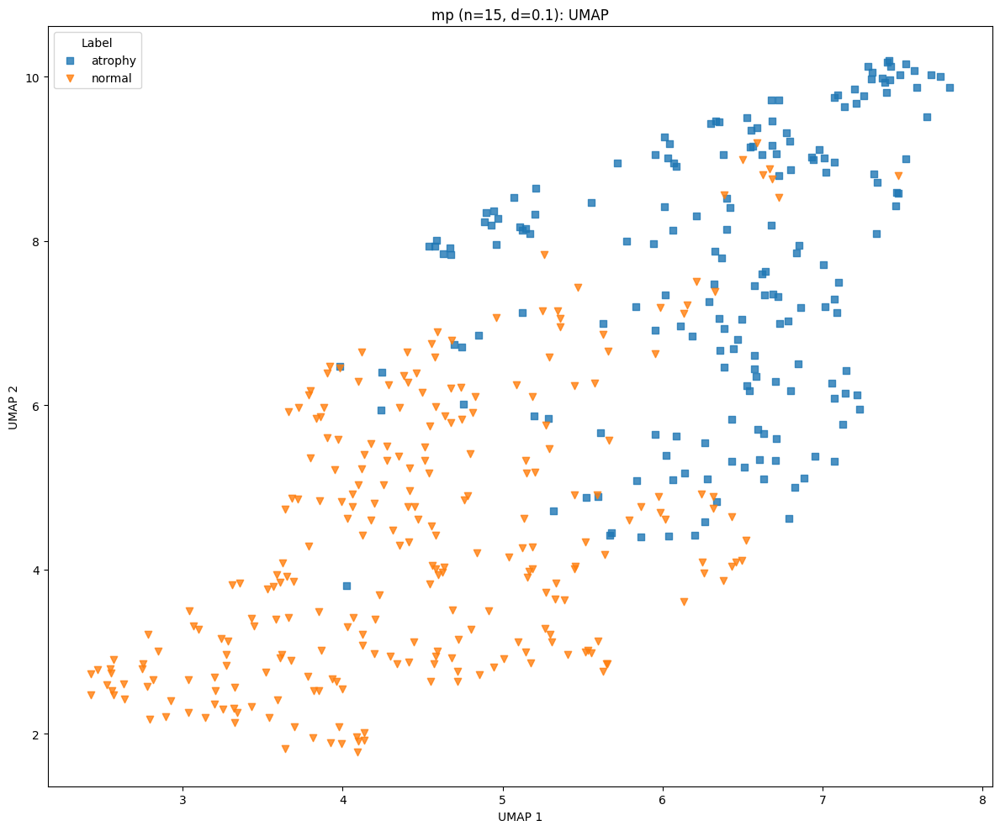

mp: UMAP with n_neighbors=15, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


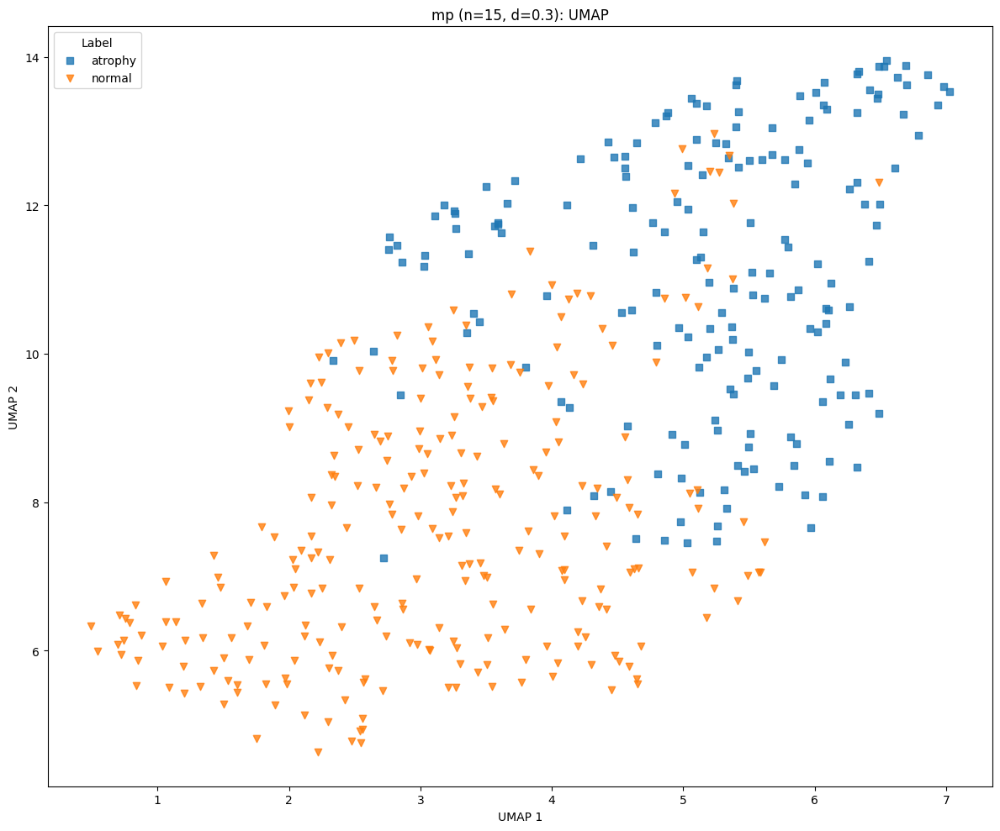

mp: UMAP with n_neighbors=30, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


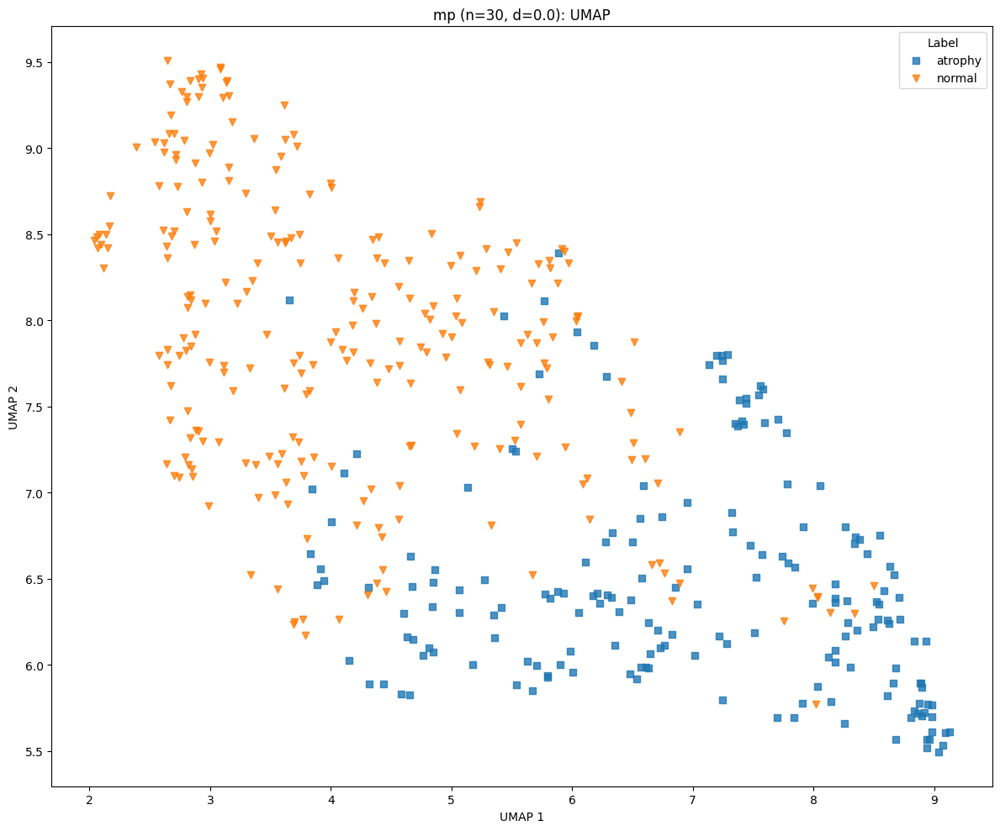

mp: UMAP with n_neighbors=30, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


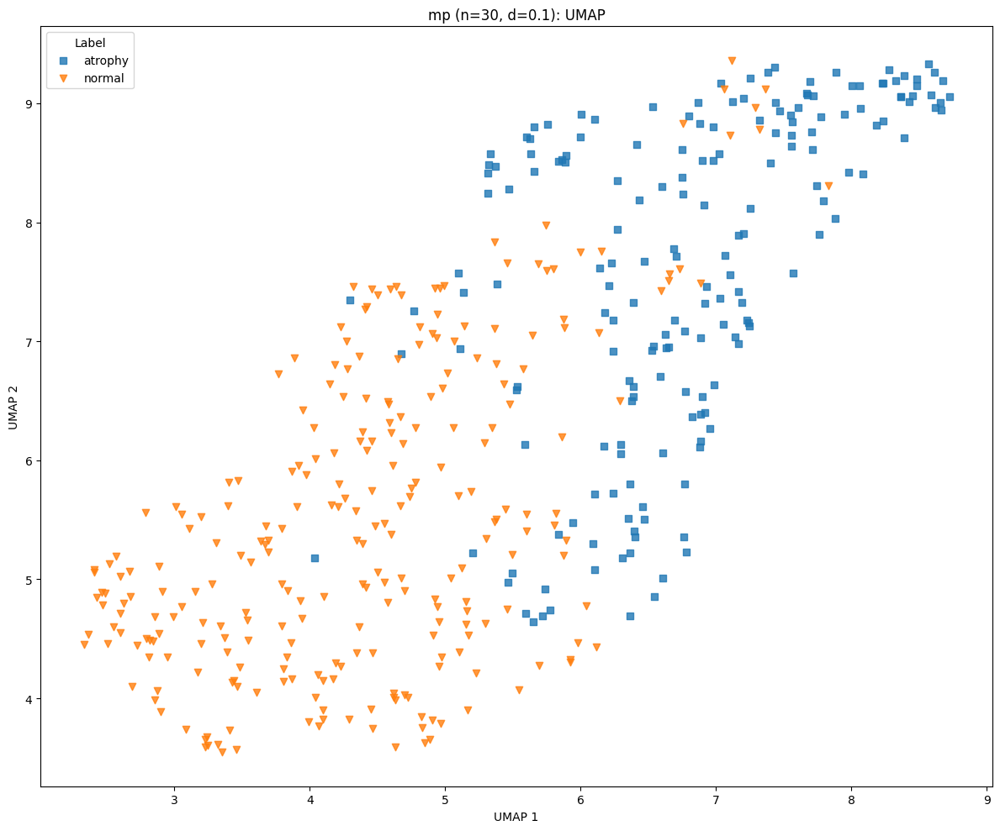

mp: UMAP with n_neighbors=30, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


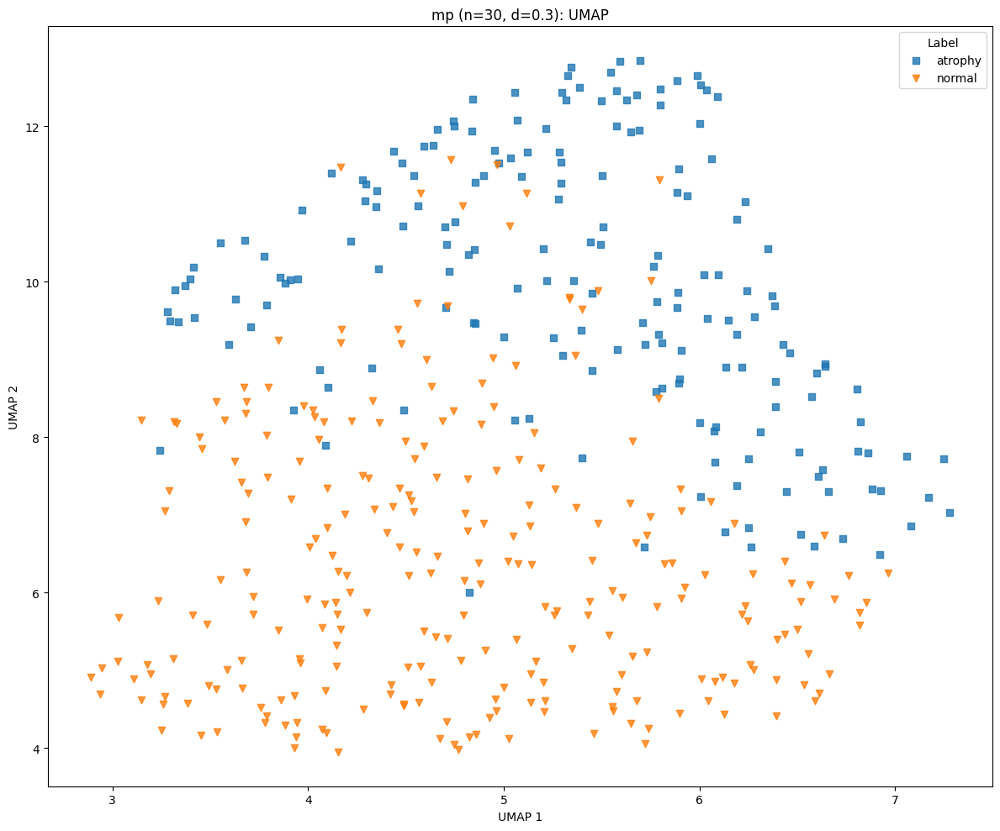

mp: UMAP with n_neighbors=50, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


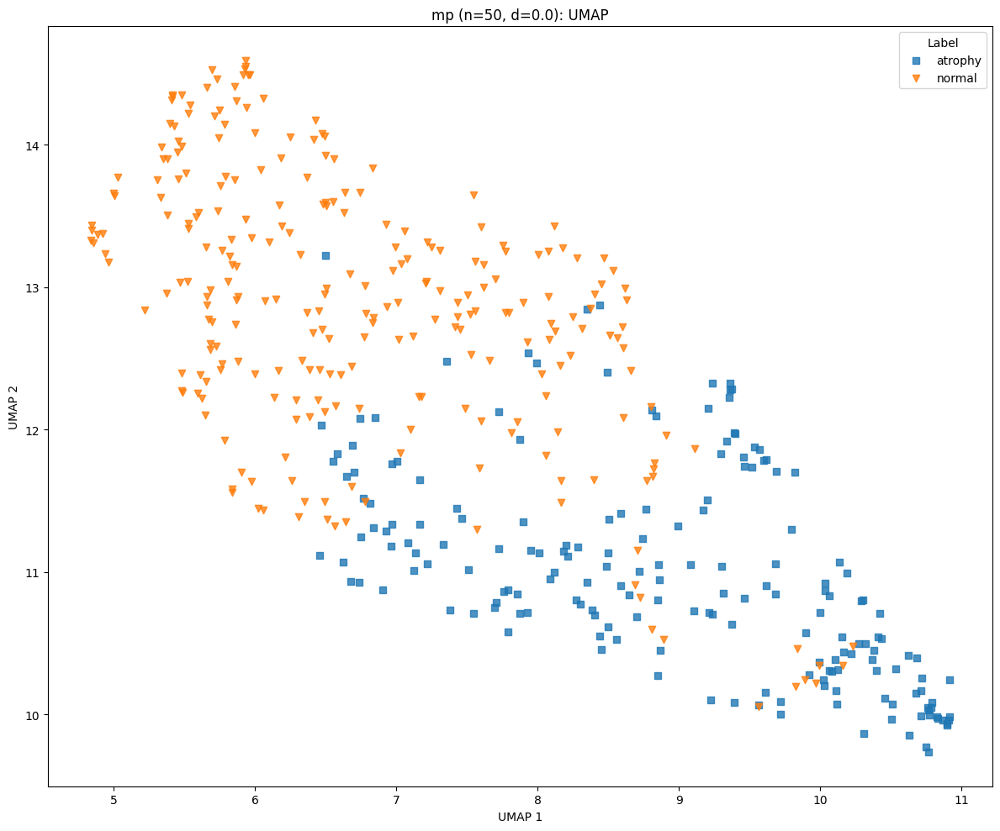

mp: UMAP with n_neighbors=50, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


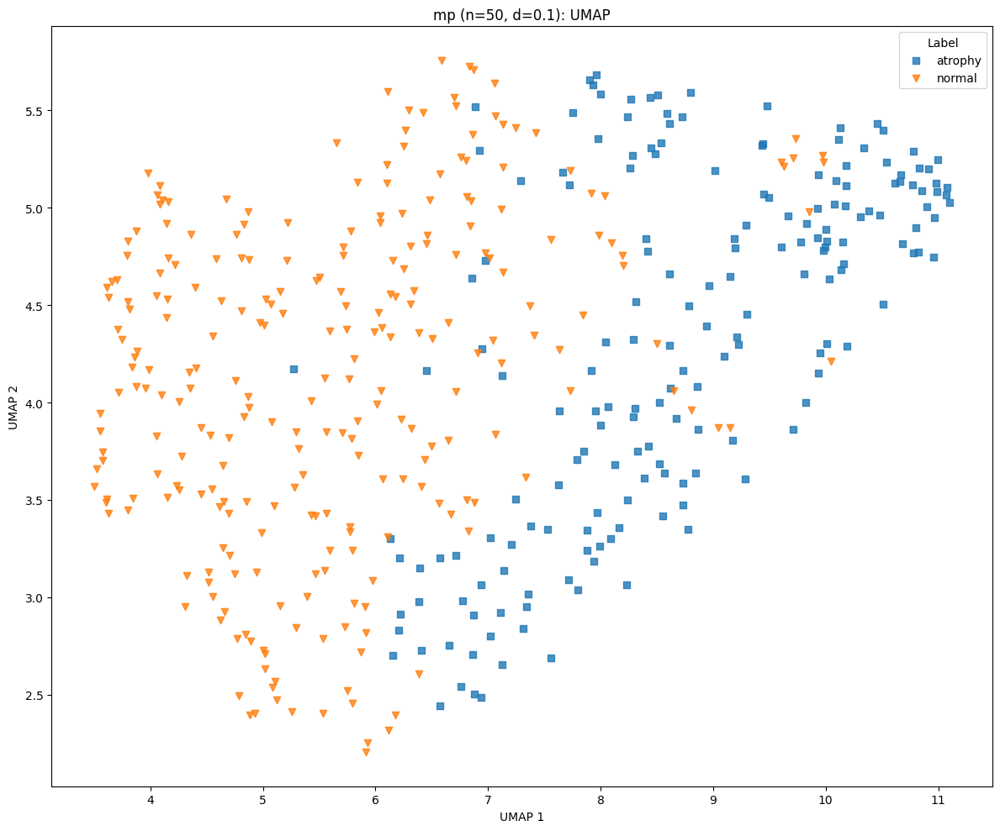

mp: UMAP with n_neighbors=50, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


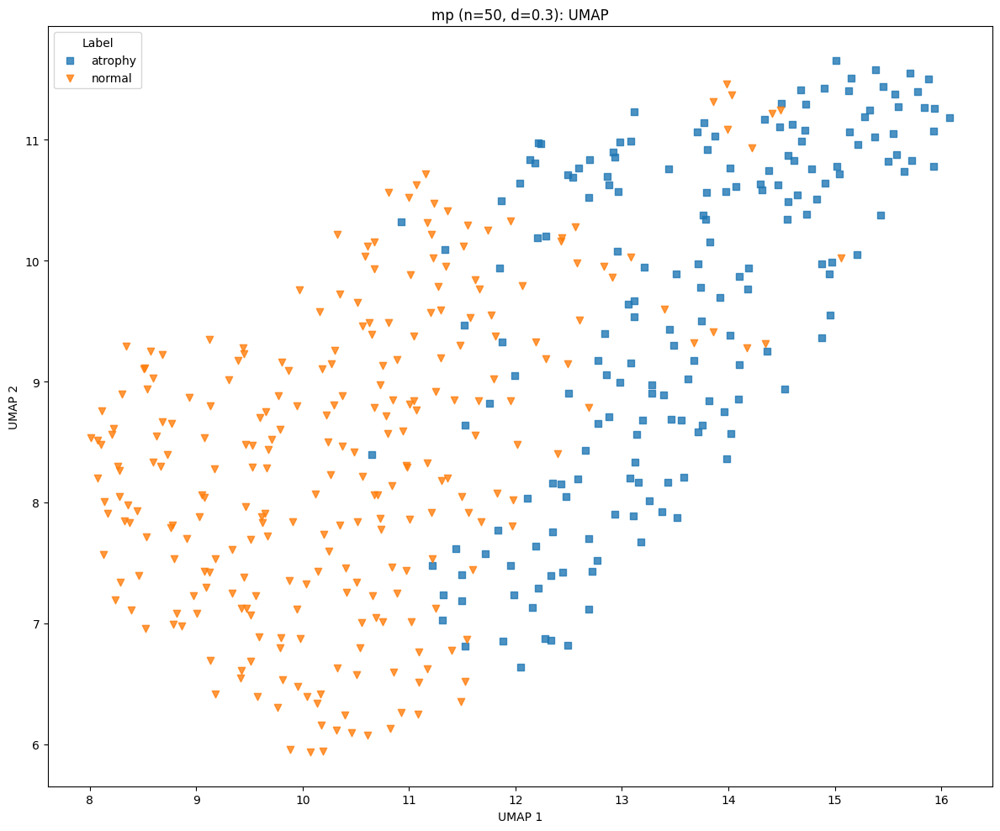

In [511]:
sweep_umap(X_mp_subset, y_subset, dataset_name="mp")

#### t

t: UMAP with n_neighbors=5, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


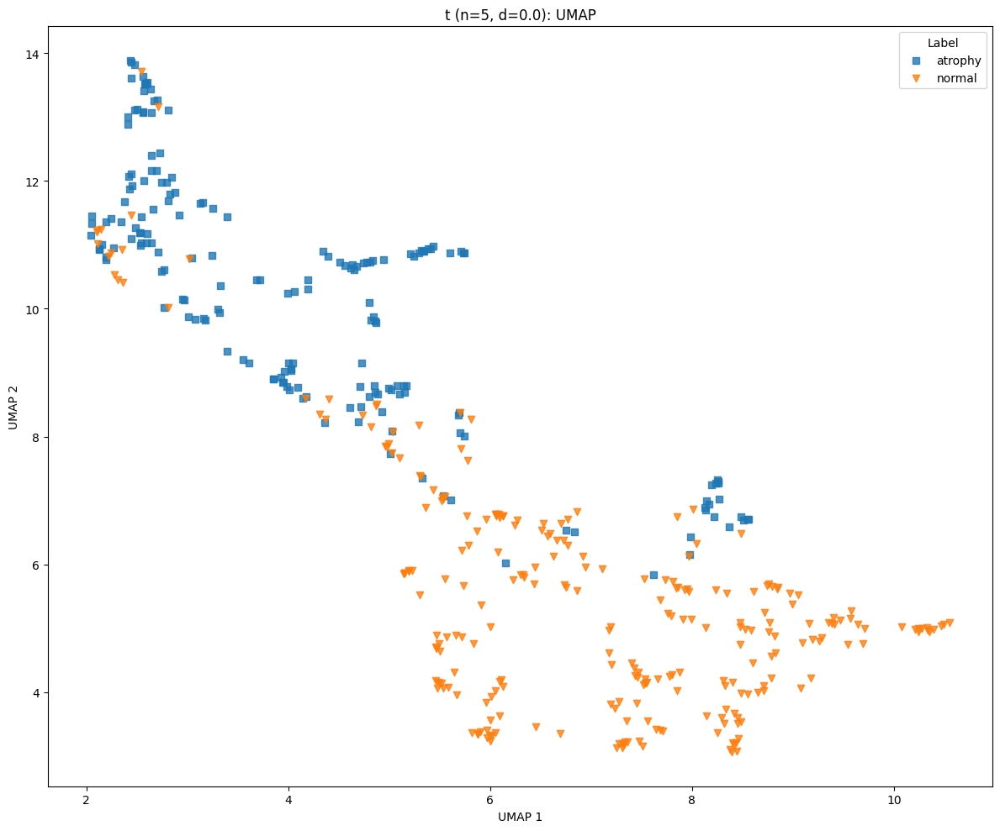

t: UMAP with n_neighbors=5, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


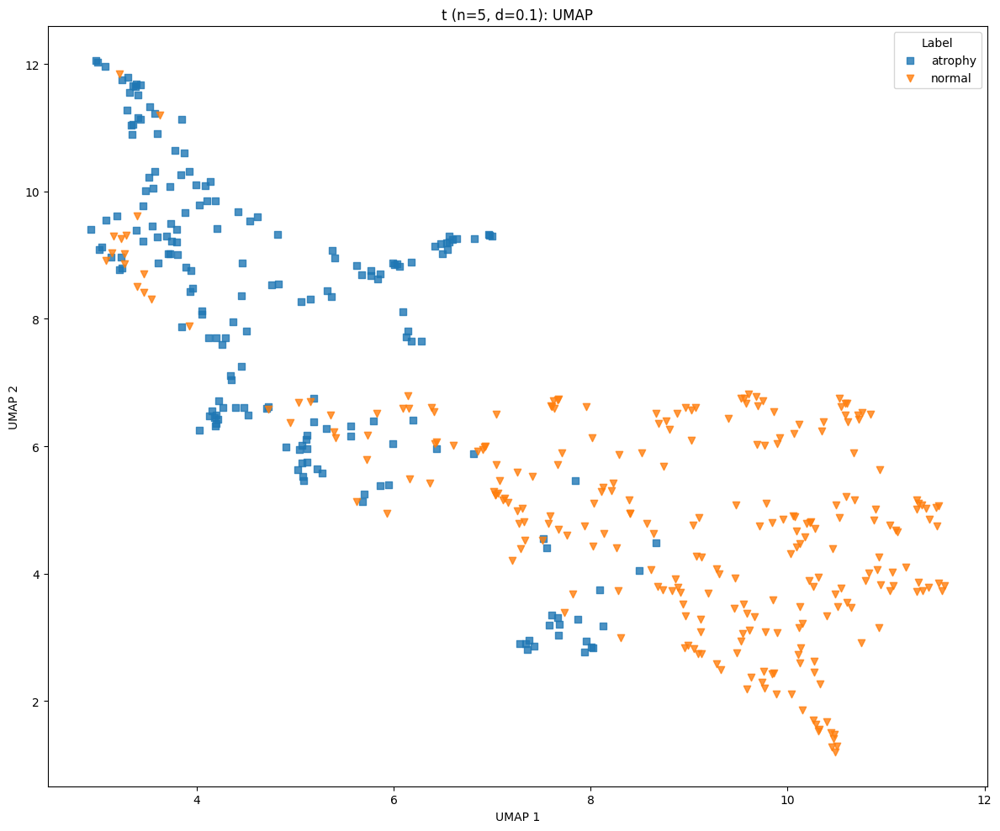

t: UMAP with n_neighbors=5, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


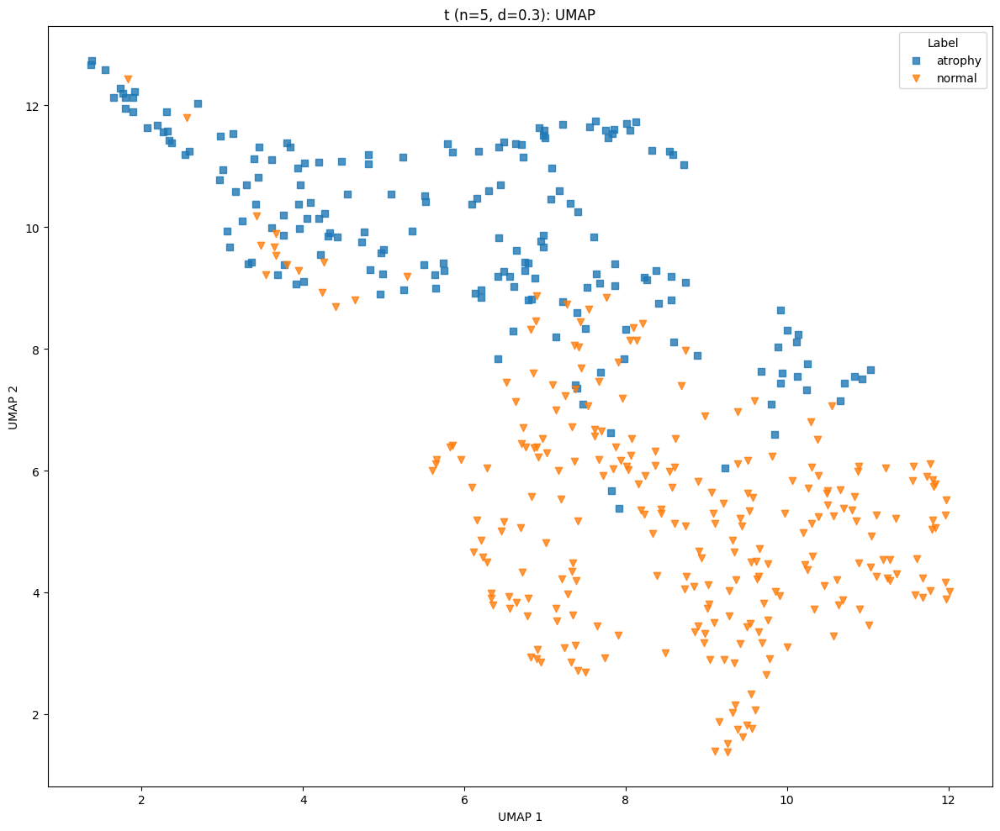

t: UMAP with n_neighbors=10, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


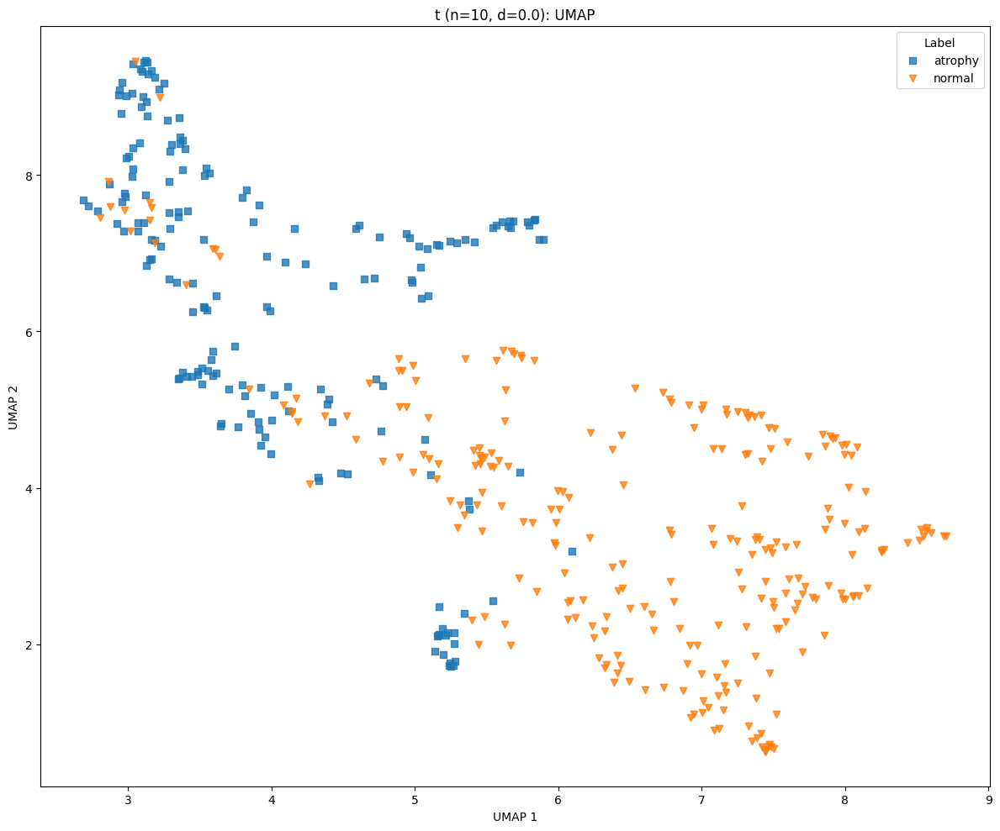

t: UMAP with n_neighbors=10, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


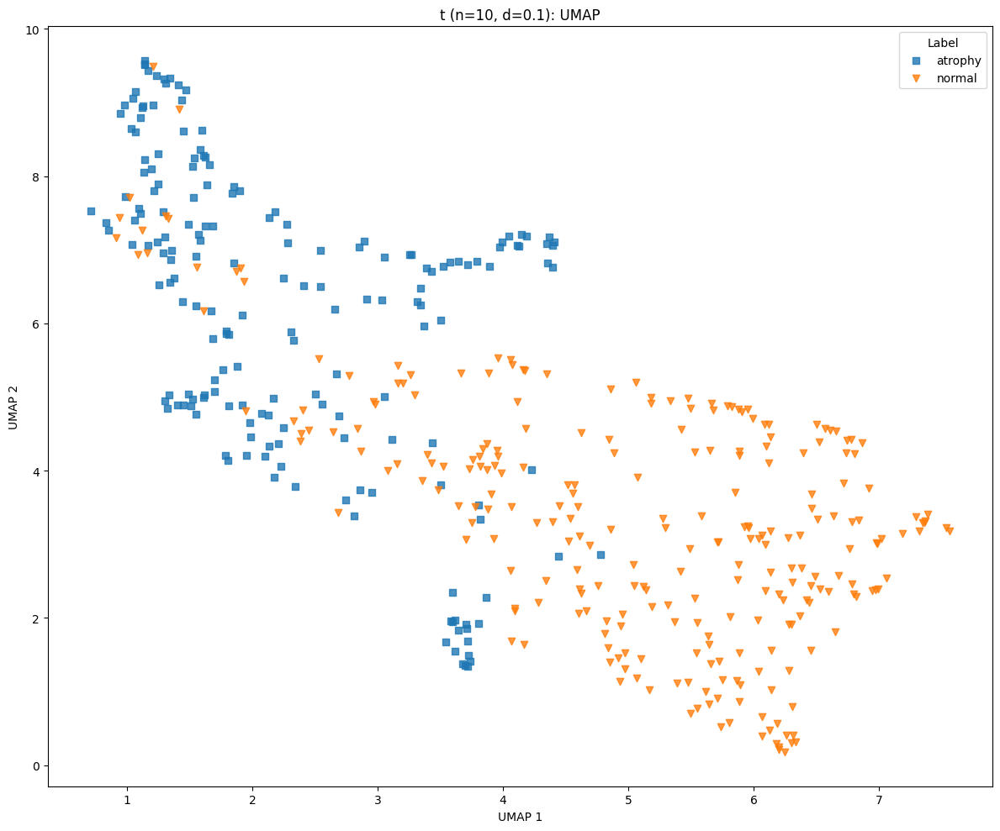

C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


t: UMAP with n_neighbors=10, min_dist=0.3


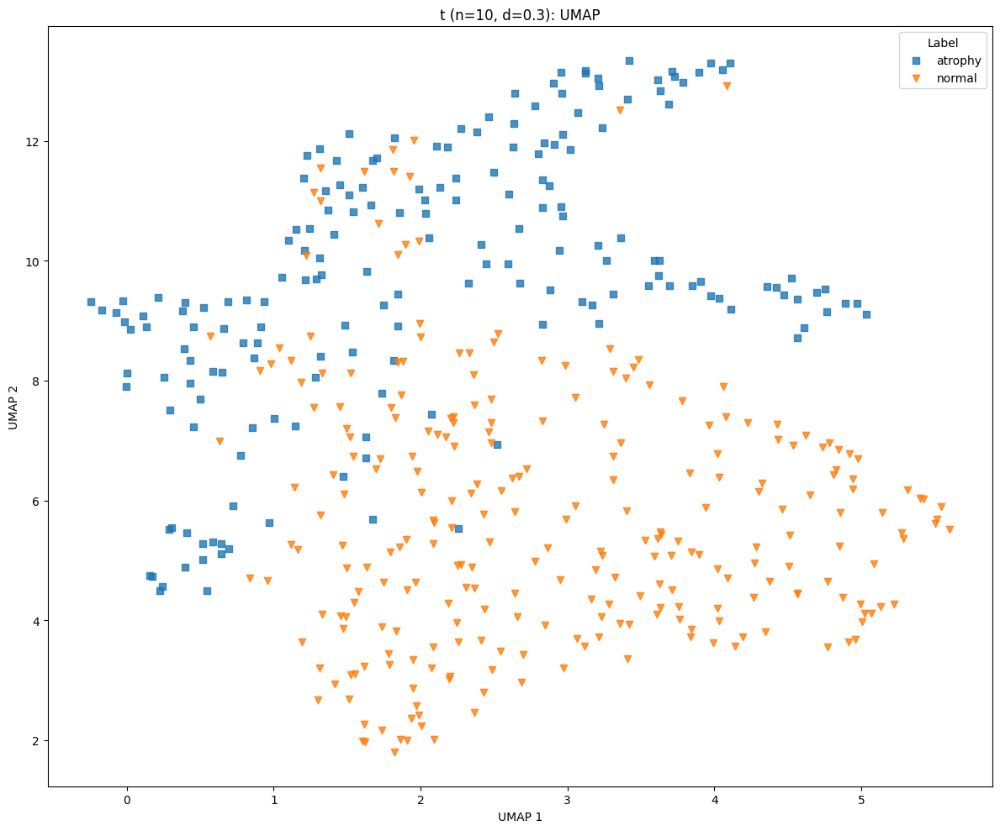

t: UMAP with n_neighbors=15, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


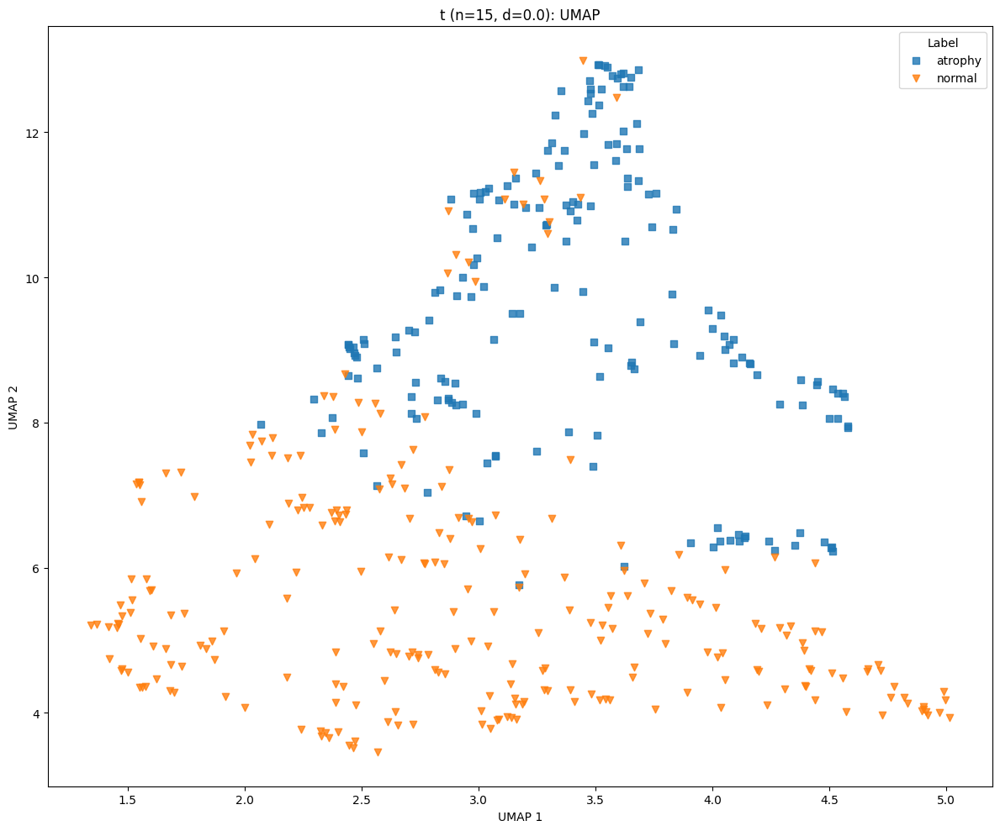

t: UMAP with n_neighbors=15, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


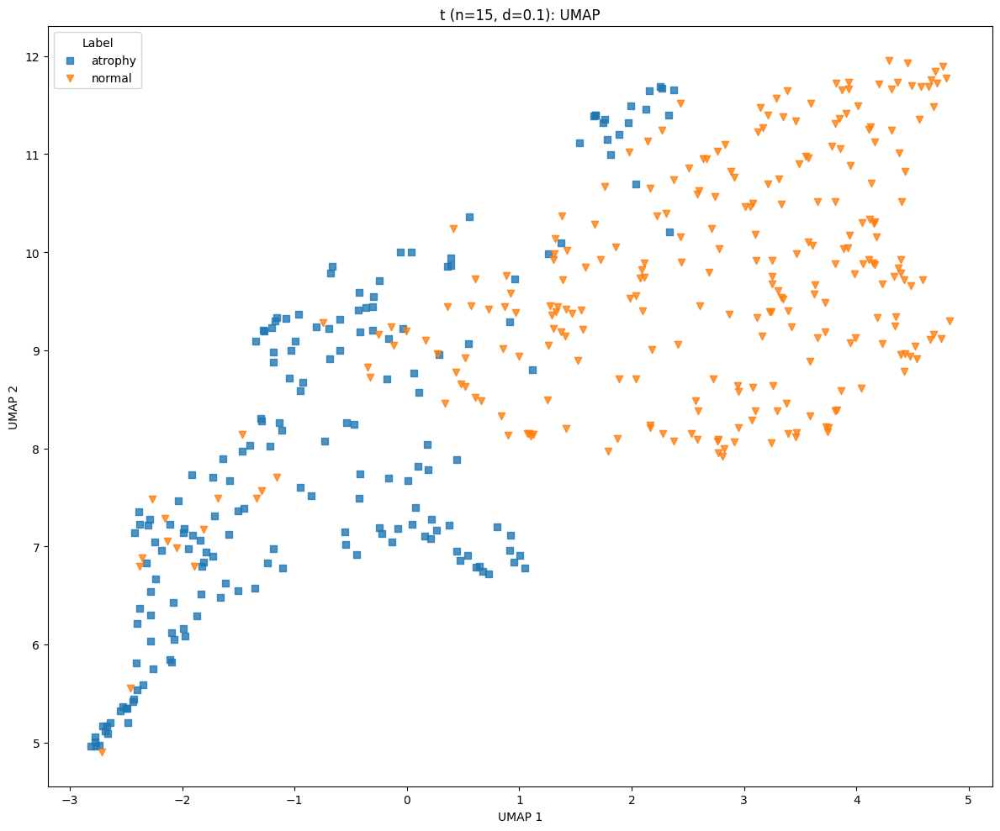

t: UMAP with n_neighbors=15, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


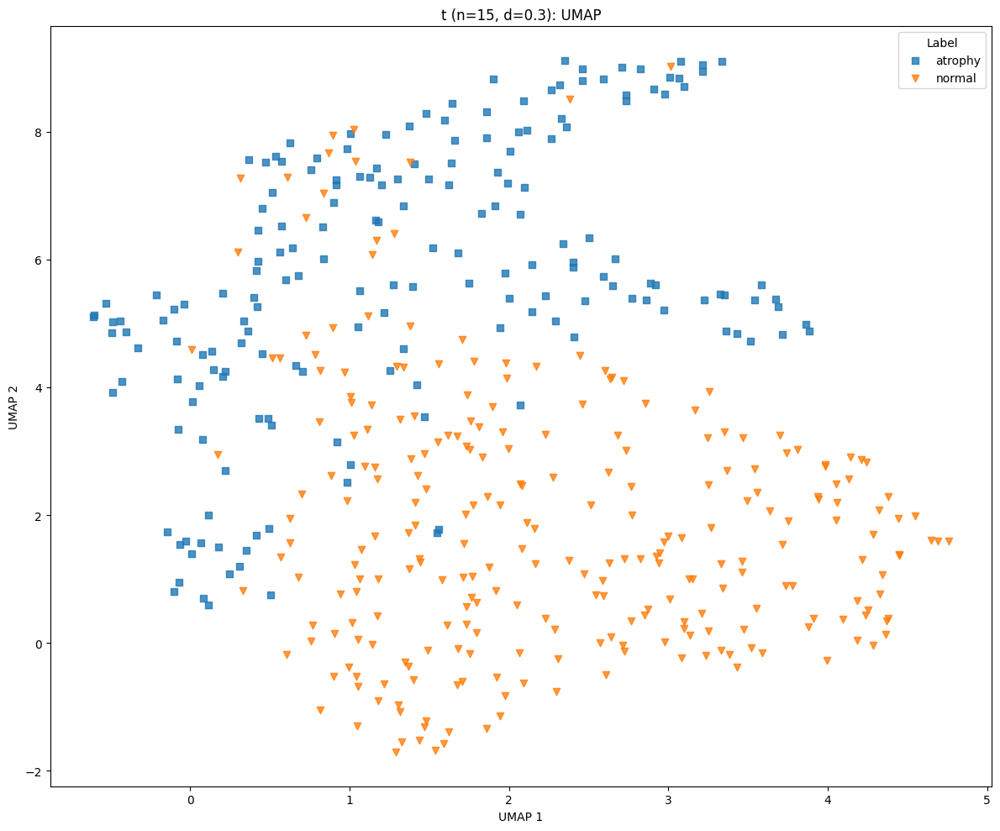

t: UMAP with n_neighbors=30, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


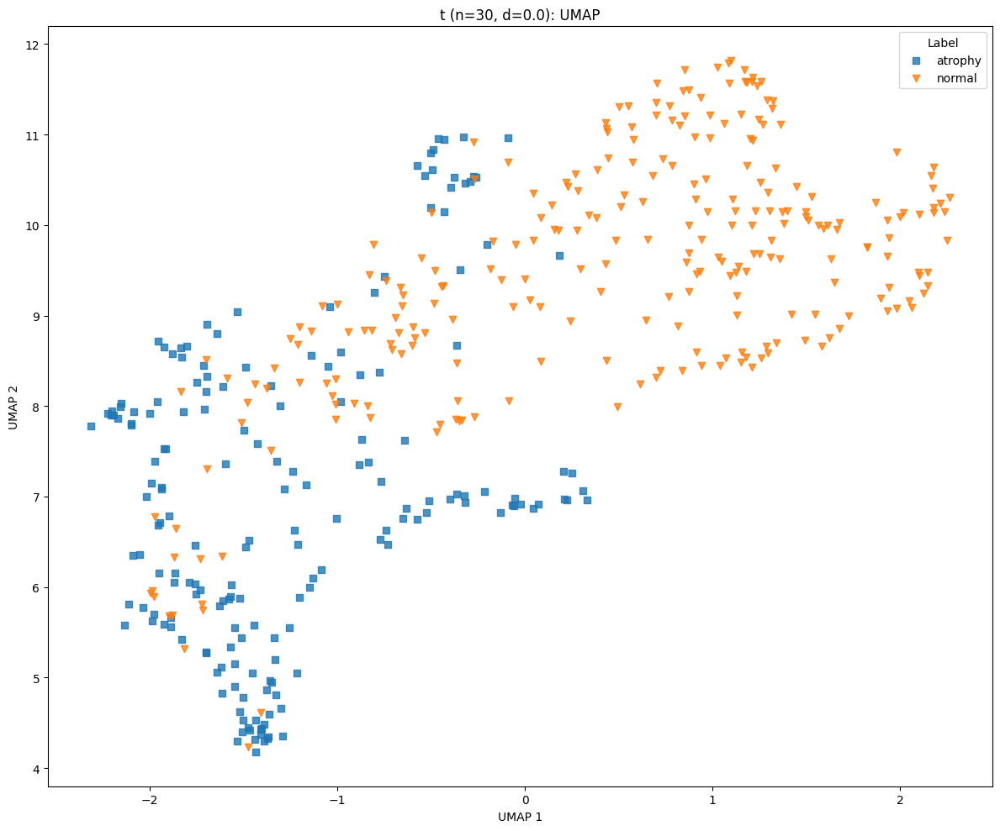

t: UMAP with n_neighbors=30, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


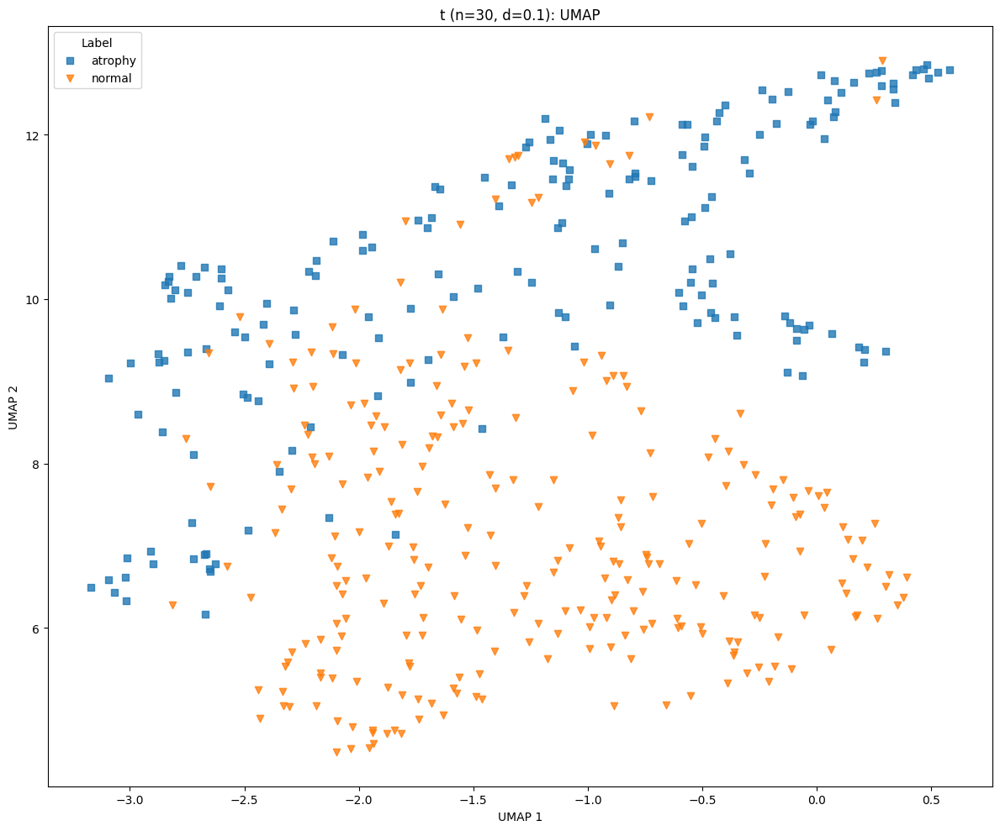

t: UMAP with n_neighbors=30, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


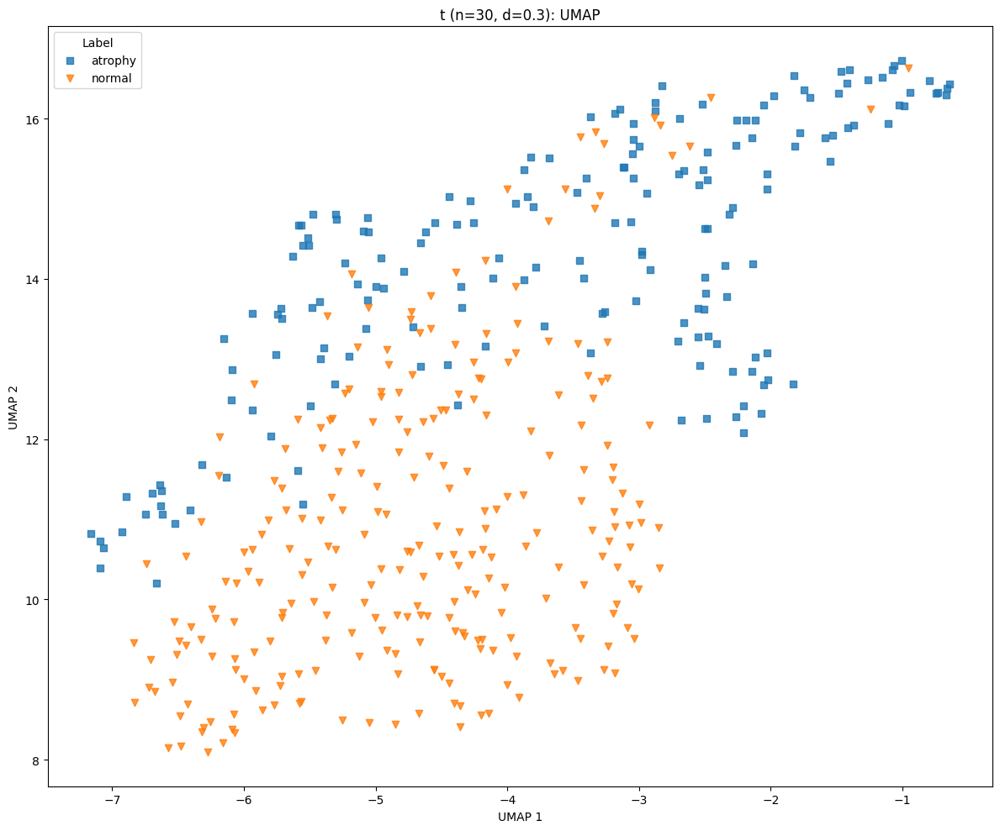

t: UMAP with n_neighbors=50, min_dist=0.0


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


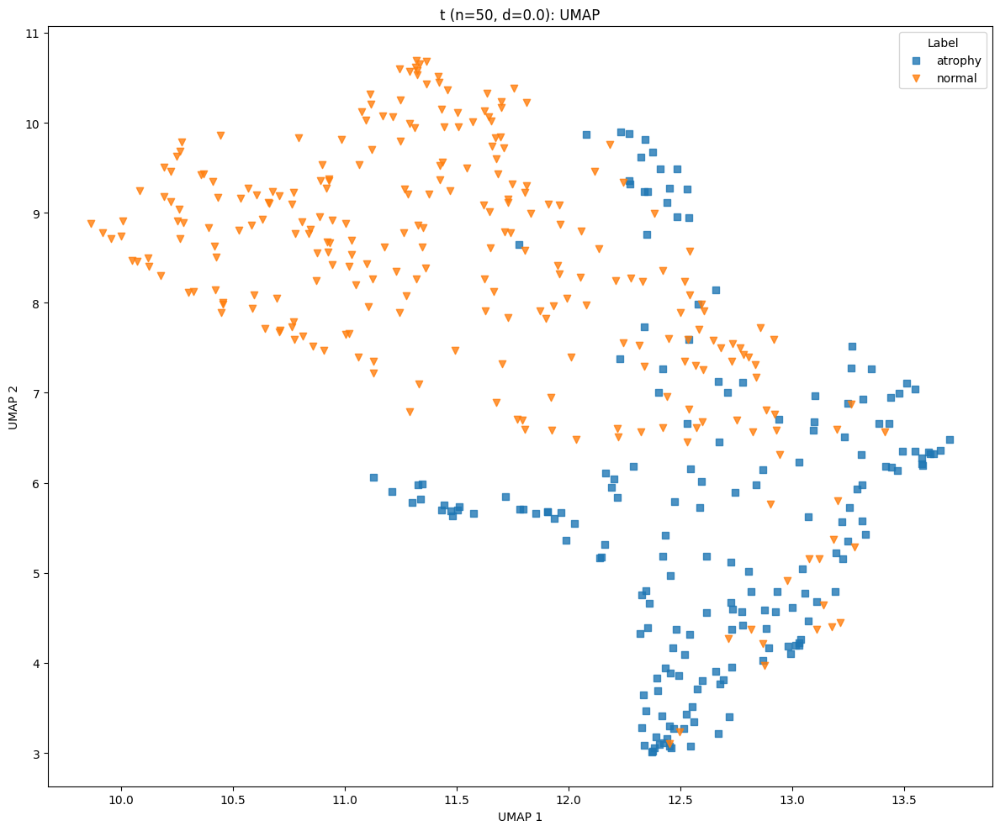

t: UMAP with n_neighbors=50, min_dist=0.1


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


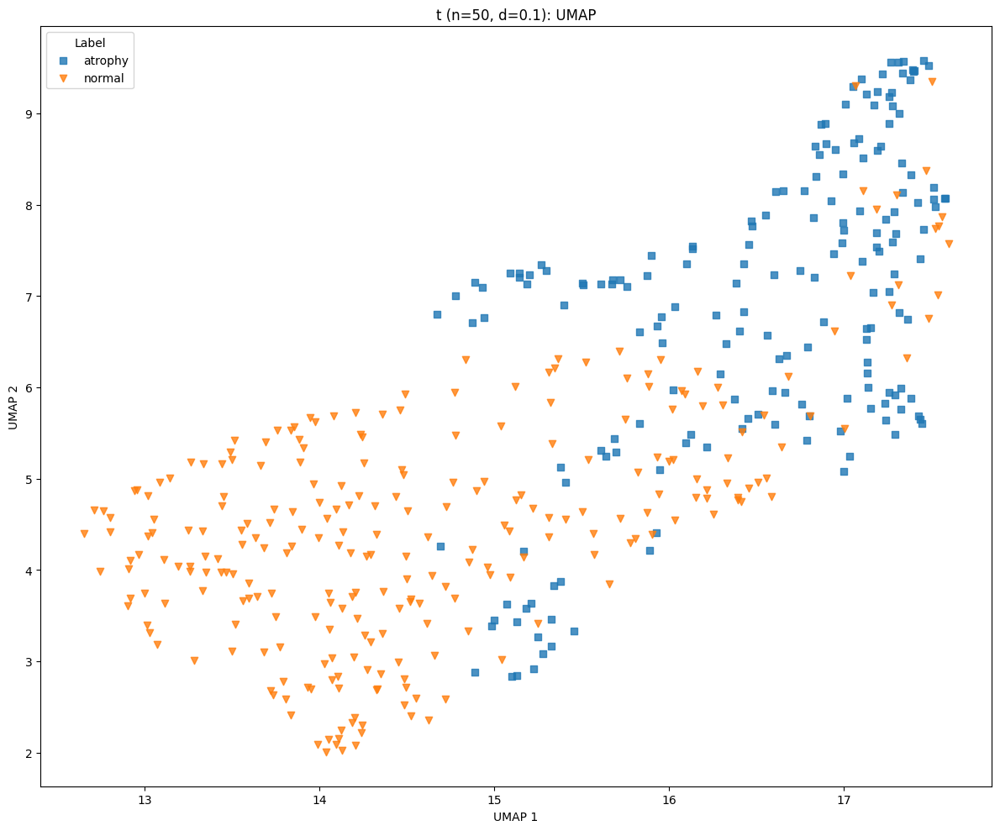

t: UMAP with n_neighbors=50, min_dist=0.3


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


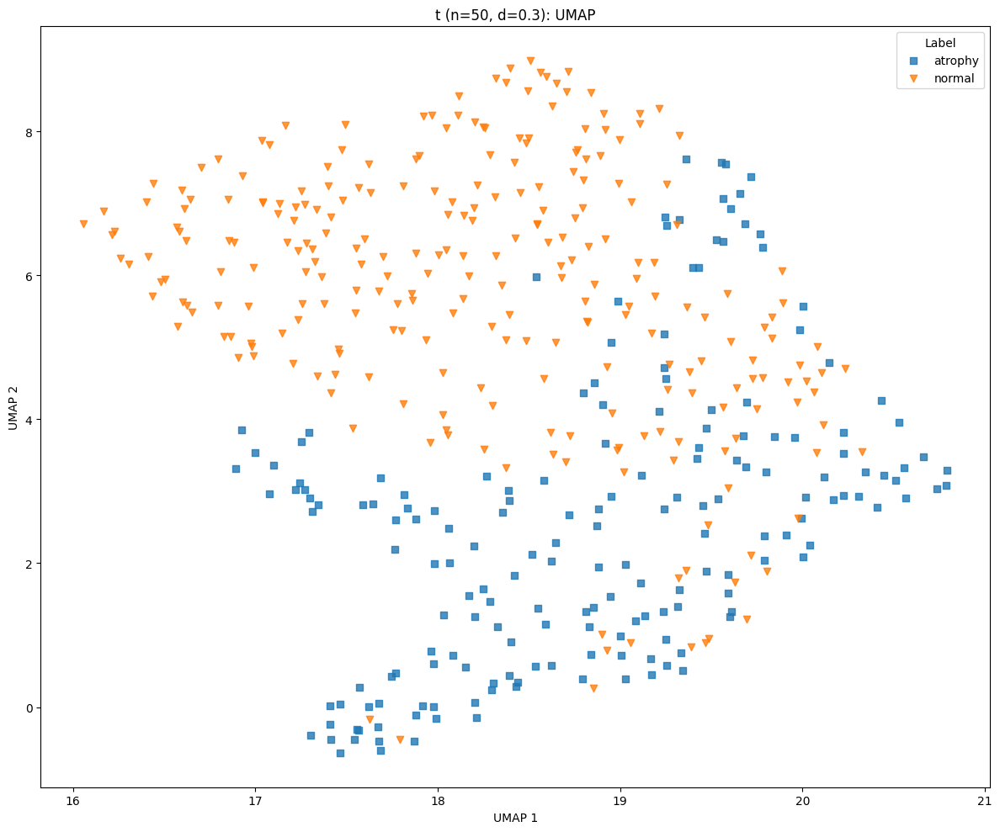

In [512]:
sweep_umap(X_t_subset, y_subset, dataset_name="t")

### LDA

In [ ]:

def plot_pc_1d(X_pc, y, pc_x=0, dataset_name="", cluster_labels=None):
    ix = pc_x

    fig, ax = plt.subplots(figsize=(20, 4))

    unique_labels = np.unique(y)
    markers = ["o", "^", "x", "d", "v", "P", "*"]
    marker_map = {
        label: markers[i % len(markers)] for i, label in enumerate(unique_labels)
    }

    if cluster_labels is None:
        for label, marker in marker_map.items():
            idx = (y == label)
            ax.scatter(
                X_pc[idx, ix],
                np.zeros(np.sum(idx)),
                marker=marker,
                label=label,
                alpha=0.8,
            )

        ax.legend(title="Label")

    else:
        cluster_labels = np.asarray(cluster_labels)
        clusters = np.unique(cluster_labels)
        cmap = plt.cm.get_cmap("tab10", len(clusters))

        for label, marker in marker_map.items():
            idx_label = (y == label)
            if not np.any(idx_label):
                continue

            colors_for_points = cmap(cluster_labels[idx_label])

            ax.scatter(
                X_pc[idx_label, ix],
                np.zeros(np.sum(idx_label)),
                marker=marker,
                c=colors_for_points,
                alpha=0.8,
                edgecolors="none",
                label=label,
            )

        # Legend 1: true labels 
        label_legend = ax.legend(title="True label (marker)", loc="upper left")

        # Legend 2: clusters 
        cluster_handles = [
            Line2D(
                [0], [0],
                marker="o",
                linestyle="none",
                color=cmap(c),
                label=f"cluster {c}",
            )
            for c in clusters
        ]
        ax.add_artist(label_legend)
        ax.legend(handles=cluster_handles, title="Cluster (color)", loc="upper right")

    ax.set_xlabel(f"LD{ix+1}")
    ax.set_yticks([])
    ax.set_title(dataset_name)
    plt.tight_layout()
    plt.show()


    ax.legend(title="Label")
    ax.set_xlabel(f"LD{ix+1}")
    ax.set_yticks([])
    ax.set_title(dataset_name)
    plt.show()


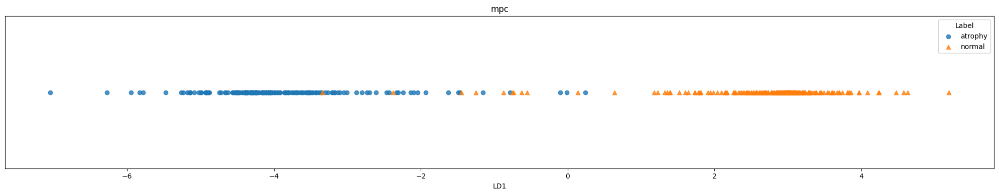

In [514]:
lda = LDA(n_components=1)
X_lda_mpc = lda.fit_transform(X_mpc_subset, y_subset)
plot_pc_1d(X_lda_mpc, y_subset, pc_x=0, dataset_name="mpc")

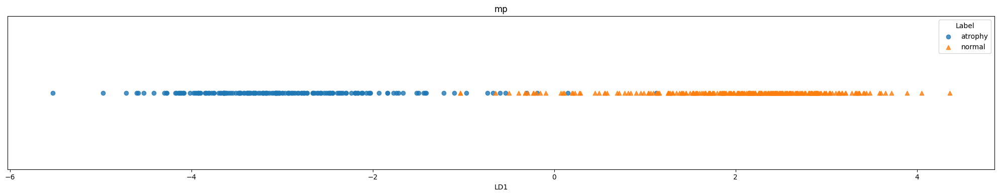

In [515]:
lda = LDA(n_components=1)
X_lda_mp = lda.fit_transform(X_mp_subset, y_subset)
plot_pc_1d(X_lda_mp, y_subset, pc_x=0, dataset_name="mp")

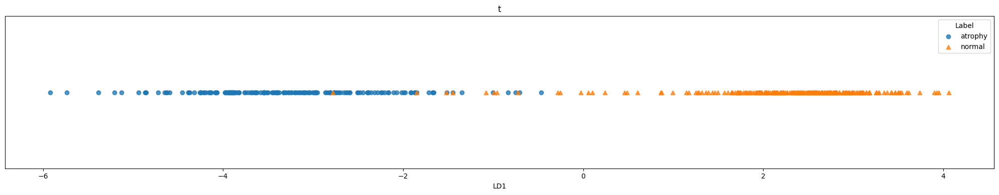

In [516]:
lda = LDA(n_components=1)
X_lda_t = lda.fit_transform(X_t_subset, y_subset)
plot_pc_1d(X_lda_t, y_subset, pc_x=0, dataset_name="t")

C:\Users\olset\AppData\Local\Temp\ipykernel_6868\3642817767.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


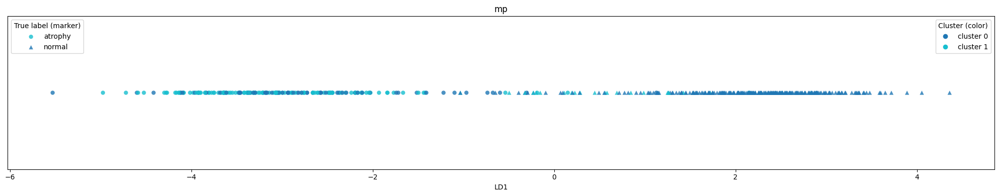

In [ ]:
spectral_labels_mp = run_spectral(
    X_mp_subset,
    n_clusters=2,
    n_neighbors=15,
    random_state=0,
)
lda = LDA(n_components=1)
X_lda_mp = lda.fit_transform(X_mp_subset, y_subset)

plot_pc_1d(
    X_lda_mp,
    y_subset,
    pc_x=0,
    dataset_name="mp",
    cluster_labels=spectral_labels_mp,   
)


## Leiden clustering

In [518]:
def run_leiden(X, n_neighbors=15, resolution=1.0, random_state=0):
    """Run Leiden clustering on X (n_samples, n_features)."""
    knn_graph = kneighbors_graph(X, n_neighbors=n_neighbors, include_self=False).tocsr()

    sources, targets = knn_graph.nonzero()
    g = ig.Graph(zip(sources, targets), directed=False)
    g.es["weight"] = knn_graph.data

    partition = la.find_partition(
        g,
        la.RBConfigurationVertexPartition,
        weights="weight",
        resolution_parameter=resolution,
        seed=random_state,
    )

    return np.array(partition.membership)


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\olset\AppData\Local\Temp\ipykernel_6868\3170018285.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


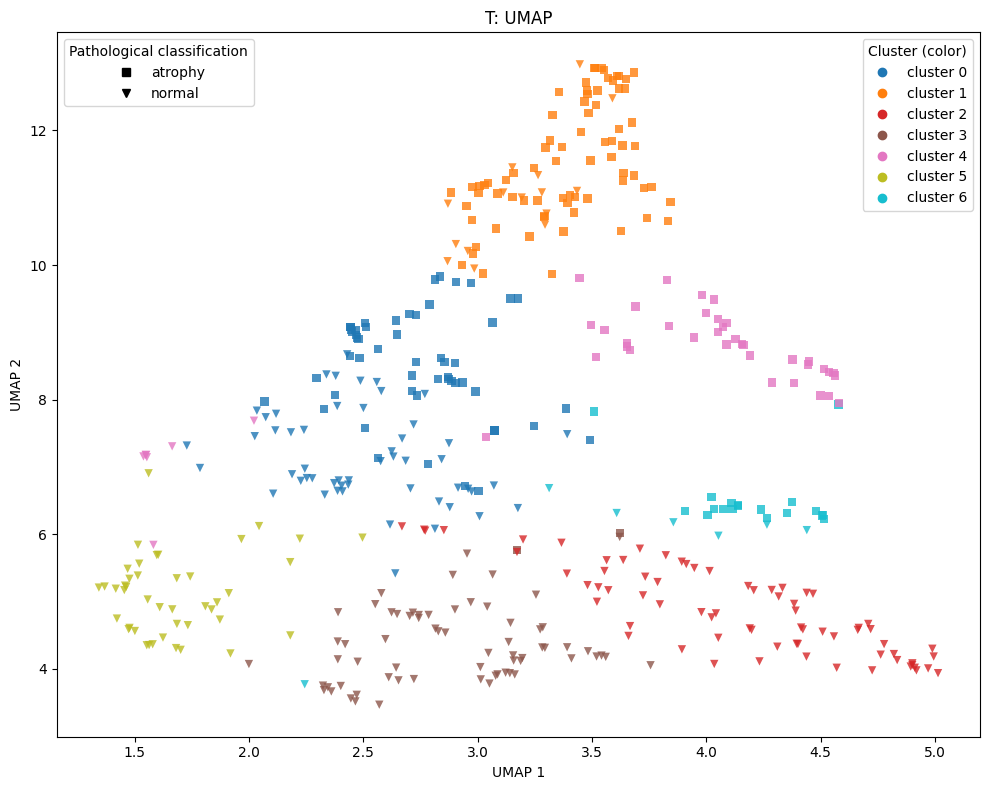

In [ ]:
# 1. Leiden-clustering
leiden_labels_t = run_leiden(
    X_t_subset,
    n_neighbors=15,
    resolution=1.0,
    random_state=0,
)

# 2. UMAP-embedding
umap_model = umap.UMAP(
    n_neighbors=15,
    min_dist=0.0,
    n_components=2,
    random_state=0,
)
X_umap_t = umap_model.fit_transform(X_t_subset)

# 3. Plot:
plot_umap_subset(
    X_umap_t,
    y_subset,                 
    dataset_name="T",
    cluster_labels=leiden_labels_t,
)


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\olset\AppData\Local\Temp\ipykernel_6868\3170018285.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


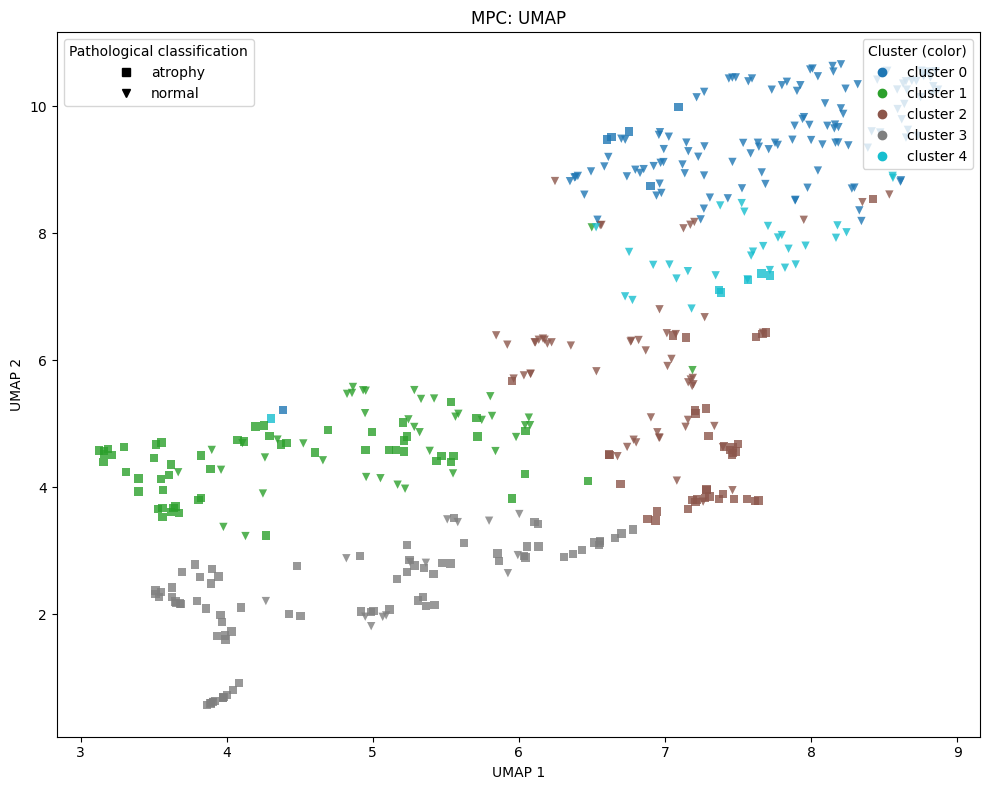

In [ ]:
# 1. Leiden-clustering
leiden_labels_mpc = run_leiden(
    X_mpc_subset,
    n_neighbors=15,
    resolution=1.0,
    random_state=0,
)

# 2. UMAP-embedding 
umap_model = umap.UMAP(
    n_neighbors=10,
    min_dist=0.0,
    n_components=2,
    random_state=0,
)
X_umap_mpc = umap_model.fit_transform(X_mpc_subset)

# 3. Plot:
plot_umap_subset(
    X_umap_mpc,
    y_subset,                 
    dataset_name="MPC",
    cluster_labels=leiden_labels_mpc,
)


C:\Users\olset\AppData\Roaming\Python\Python310\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\olset\AppData\Local\Temp\ipykernel_6868\3170018285.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10", len(clusters))


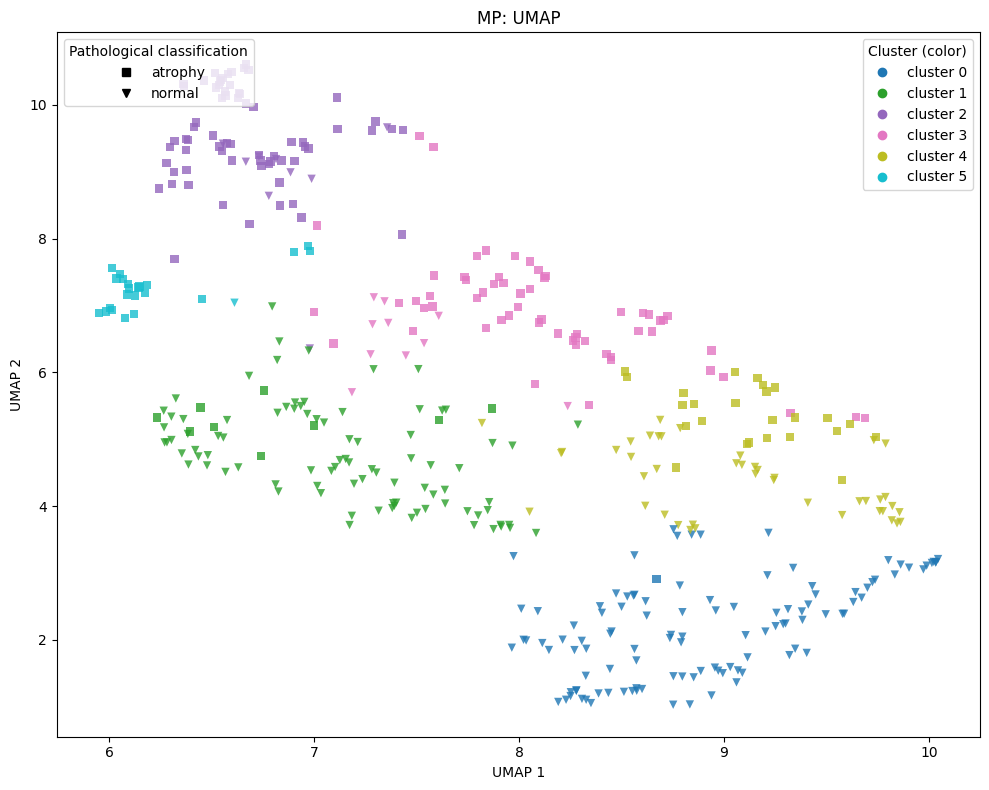

0.018


In [ ]:
# 1. Leiden-clustering
leiden_labels_mp = run_leiden(
    X_mp_subset,
    n_neighbors=15,
    resolution=1.0,
    random_state=0,
)

# 2. UMAP-embedding
umap_model = umap.UMAP(
    n_neighbors=10,
    min_dist=0.0,
    n_components=2,
    random_state=0,
)
X_umap_mp = umap_model.fit_transform(X_mp_subset)

# 3. Plot:
plot_umap_subset(
    X_umap_mp,
    y_subset,                 
    dataset_name="MP",
    cluster_labels=leiden_labels_mp,
)
